In [3]:
import math
import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error #均方误差
from sklearn.metrics import mean_absolute_error #平方绝对误差
from sklearn.metrics import r2_score # R square
from sktime.forecasting.model_selection import temporal_train_test_split

#显示所有列
pd.set_option('display.max_columns', None)

#显示所有行
pd.set_option('display.max_rows', None)

In [2]:
def one_factor_plt(series,str):
    plt.rcParams['axes.unicode_minus']=False # 用来正常显示负号
    plt.rcParams['font.sans-serif']=['SimHei'] # 正常显示中文
    fig,left_axis=plt.subplots(figsize = (10,6))
    series.plot(color = 'red')
    plt.legend(labels = [str], loc = 'upper left', fontsize=23)
    plt.tick_params(labelsize=20)
    plt.xlabel("")
    
def two_factor_plt(series1,str1,series2,str2):
    plt.rcParams['axes.unicode_minus']=False # 用来正常显示负号
    plt.rcParams['font.sans-serif']=['SimHei'] # 正常显示中文
    fig,left_axis=plt.subplots(figsize = (10,6))
    series1.plot(color = 'red', label = str1)
    plt.tick_params(labelsize=20)
    right_axis = left_axis.twinx()
    series2.plot(color = 'darkblue', label = str2)
    fig.legend(loc=2, fontsize=23)
    left_axis.set_xlabel("")
    left_axis.set_ylabel(str1,fontsize=20)
    right_axis.set_ylabel(str2,fontsize=20)
    plt.tick_params(labelsize=20)

def Logarithmic_year(series):
    series = np.log(series)
    xx = series.diff(12)
    xx.fillna(0,inplace=True)
    x = xx/(series - xx)
    return x

def year_Logarithmic(series):
    xx = series.diff(12)
    xx.fillna(0,inplace=True)
    x = xx/(series - xx)
    return np.log(x)

In [45]:
# 增长因子的构建
factor1_data1 = pd.read_csv('final/恒生指数.csv',engine="python",encoding='utf-8')
factor1_data2 = pd.read_csv('final/CRB现货指数_综合.csv',engine="python",encoding='utf-8')
factor1_data3 = pd.read_csv('final/南华沪铜指数.csv',engine="python",encoding='utf-8')
factor1_diff = pd.read_csv('final/H30374.csv',engine="python",encoding='utf-8')

factor1_data1['日期'] = pd.to_datetime(factor1_data1['日期']).dt.normalize()
factor1_data1 = factor1_data1.set_index('日期')
factor1_data1 = factor1_data1.sort_index(ascending=True)

factor1_data2['日期'] = pd.to_datetime(factor1_data2['日期']).dt.normalize()
factor1_data2 = factor1_data2.set_index('日期')
factor1_data2 = factor1_data2.sort_index(ascending=True)

factor1_data3['日期'] = pd.to_datetime(factor1_data3['日期']).dt.normalize()
factor1_data3 = factor1_data3.set_index('日期')
factor1_data3 = factor1_data3.sort_index(ascending=True)

factor1_diff['日期'] = pd.to_datetime(factor1_diff['日期']).dt.normalize()
factor1_diff = factor1_diff.set_index('日期')
factor1_diff = factor1_diff.sort_index(ascending=True)

factor1_data1 = pd.Series(factor1_data1['恒生指数'].values, index = factor1_data1.index)
factor1_data2 = pd.Series(factor1_data2['CRB现货指数:综合'].values, index = factor1_data2.index)
factor1_data3 = pd.Series(factor1_data3['南华沪铜指数'].values, index = factor1_data3.index)
factor1_diff = pd.Series(factor1_diff['收盘价'].values, index = factor1_diff.index)

factor1_data1 = factor1_data1.resample('BM').bfill()
factor1_data2 = factor1_data2.resample('BM').bfill()
factor1_data3 = factor1_data3.resample('BM').bfill()
factor1_diff = factor1_diff.resample('BM').bfill()

0.45026539456037395
0.2792880316929903
0.2704465737466357


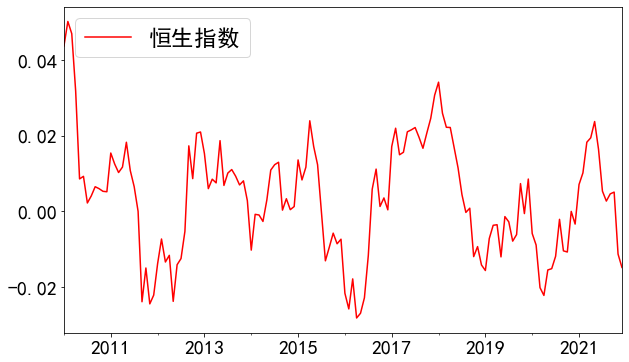

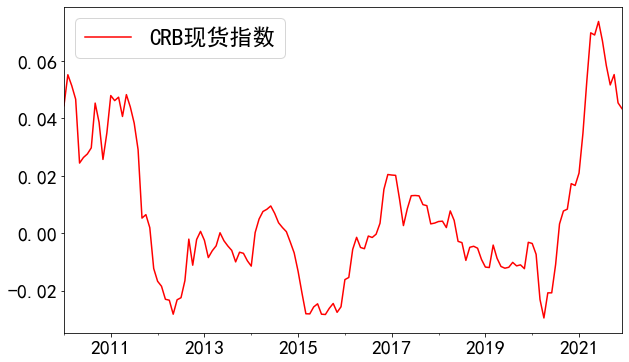

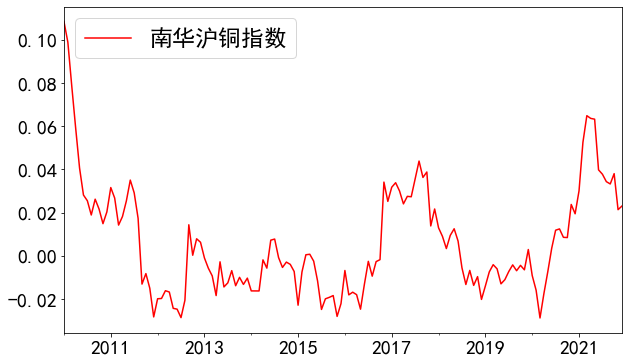

In [46]:
# 取对数同比
factor1_data1_x = Logarithmic_year(factor1_data1)

factor1_data2_x = Logarithmic_year(factor1_data2)

factor1_data3_x = Logarithmic_year(factor1_data3)

sum = np.reciprocal(factor1_data1_x[12:].std())+np.reciprocal(factor1_data2_x[12:].std())+np.reciprocal(factor1_data3_x[12:].std())
factor1_data1_n = np.reciprocal(factor1_data1_x[12:].std())/sum
factor1_data2_n = np.reciprocal(factor1_data2_x[12:].std())/sum
factor1_data3_n = np.reciprocal(factor1_data3_x[12:].std())/sum

one_factor_plt(factor1_data1_x[12:],"恒生指数")
print(factor1_data1_n)
one_factor_plt(factor1_data2_x[12:],"CRB现货指数")
print(factor1_data2_n)
one_factor_plt(factor1_data3_x[12:],"南华沪铜指数")
print(factor1_data3_n)

0.45026539456037395 0.2792880316929903 0.2704465737466357


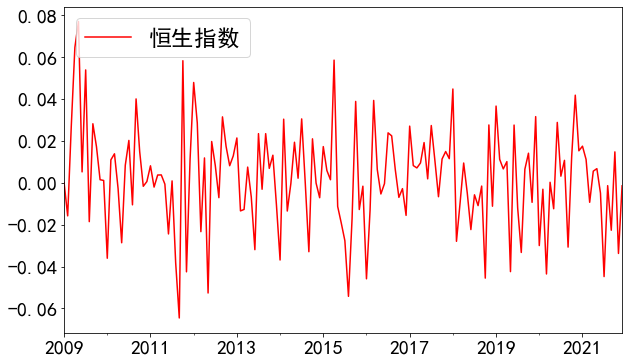

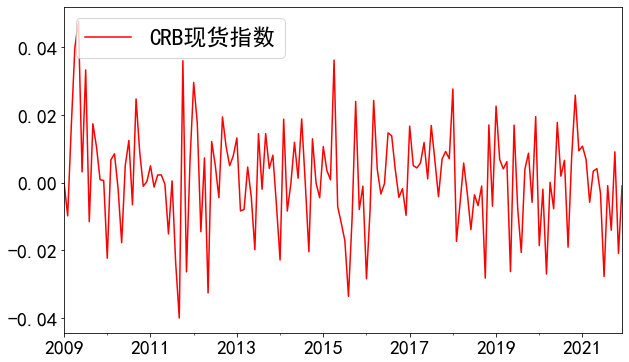

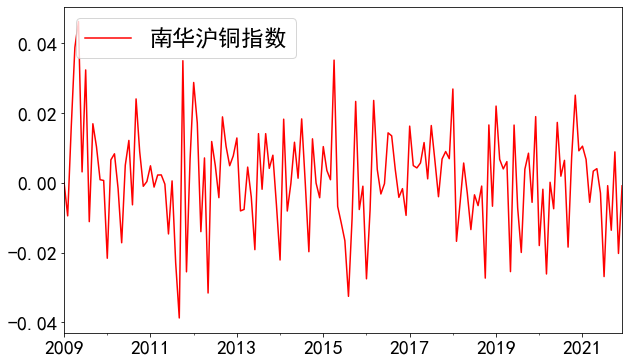

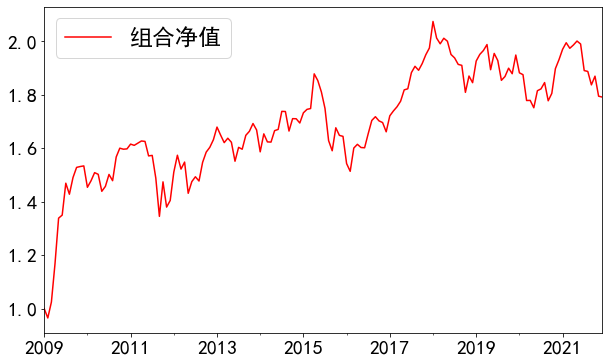

In [47]:
# 取环比收益
factor1_data1_y = factor1_data1.pct_change()
factor1_data1_y.fillna(0,inplace=True)

factor1_data2_y = factor1_data1.pct_change()
factor1_data2_y.fillna(0,inplace=True)

factor1_data3_y = factor1_data1.pct_change()
factor1_data3_y.fillna(0,inplace=True)

one_factor_plt(factor1_data1_y*factor1_data1_n,"恒生指数")
one_factor_plt(factor1_data2_y*factor1_data2_n,"CRB现货指数")
one_factor_plt(factor1_data3_y*factor1_data3_n,"南华沪铜指数")

factor1 = factor1_data1_y*factor1_data1_n + factor1_data2_y*factor1_data2_n + factor1_data3_y*factor1_data3_n
factor1[0] = 1
factor1 = factor1.cumsum()
one_factor_plt(factor1,"组合净值")
print(factor1_data1_n, factor1_data2_n, factor1_data3_n)

          A         B
A  1.000000  0.807684
B  0.807684  1.000000


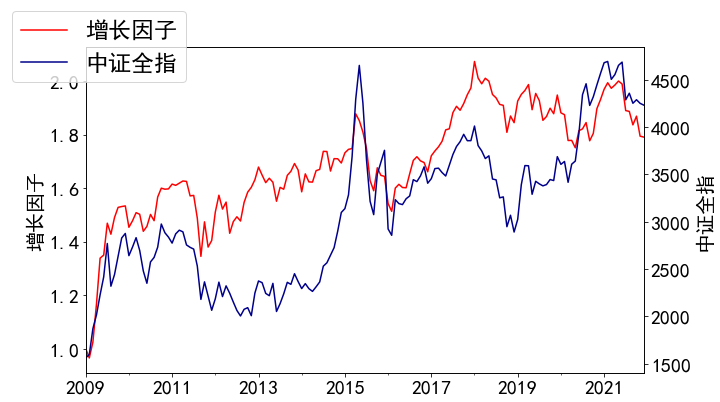

In [48]:
two_factor_plt(factor1,"增长因子",factor1_diff,"中证全指")
data = pd.DataFrame({'A':factor1, 'B':factor1_diff})
print(data.corr('spearman'))

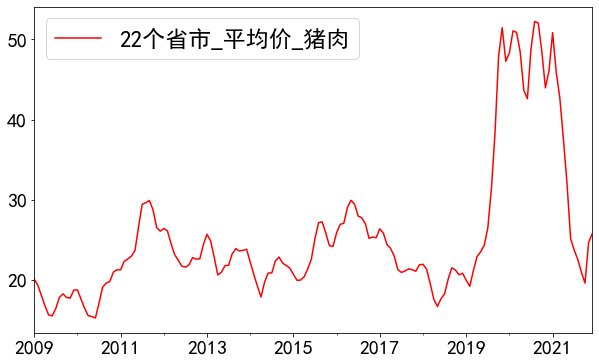

In [56]:
# 生活端通货膨胀因子的构建
factor2_data1 = pd.read_csv('final/22个省市_平均价_猪肉.csv',engine="python",encoding='utf-8')
factor2_diff = pd.read_csv('final/CPI.csv',engine="python",encoding='utf-8')

factor2_data1['日期'] = pd.to_datetime(factor2_data1['日期']).dt.normalize()
factor2_data1 = factor2_data1.set_index('日期')
factor2_data1 = factor2_data1.sort_index(ascending=True)

factor2_diff['日期'] = pd.to_datetime(factor2_diff['日期']).dt.normalize()
factor2_diff = factor2_diff.set_index('日期')
factor2_diff = factor2_diff.sort_index(ascending=True)

factor2_data1 = pd.Series(factor2_data1['猪肉'].values, index = factor2_data1.index)
factor2_diff = pd.Series(factor2_diff['CPI'].values, index = factor2_diff.index)

factor2_data1 = factor2_data1.resample('BM').mean()
factor2_diff = factor2_diff.resample('BM').mean()
one_factor_plt(factor2_data1,"22个省市_平均价_猪肉")

          A         B
A  1.000000  0.600086
B  0.600086  1.000000


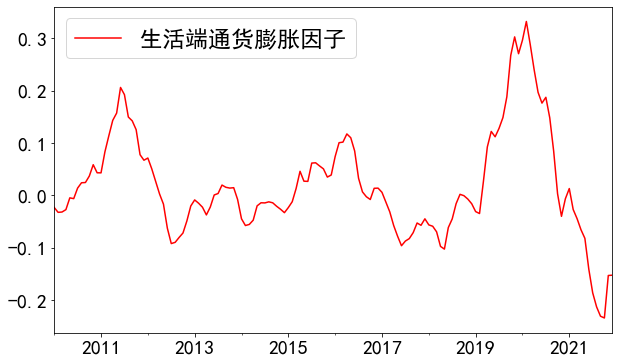

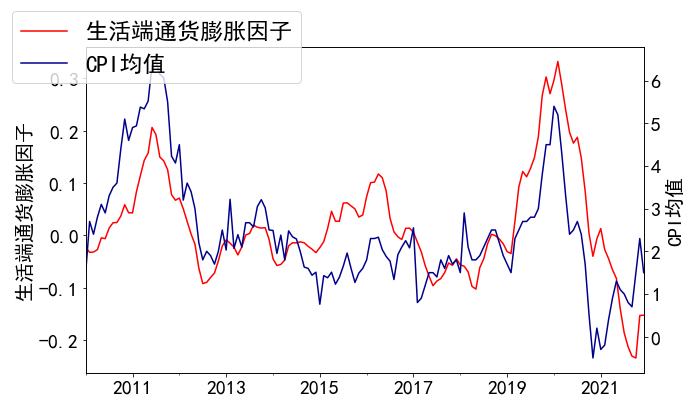

In [55]:
factor2 = Logarithmic_year(series = factor2_data1)
one_factor_plt(factor2[12:],"生活端通货膨胀因子")
two_factor_plt(factor2[12:],"生活端通货膨胀因子",factor2_diff[12:],"CPI均值")
data = pd.DataFrame({'A':factor2[12:], 'B':factor2_diff[12:]})
print(data.corr('spearman'))

In [57]:
# 生产端通货膨胀因子的构建
factor3_data1 = pd.read_csv('final/期货结算价(连续)_布伦特原油.csv',engine="python",encoding='utf-8')
factor3_data2 = pd.read_csv('final/期货结算价(连续)_螺纹钢.csv',engine="python",encoding='utf-8')
factor3_diff = pd.read_csv('final/PPI_定基指数.csv',engine="python",encoding='utf-8')

factor3_data1['日期'] = pd.to_datetime(factor3_data1['日期']).dt.normalize()
factor3_data1 = factor3_data1.set_index('日期')
factor3_data1 = factor3_data1.sort_index(ascending=True)

factor3_data2['日期'] = pd.to_datetime(factor3_data2['日期']).dt.normalize()
factor3_data2 = factor3_data2.set_index('日期')
factor3_data2 = factor3_data2.sort_index(ascending=True)

factor3_diff['日期'] = pd.to_datetime(factor3_diff['日期']).dt.normalize()
factor3_diff = factor3_diff.set_index('日期')
factor3_diff = factor3_diff.sort_index(ascending=True)

factor3_data1 = pd.Series(factor3_data1['布伦特原油'].values, index = factor3_data1.index)
factor3_data2 = pd.Series(factor3_data2 ['螺纹钢'].values, index = factor3_data2.index)
factor3_diff = pd.Series(factor3_diff['PPI'].values, index = factor3_diff.index)

factor3_data1 = factor3_data1.resample('BM').bfill()
factor3_data2 = factor3_data2.resample('BM').bfill()
factor3_diff = factor3_diff.resample('BM').bfill()

0.26357086388680784
0.7364291361131922


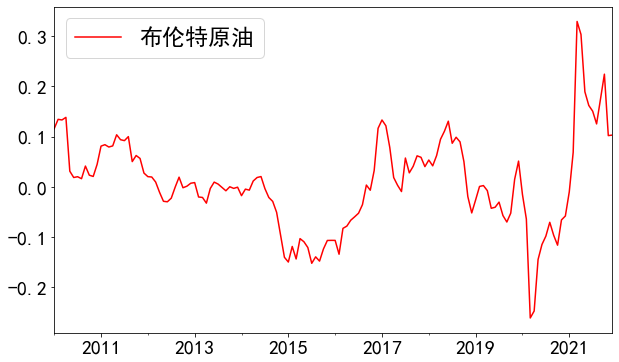

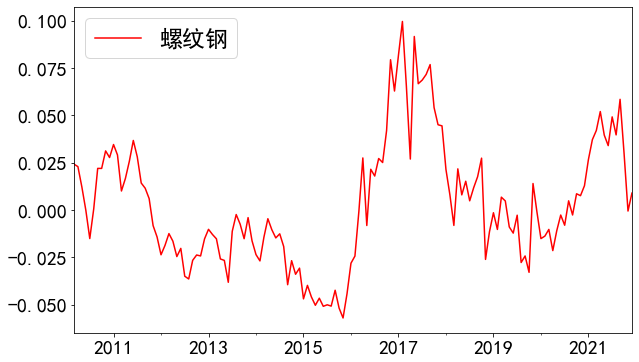

In [58]:
# 取对数同比
factor3_data1_x = Logarithmic_year(factor3_data1)

factor3_data2_x = Logarithmic_year(factor3_data2)

sum = np.reciprocal(factor3_data1_x[12:].std())+np.reciprocal(factor3_data2_x[12:].std())
factor3_data1_n = np.reciprocal(factor3_data1_x[12:].std())/sum
factor3_data2_n = np.reciprocal(factor3_data2_x[12:].std())/sum

one_factor_plt(factor3_data1_x[12:],"布伦特原油")
print(factor3_data1_n)
one_factor_plt(factor3_data2_x[12:],"螺纹钢")
print(factor3_data2_n)

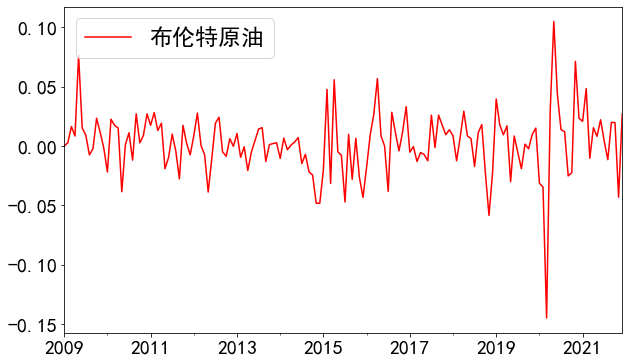

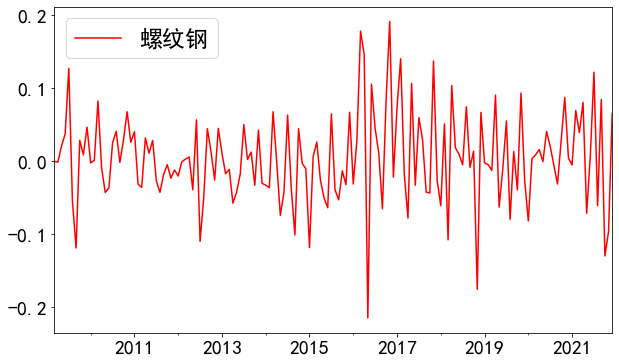

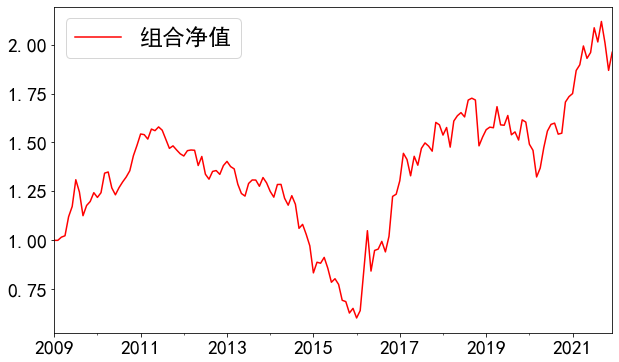

In [59]:
# 取环比收益
factor3_data1_y = factor3_data1.pct_change()
factor3_data1_y.fillna(0,inplace=True)

factor3_data2_y = factor3_data2.pct_change()
factor3_data2_y.fillna(0,inplace=True)

one_factor_plt(factor3_data1_y*factor3_data1_n,"布伦特原油")
one_factor_plt(factor3_data2_y*factor3_data2_n,"螺纹钢")

factor3 = factor3_data1_y*factor3_data1_n + factor3_data2_y*factor3_data2_n
factor3.fillna(0,inplace = True)
factor3[0] = 1
factor3 = factor3.cumsum()
factor3
one_factor_plt(factor3,"组合净值")

          A         B
A  1.000000  0.920665
B  0.920665  1.000000


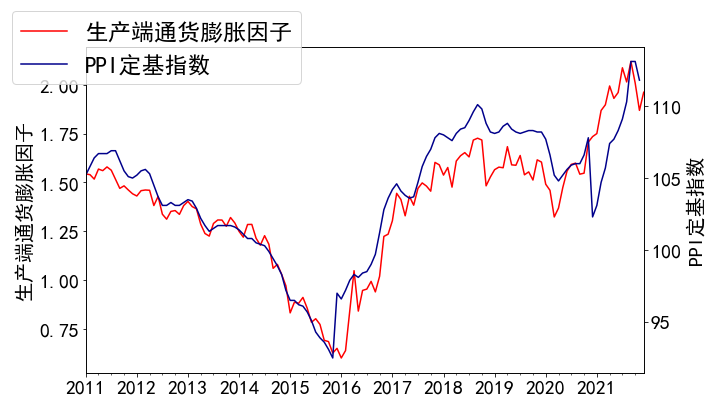

In [70]:
two_factor_plt(factor3,"生产端通货膨胀因子",factor3_diff,"PPI定基指数")
data = pd.DataFrame({'A':factor3[12:], 'B':factor3_diff[12:]})
print(data.corr('spearman'))

In [61]:
# 构建利率因子
factor4_data = pd.read_csv('final/中债-国债.csv',engine="python",encoding='utf-8')
factor4_diff1 = pd.read_csv('final/国债到期收益率_1年.csv',engine="python",encoding='utf-8')
factor4_diff2 = pd.read_csv('final/国债到期收益率_10年.csv',engine="python",encoding='utf-8')

factor4_data['日期'] = pd.to_datetime(factor4_data['日期']).dt.normalize()
factor4_data = factor4_data.set_index('日期')
factor4_data = factor4_data.sort_index(ascending=True)

factor4_diff1['日期'] = pd.to_datetime(factor4_diff1['日期']).dt.normalize()
factor4_diff1 = factor4_diff1.set_index('日期')
factor4_diff1 = factor4_diff1.sort_index(ascending=True)

factor4_diff2['日期'] = pd.to_datetime(factor4_diff2['日期']).dt.normalize()
factor4_diff2 = factor4_diff2.set_index('日期')
factor4_diff2 = factor4_diff2.sort_index(ascending=True)

factor4_data = pd.Series(factor4_data['中债-国债'].values, index = factor4_data.index)
factor4_diff1 = pd.Series(factor4_diff1['国债到期收益率:1年'].values, index = factor4_diff1.index)
factor4_diff2 = pd.Series(factor4_diff2['国债到期收益率:10年'].values, index = factor4_diff2.index)

factor4_data = factor4_data.resample('BM').bfill()
factor4_diff1 = factor4_diff1.resample('BM').bfill()
factor4_diff2 = factor4_diff2.resample('BM').bfill()

          A         B
A  1.000000  0.549129
B  0.549129  1.000000


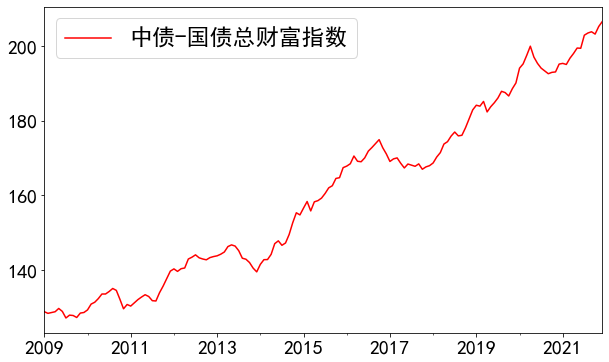

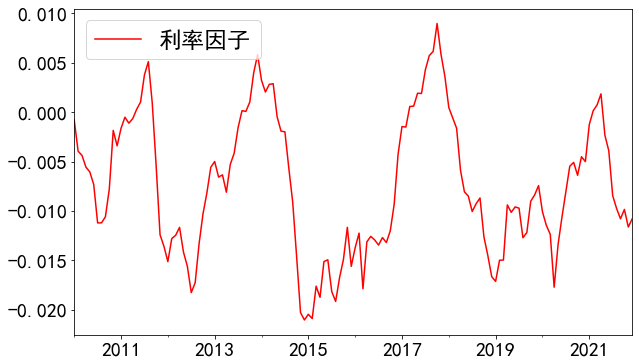

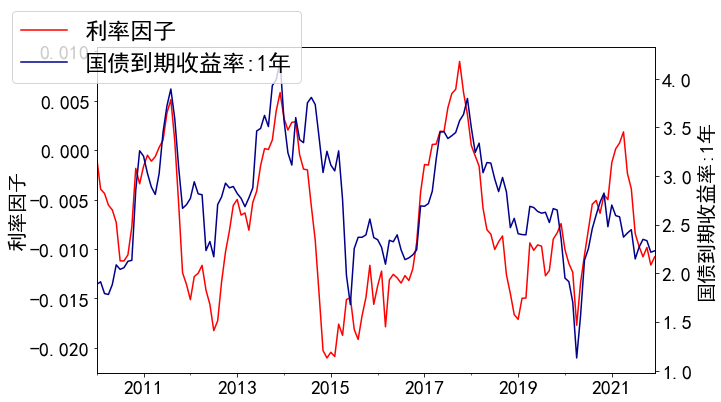

In [62]:
factor4 = Logarithmic_year(factor4_data)
factor4 = -factor4
one_factor_plt(factor4_data,'中债-国债总财富指数')
one_factor_plt(factor4[12:],'利率因子')
two_factor_plt(factor4[12:],'利率因子',factor4_diff1[12:],'国债到期收益率:1年')
data = pd.DataFrame({'A':factor4[12:], 'B':factor4_diff1[12:]})
print(data.corr('spearman'))

          A         B
A  1.000000  0.556377
B  0.556377  1.000000


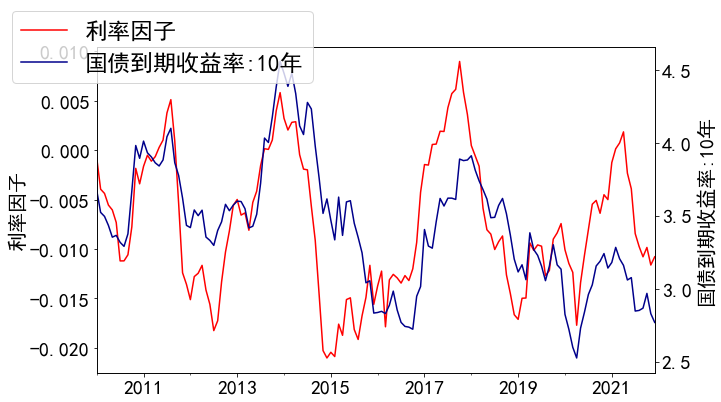

In [63]:
two_factor_plt(factor4[12:],'利率因子',factor4_diff2[12:],'国债到期收益率:10年')
data = pd.DataFrame({'A':factor4[12:], 'B':factor4_diff2[12:]})
print(data.corr('spearman'))

In [65]:
# 构建汇率因子
factor5_data1 = pd.read_csv('final/上海金交所黄金现货_收盘价_Au9999.csv',engine="python",encoding='utf-8')
factor5_data2 = pd.read_csv('final/伦敦金现_IDC.csv',engine="python",encoding='utf-8')
factor5_diff = pd.read_csv('final/中间价_美元兑人民币.csv',engine="python",encoding='utf-8')

factor5_data1['日期'] = pd.to_datetime(factor5_data1['日期']).dt.normalize()
factor5_data1 = factor5_data1.set_index('日期')
factor5_data1 = factor5_data1.sort_index(ascending=True)

factor5_data2['日期'] = pd.to_datetime(factor5_data2['日期']).dt.normalize()
factor5_data2 = factor5_data2.set_index('日期')
factor5_data2 = factor5_data2.sort_index(ascending=True)

factor5_diff['日期'] = pd.to_datetime(factor5_diff['日期']).dt.normalize()
factor5_diff = factor5_diff.set_index('日期')
factor5_diff = factor5_diff.sort_index(ascending=True)

factor5_data1 = pd.Series(factor5_data1['黄金'].values, index = factor5_data1.index)
factor5_data2 = pd.Series(factor5_data2['伦敦金现'].values, index = factor5_data2.index)
factor5_diff = pd.Series(factor5_diff['美元兑人民币中间价'].values, index = factor5_diff.index)

factor5_data1 = factor5_data1.resample('BM').bfill()
factor5_data2 = factor5_data2.resample('BM').bfill()
factor5_diff = factor5_diff.resample('BM').bfill()

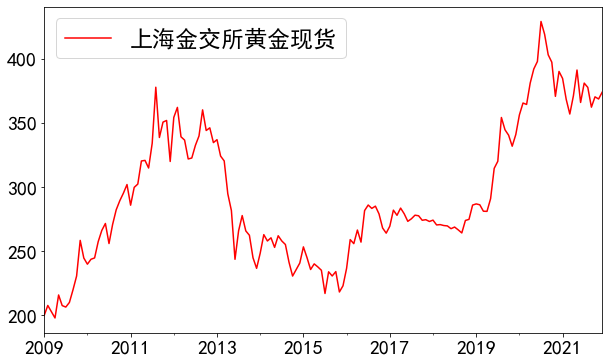

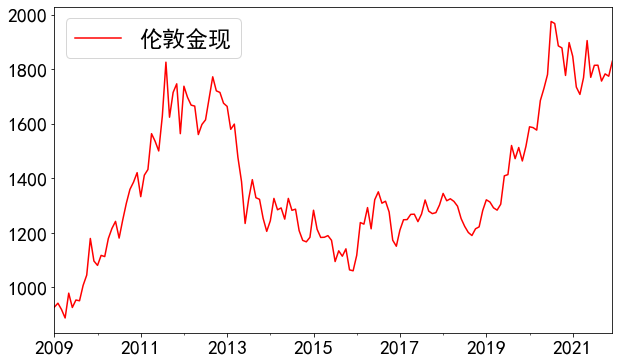

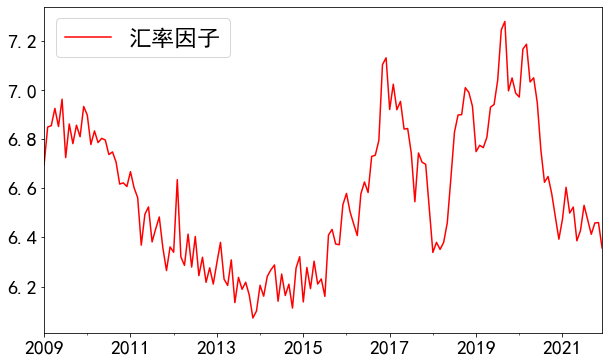

In [68]:
one_factor_plt(factor5_data1,'上海金交所黄金现货')
one_factor_plt(factor5_data2,'伦敦金现')
factor5 = factor5_data1/(factor5_data2/31.1034807)
one_factor_plt(factor5,'汇率因子')

          A         B
A  1.000000  0.961727
B  0.961727  1.000000


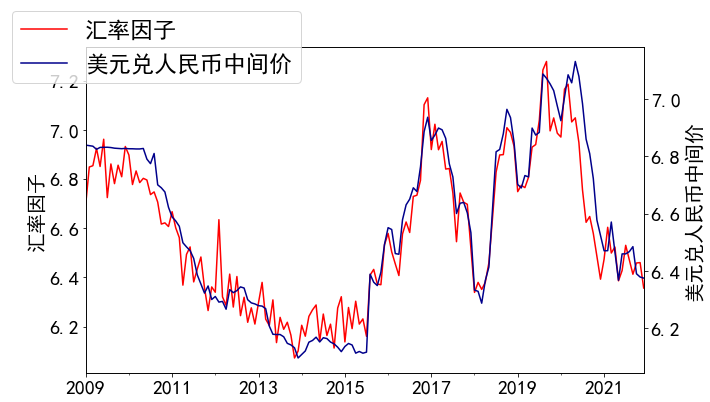

In [69]:
two_factor_plt(factor5,'汇率因子',factor5_diff,'美元兑人民币中间价')
data = pd.DataFrame({'A':factor5, 'B':factor5_diff[12:]})
print(data.corr('spearman'))

In [118]:
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error #均方误差
from sklearn.metrics import mean_absolute_error #平方绝对误差
from sklearn.metrics import r2_score # R square
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series

In [119]:
def single_predict_LSTM(data,d,s):
    values = data.values
    n_train = int((len(data)*0.75)/1)
    train = values[:n_train]
    test = values[n_train:]
    
    look_back = 3
    train_data_gen = TimeseriesGenerator(train, train, length=look_back, sampling_rate=1,stride=1, batch_size=s)
    test_data_gen = TimeseriesGenerator(test, test, length=look_back, sampling_rate=1,stride=1,batch_size=1)
    
    model = Sequential()
    model.add(LSTM(d, input_shape=(look_back, 1)))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    
    history = model.fit(train_data_gen, epochs=d,batch_size=s,validation_data=test_data_gen)
    # plot history
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.legend()
    plt.show()
    
    trainPredict = model.predict(train_data_gen)
    testPredict = model.predict(test_data_gen)
    tt = trainPredict.tolist()
    k = []
    for i in tt:
        k.append(i[0])
    k = np.array(k)
    trainPredictPlot = pd.Series(k, index=data.index[look_back:len(trainPredict)+look_back].to_period())
    tt = testPredict.tolist()
    k = []
    for i in tt:
        k.append(i[0])
    k = np.array(k)
    testPredictPlot = pd.Series(k, index=data.index[n_train+look_back:].to_period())
    
    inv_x = pd.Series(train, index = data.index[:n_train].to_period())
    inv_y = pd.Series(test, index = data.index[n_train:].to_period())
    
    print("mean_squared_error:",mean_squared_error(inv_y[look_back:], testPredictPlot))
    print("mean_absolute_error:",mean_absolute_error(inv_y[look_back:], testPredictPlot))
    print("r2_score:",r2_score(inv_y[look_back:], testPredictPlot))
    
    fig, ax = plot_series(inv_x, inv_y, trainPredictPlot, testPredictPlot, labels=["train", "test", "train(Predict)", "test(Predict)"])
    fig.set_size_inches(14,8)
    ax.legend(loc=0, fontsize=23)
    plt.tick_params(labelsize=20)
    plt.xlabel("")
    # calculate RMSE
    rmse = np.sqrt(mean_squared_error(inv_y[look_back:], testPredictPlot))
    print('Test RMSE: %.3f' % rmse)
    
    predict_data = pd.concat([inv_x,inv_y[:look_back]])
    predict_data = pd.concat([predict_data,testPredictPlot])
    
    return predict_data

Epoch 1/1000
1/1 [==============================] - 2s 2s/step - loss: 0.0040 - val_loss: 0.0254
Epoch 2/1000
1/1 [==============================] - 0s 174ms/step - loss: 0.0038 - val_loss: 0.0229
Epoch 3/1000
1/1 [==============================] - 0s 164ms/step - loss: 0.0032 - val_loss: 0.0208
Epoch 4/1000
1/1 [==============================] - 0s 163ms/step - loss: 0.0028 - val_loss: 0.0183
Epoch 5/1000
1/1 [==============================] - 0s 168ms/step - loss: 0.0025 - val_loss: 0.0152
Epoch 6/1000
1/1 [==============================] - 0s 175ms/step - loss: 0.0021 - val_loss: 0.0122
Epoch 7/1000
1/1 [==============================] - 0s 167ms/step - loss: 0.0018 - val_loss: 0.0098
Epoch 8/1000
1/1 [==============================] - 0s 171ms/step - loss: 0.0016 - val_loss: 0.0081
Epoch 9/1000
1/1 [==============================] - 0s 165ms/step - loss: 0.0015 - val_loss: 0.0069
Epoch 10/1000
1/1 [==============================] - 0s 163ms/step - loss: 0.0012 - val_loss: 0.0060
Ep

1/1 [==============================] - 0s 196ms/step - loss: 3.5170e-04 - val_loss: 0.0018
Epoch 158/1000
1/1 [==============================] - 0s 182ms/step - loss: 3.5072e-04 - val_loss: 0.0018
Epoch 159/1000
1/1 [==============================] - 0s 180ms/step - loss: 3.4973e-04 - val_loss: 0.0018
Epoch 160/1000
1/1 [==============================] - 0s 175ms/step - loss: 3.4875e-04 - val_loss: 0.0018
Epoch 161/1000
1/1 [==============================] - 0s 180ms/step - loss: 3.4776e-04 - val_loss: 0.0018
Epoch 162/1000
1/1 [==============================] - 0s 212ms/step - loss: 3.4678e-04 - val_loss: 0.0018
Epoch 163/1000
1/1 [==============================] - 0s 202ms/step - loss: 3.4580e-04 - val_loss: 0.0018
Epoch 164/1000
1/1 [==============================] - 0s 198ms/step - loss: 3.4481e-04 - val_loss: 0.0018
Epoch 165/1000
1/1 [==============================] - 0s 191ms/step - loss: 3.4383e-04 - val_loss: 0.0018
Epoch 166/1000
1/1 [==============================] - 0s 183m

1/1 [==============================] - 0s 184ms/step - loss: 2.6052e-04 - val_loss: 0.0012
Epoch 312/1000
1/1 [==============================] - 0s 167ms/step - loss: 2.6051e-04 - val_loss: 0.0012
Epoch 313/1000
1/1 [==============================] - 0s 164ms/step - loss: 2.6050e-04 - val_loss: 0.0012
Epoch 314/1000
1/1 [==============================] - 0s 166ms/step - loss: 2.6049e-04 - val_loss: 0.0012
Epoch 315/1000
1/1 [==============================] - 0s 188ms/step - loss: 2.6048e-04 - val_loss: 0.0012
Epoch 316/1000
1/1 [==============================] - 0s 170ms/step - loss: 2.6047e-04 - val_loss: 0.0012
Epoch 317/1000
1/1 [==============================] - 0s 178ms/step - loss: 2.6046e-04 - val_loss: 0.0012
Epoch 318/1000
1/1 [==============================] - 0s 178ms/step - loss: 2.6045e-04 - val_loss: 0.0012
Epoch 319/1000
1/1 [==============================] - 0s 179ms/step - loss: 2.6044e-04 - val_loss: 0.0012
Epoch 320/1000
1/1 [==============================] - 0s 189m

1/1 [==============================] - 0s 168ms/step - loss: 2.6036e-04 - val_loss: 0.0012
Epoch 466/1000
1/1 [==============================] - 0s 179ms/step - loss: 2.6036e-04 - val_loss: 0.0012
Epoch 467/1000
1/1 [==============================] - 0s 169ms/step - loss: 2.6036e-04 - val_loss: 0.0012
Epoch 468/1000
1/1 [==============================] - 0s 178ms/step - loss: 2.6036e-04 - val_loss: 0.0012
Epoch 469/1000
1/1 [==============================] - 0s 171ms/step - loss: 2.6036e-04 - val_loss: 0.0012
Epoch 470/1000
1/1 [==============================] - 0s 163ms/step - loss: 2.6036e-04 - val_loss: 0.0012
Epoch 471/1000
1/1 [==============================] - 0s 168ms/step - loss: 2.6036e-04 - val_loss: 0.0012
Epoch 472/1000
1/1 [==============================] - 0s 174ms/step - loss: 2.6036e-04 - val_loss: 0.0012
Epoch 473/1000
1/1 [==============================] - 0s 162ms/step - loss: 2.6036e-04 - val_loss: 0.0012
Epoch 474/1000
1/1 [==============================] - 0s 204m

1/1 [==============================] - 0s 169ms/step - loss: 2.6035e-04 - val_loss: 0.0012
Epoch 620/1000
1/1 [==============================] - 0s 164ms/step - loss: 2.6035e-04 - val_loss: 0.0012
Epoch 621/1000
1/1 [==============================] - 0s 170ms/step - loss: 2.6035e-04 - val_loss: 0.0012
Epoch 622/1000
1/1 [==============================] - 0s 168ms/step - loss: 2.6035e-04 - val_loss: 0.0012
Epoch 623/1000
1/1 [==============================] - 0s 186ms/step - loss: 2.6035e-04 - val_loss: 0.0012
Epoch 624/1000
1/1 [==============================] - 0s 179ms/step - loss: 2.6035e-04 - val_loss: 0.0012
Epoch 625/1000
1/1 [==============================] - 0s 170ms/step - loss: 2.6035e-04 - val_loss: 0.0012
Epoch 626/1000
1/1 [==============================] - 0s 190ms/step - loss: 2.6035e-04 - val_loss: 0.0012
Epoch 627/1000
1/1 [==============================] - 0s 172ms/step - loss: 2.6035e-04 - val_loss: 0.0012
Epoch 628/1000
1/1 [==============================] - 0s 167m

1/1 [==============================] - 0s 174ms/step - loss: 2.6034e-04 - val_loss: 0.0012
Epoch 774/1000
1/1 [==============================] - 0s 164ms/step - loss: 2.6034e-04 - val_loss: 0.0012
Epoch 775/1000
1/1 [==============================] - 0s 166ms/step - loss: 2.6034e-04 - val_loss: 0.0012
Epoch 776/1000
1/1 [==============================] - 0s 174ms/step - loss: 2.6034e-04 - val_loss: 0.0012
Epoch 777/1000
1/1 [==============================] - 0s 165ms/step - loss: 2.6034e-04 - val_loss: 0.0012
Epoch 778/1000
1/1 [==============================] - 0s 186ms/step - loss: 2.6034e-04 - val_loss: 0.0012
Epoch 779/1000
1/1 [==============================] - 0s 171ms/step - loss: 2.6034e-04 - val_loss: 0.0012
Epoch 780/1000
1/1 [==============================] - 0s 163ms/step - loss: 2.6033e-04 - val_loss: 0.0012
Epoch 781/1000
1/1 [==============================] - 0s 164ms/step - loss: 2.6033e-04 - val_loss: 0.0012
Epoch 782/1000
1/1 [==============================] - 0s 169m

1/1 [==============================] - 0s 168ms/step - loss: 2.6032e-04 - val_loss: 0.0012
Epoch 928/1000
1/1 [==============================] - 0s 168ms/step - loss: 2.6032e-04 - val_loss: 0.0012
Epoch 929/1000
1/1 [==============================] - 0s 166ms/step - loss: 2.6032e-04 - val_loss: 0.0012
Epoch 930/1000
1/1 [==============================] - 0s 165ms/step - loss: 2.6032e-04 - val_loss: 0.0012
Epoch 931/1000
1/1 [==============================] - 0s 165ms/step - loss: 2.6032e-04 - val_loss: 0.0012
Epoch 932/1000
1/1 [==============================] - 0s 166ms/step - loss: 2.6032e-04 - val_loss: 0.0012
Epoch 933/1000
1/1 [==============================] - 0s 180ms/step - loss: 2.6032e-04 - val_loss: 0.0012
Epoch 934/1000
1/1 [==============================] - 0s 174ms/step - loss: 2.6032e-04 - val_loss: 0.0012
Epoch 935/1000
1/1 [==============================] - 0s 166ms/step - loss: 2.6032e-04 - val_loss: 0.0012
Epoch 936/1000
1/1 [==============================] - 0s 173m

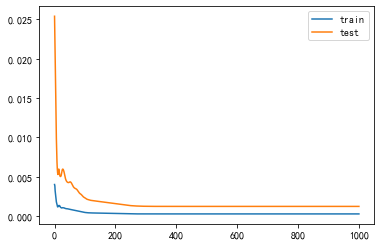

mean_squared_error: 0.0012155268316443512
mean_absolute_error: 0.02813810261090089
r2_score: 0.9554281316648456
Test RMSE: 0.035


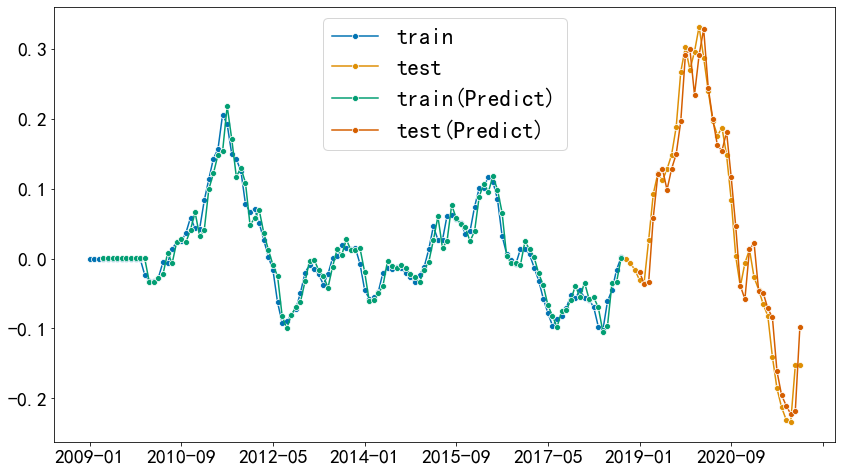

In [120]:
factor2_predict = single_predict_LSTM(factor2,1000,600)

Epoch 1/2000
1/1 [==============================] - 3s 3s/step - loss: 2.7095 - val_loss: 1.7009
Epoch 2/2000
1/1 [==============================] - 1s 508ms/step - loss: 1.3120 - val_loss: 0.4698
Epoch 3/2000
1/1 [==============================] - 1s 517ms/step - loss: 0.3705 - val_loss: 0.0077
Epoch 4/2000
1/1 [==============================] - 1s 506ms/step - loss: 0.0074 - val_loss: 0.5669
Epoch 5/2000
1/1 [==============================] - 1s 520ms/step - loss: 0.4115 - val_loss: 0.6281
Epoch 6/2000
1/1 [==============================] - 1s 523ms/step - loss: 0.4579 - val_loss: 0.2308
Epoch 7/2000
1/1 [==============================] - 1s 567ms/step - loss: 0.1663 - val_loss: 0.0112
Epoch 8/2000
1/1 [==============================] - 1s 535ms/step - loss: 0.0094 - val_loss: 0.0669
Epoch 9/2000
1/1 [==============================] - 1s 516ms/step - loss: 0.0594 - val_loss: 0.2201
Epoch 10/2000
1/1 [==============================] - 1s 522ms/step - loss: 0.1810 - val_loss: 0.3156
Ep

1/1 [==============================] - 1s 524ms/step - loss: 0.0052 - val_loss: 0.0045
Epoch 163/2000
1/1 [==============================] - 1s 547ms/step - loss: 0.0052 - val_loss: 0.0045
Epoch 164/2000
1/1 [==============================] - 1s 536ms/step - loss: 0.0052 - val_loss: 0.0045
Epoch 165/2000
1/1 [==============================] - 1s 519ms/step - loss: 0.0052 - val_loss: 0.0045
Epoch 166/2000
1/1 [==============================] - 1s 522ms/step - loss: 0.0052 - val_loss: 0.0045
Epoch 167/2000
1/1 [==============================] - 1s 514ms/step - loss: 0.0052 - val_loss: 0.0045
Epoch 168/2000
1/1 [==============================] - 1s 512ms/step - loss: 0.0052 - val_loss: 0.0045
Epoch 169/2000
1/1 [==============================] - 1s 517ms/step - loss: 0.0052 - val_loss: 0.0045
Epoch 170/2000
1/1 [==============================] - 1s 537ms/step - loss: 0.0052 - val_loss: 0.0045
Epoch 171/2000
1/1 [==============================] - 1s 548ms/step - loss: 0.0052 - val_loss: 0.

1/1 [==============================] - 1s 522ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 323/2000
1/1 [==============================] - 1s 527ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 324/2000
1/1 [==============================] - 1s 531ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 325/2000
1/1 [==============================] - 1s 523ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 326/2000
1/1 [==============================] - 1s 519ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 327/2000
1/1 [==============================] - 1s 507ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 328/2000
1/1 [==============================] - 1s 517ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 329/2000
1/1 [==============================] - 1s 515ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 330/2000
1/1 [==============================] - 1s 518ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 331/2000
1/1 [==============================] - 1s 521ms/step - loss: 0.0050 - val_loss: 0.

1/1 [==============================] - 1s 516ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 483/2000
1/1 [==============================] - 0s 497ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 484/2000
1/1 [==============================] - 1s 508ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 485/2000
1/1 [==============================] - 1s 509ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 486/2000
1/1 [==============================] - 1s 504ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 487/2000
1/1 [==============================] - 1s 500ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 488/2000
1/1 [==============================] - 1s 515ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 489/2000
1/1 [==============================] - 0s 497ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 490/2000
1/1 [==============================] - 1s 509ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 491/2000
1/1 [==============================] - 1s 508ms/step - loss: 0.0048 - val_loss: 0.

1/1 [==============================] - 1s 505ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 643/2000
1/1 [==============================] - 1s 507ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 644/2000
1/1 [==============================] - 1s 511ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 645/2000
1/1 [==============================] - 1s 511ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 646/2000
1/1 [==============================] - 1s 501ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 647/2000
1/1 [==============================] - 1s 512ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 648/2000
1/1 [==============================] - 0s 496ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 649/2000
1/1 [==============================] - 1s 508ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 650/2000
1/1 [==============================] - 1s 508ms/step - loss: 0.0046 - val_loss: 0.0041
Epoch 651/2000
1/1 [==============================] - 1s 507ms/step - loss: 0.0046 - val_loss: 0.

1/1 [==============================] - 1s 501ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 803/2000
1/1 [==============================] - 1s 515ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 804/2000
1/1 [==============================] - 1s 501ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 805/2000
1/1 [==============================] - 1s 505ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 806/2000
1/1 [==============================] - 1s 514ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 807/2000
1/1 [==============================] - 1s 504ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 808/2000
1/1 [==============================] - 1s 524ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 809/2000
1/1 [==============================] - 1s 526ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 810/2000
1/1 [==============================] - 1s 514ms/step - loss: 0.0043 - val_loss: 0.0038
Epoch 811/2000
1/1 [==============================] - 0s 497ms/step - loss: 0.0043 - val_loss: 0.

1/1 [==============================] - 1s 513ms/step - loss: 0.0040 - val_loss: 0.0036
Epoch 963/2000
1/1 [==============================] - 1s 506ms/step - loss: 0.0040 - val_loss: 0.0036
Epoch 964/2000
1/1 [==============================] - 1s 520ms/step - loss: 0.0040 - val_loss: 0.0036
Epoch 965/2000
1/1 [==============================] - 1s 516ms/step - loss: 0.0040 - val_loss: 0.0036
Epoch 966/2000
1/1 [==============================] - 1s 501ms/step - loss: 0.0040 - val_loss: 0.0036
Epoch 967/2000
1/1 [==============================] - 1s 508ms/step - loss: 0.0040 - val_loss: 0.0036
Epoch 968/2000
1/1 [==============================] - 1s 516ms/step - loss: 0.0040 - val_loss: 0.0036
Epoch 969/2000
1/1 [==============================] - 1s 507ms/step - loss: 0.0040 - val_loss: 0.0036
Epoch 970/2000
1/1 [==============================] - 1s 502ms/step - loss: 0.0040 - val_loss: 0.0036
Epoch 971/2000
1/1 [==============================] - 1s 517ms/step - loss: 0.0040 - val_loss: 0.

1/1 [==============================] - 1s 525ms/step - loss: 0.0038 - val_loss: 0.0035
Epoch 1043/2000
1/1 [==============================] - 1s 508ms/step - loss: 0.0038 - val_loss: 0.0035
Epoch 1044/2000
1/1 [==============================] - 1s 505ms/step - loss: 0.0038 - val_loss: 0.0035
Epoch 1045/2000
1/1 [==============================] - 0s 493ms/step - loss: 0.0038 - val_loss: 0.0035
Epoch 1046/2000
1/1 [==============================] - 1s 517ms/step - loss: 0.0038 - val_loss: 0.0035
Epoch 1047/2000
1/1 [==============================] - 0s 492ms/step - loss: 0.0038 - val_loss: 0.0035
Epoch 1048/2000
1/1 [==============================] - 1s 501ms/step - loss: 0.0038 - val_loss: 0.0035
Epoch 1049/2000
1/1 [==============================] - 1s 503ms/step - loss: 0.0038 - val_loss: 0.0035
Epoch 1050/2000
1/1 [==============================] - 1s 502ms/step - loss: 0.0038 - val_loss: 0.0035
Epoch 1051/2000
1/1 [==============================] - 0s 497ms/step - loss: 0.0038 - val

1/1 [==============================] - 1s 502ms/step - loss: 0.0041 - val_loss: 0.0039
Epoch 1201/2000
1/1 [==============================] - 1s 515ms/step - loss: 0.0041 - val_loss: 0.0039
Epoch 1202/2000
1/1 [==============================] - 1s 501ms/step - loss: 0.0041 - val_loss: 0.0038
Epoch 1203/2000
1/1 [==============================] - 1s 507ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1204/2000
1/1 [==============================] - 1s 507ms/step - loss: 0.0041 - val_loss: 0.0038
Epoch 1205/2000
1/1 [==============================] - 1s 505ms/step - loss: 0.0041 - val_loss: 0.0039
Epoch 1206/2000
1/1 [==============================] - 1s 500ms/step - loss: 0.0041 - val_loss: 0.0038
Epoch 1207/2000
1/1 [==============================] - 1s 515ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1208/2000
1/1 [==============================] - 0s 498ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 1209/2000
1/1 [==============================] - 1s 505ms/step - loss: 0.0041 - val

1/1 [==============================] - 1s 502ms/step - loss: 0.0038 - val_loss: 0.0035
Epoch 1359/2000
1/1 [==============================] - 1s 512ms/step - loss: 0.0038 - val_loss: 0.0035
Epoch 1360/2000
1/1 [==============================] - 1s 513ms/step - loss: 0.0038 - val_loss: 0.0035
Epoch 1361/2000
1/1 [==============================] - 1s 524ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1362/2000
1/1 [==============================] - 1s 512ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1363/2000
1/1 [==============================] - 1s 519ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1364/2000
1/1 [==============================] - 1s 500ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1365/2000
1/1 [==============================] - 1s 508ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1366/2000
1/1 [==============================] - 1s 506ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1367/2000
1/1 [==============================] - 1s 505ms/step - loss: 0.0037 - val

1/1 [==============================] - 1s 506ms/step - loss: 0.0035 - val_loss: 0.0032
Epoch 1517/2000
1/1 [==============================] - 1s 512ms/step - loss: 0.0035 - val_loss: 0.0032
Epoch 1518/2000
1/1 [==============================] - 1s 510ms/step - loss: 0.0035 - val_loss: 0.0032
Epoch 1519/2000
1/1 [==============================] - 1s 516ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1520/2000
1/1 [==============================] - 1s 504ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1521/2000
1/1 [==============================] - 1s 517ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1522/2000
1/1 [==============================] - 1s 501ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1523/2000
1/1 [==============================] - 1s 505ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1524/2000
1/1 [==============================] - 1s 512ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1525/2000
1/1 [==============================] - 1s 513ms/step - loss: 0.0034 - val

1/1 [==============================] - 1s 523ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1675/2000
1/1 [==============================] - 1s 505ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1676/2000
1/1 [==============================] - 1s 508ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1677/2000
1/1 [==============================] - 1s 513ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1678/2000
1/1 [==============================] - 1s 512ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1679/2000
1/1 [==============================] - 1s 503ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1680/2000
1/1 [==============================] - 1s 516ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1681/2000
1/1 [==============================] - 0s 498ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1682/2000
1/1 [==============================] - 1s 510ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 1683/2000
1/1 [==============================] - 1s 515ms/step - loss: 0.0037 - val

1/1 [==============================] - 1s 512ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1833/2000
1/1 [==============================] - 0s 499ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1834/2000
1/1 [==============================] - 1s 522ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1835/2000
1/1 [==============================] - 1s 500ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1836/2000
1/1 [==============================] - 1s 515ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1837/2000
1/1 [==============================] - 1s 508ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1838/2000
1/1 [==============================] - 1s 514ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1839/2000
1/1 [==============================] - 1s 510ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1840/2000
1/1 [==============================] - 1s 522ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 1841/2000
1/1 [==============================] - 1s 500ms/step - loss: 0.0034 - val

1/1 [==============================] - 1s 521ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1991/2000
1/1 [==============================] - 1s 512ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1992/2000
1/1 [==============================] - 1s 521ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1993/2000
1/1 [==============================] - 1s 526ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1994/2000
1/1 [==============================] - 1s 531ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1995/2000
1/1 [==============================] - 1s 524ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1996/2000
1/1 [==============================] - 1s 537ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1997/2000
1/1 [==============================] - 1s 542ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1998/2000
1/1 [==============================] - 1s 565ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 1999/2000
1/1 [==============================] - 1s 582ms/step - loss: 0.0031 - val

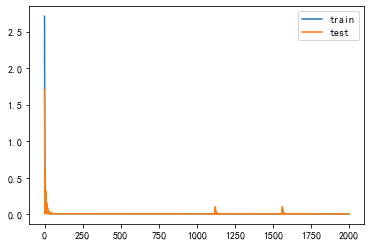

mean_squared_error: 0.002957214411271435
mean_absolute_error: 0.046326124799121064
r2_score: 0.43274601387307776
Test RMSE: 0.054


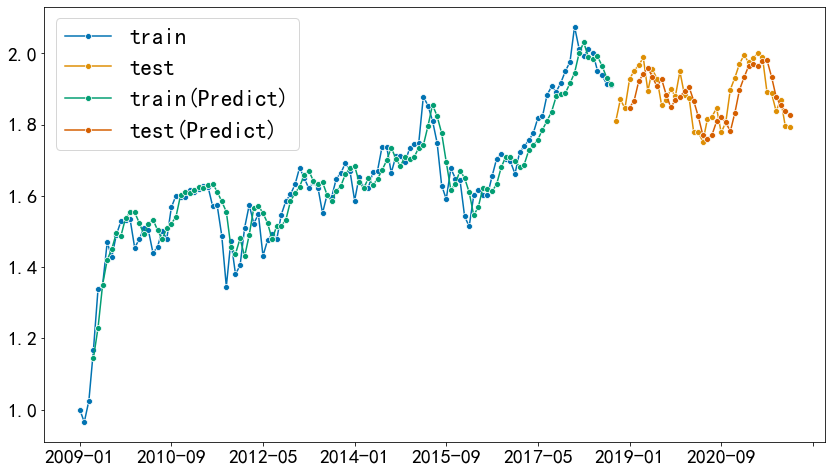

In [125]:
factor1_predict = single_predict_LSTM(factor1,2000,600)

Epoch 1/1000
1/1 [==============================] - 2s 2s/step - loss: 1.6104 - val_loss: 1.9316
Epoch 2/1000
1/1 [==============================] - 0s 178ms/step - loss: 1.0928 - val_loss: 1.1858
Epoch 3/1000
1/1 [==============================] - 0s 181ms/step - loss: 0.6617 - val_loss: 0.5828
Epoch 4/1000
1/1 [==============================] - 0s 176ms/step - loss: 0.3172 - val_loss: 0.1630
Epoch 5/1000
1/1 [==============================] - 0s 173ms/step - loss: 0.0836 - val_loss: 0.0114
Epoch 6/1000
1/1 [==============================] - 0s 168ms/step - loss: 0.0106 - val_loss: 0.1700
Epoch 7/1000
1/1 [==============================] - 0s 171ms/step - loss: 0.1195 - val_loss: 0.3638
Epoch 8/1000
1/1 [==============================] - 0s 170ms/step - loss: 0.2421 - val_loss: 0.3465
Epoch 9/1000
1/1 [==============================] - 0s 170ms/step - loss: 0.2320 - val_loss: 0.2033
Epoch 10/1000
1/1 [==============================] - 0s 169ms/step - loss: 0.1418 - val_loss: 0.0708
Ep

1/1 [==============================] - 0s 169ms/step - loss: 0.0084 - val_loss: 0.0111
Epoch 163/1000
1/1 [==============================] - 0s 167ms/step - loss: 0.0084 - val_loss: 0.0111
Epoch 164/1000
1/1 [==============================] - 0s 173ms/step - loss: 0.0084 - val_loss: 0.0111
Epoch 165/1000
1/1 [==============================] - 0s 190ms/step - loss: 0.0084 - val_loss: 0.0111
Epoch 166/1000
1/1 [==============================] - 0s 169ms/step - loss: 0.0084 - val_loss: 0.0111
Epoch 167/1000
1/1 [==============================] - 0s 171ms/step - loss: 0.0084 - val_loss: 0.0111
Epoch 168/1000
1/1 [==============================] - 0s 173ms/step - loss: 0.0084 - val_loss: 0.0111
Epoch 169/1000
1/1 [==============================] - 0s 170ms/step - loss: 0.0084 - val_loss: 0.0111
Epoch 170/1000
1/1 [==============================] - 0s 172ms/step - loss: 0.0084 - val_loss: 0.0110
Epoch 171/1000
1/1 [==============================] - 0s 171ms/step - loss: 0.0084 - val_loss: 0.

1/1 [==============================] - 0s 167ms/step - loss: 0.0080 - val_loss: 0.0103
Epoch 323/1000
1/1 [==============================] - 0s 168ms/step - loss: 0.0080 - val_loss: 0.0103
Epoch 324/1000
1/1 [==============================] - 0s 167ms/step - loss: 0.0080 - val_loss: 0.0103
Epoch 325/1000
1/1 [==============================] - 0s 167ms/step - loss: 0.0080 - val_loss: 0.0103
Epoch 326/1000
1/1 [==============================] - 0s 186ms/step - loss: 0.0080 - val_loss: 0.0103
Epoch 327/1000
1/1 [==============================] - 0s 174ms/step - loss: 0.0080 - val_loss: 0.0103
Epoch 328/1000
1/1 [==============================] - 0s 170ms/step - loss: 0.0080 - val_loss: 0.0103
Epoch 329/1000
1/1 [==============================] - 0s 167ms/step - loss: 0.0080 - val_loss: 0.0103
Epoch 330/1000
1/1 [==============================] - 0s 171ms/step - loss: 0.0080 - val_loss: 0.0103
Epoch 331/1000
1/1 [==============================] - 0s 171ms/step - loss: 0.0080 - val_loss: 0.

1/1 [==============================] - 0s 167ms/step - loss: 0.0076 - val_loss: 0.0097
Epoch 483/1000
1/1 [==============================] - 0s 170ms/step - loss: 0.0076 - val_loss: 0.0097
Epoch 484/1000
1/1 [==============================] - 0s 176ms/step - loss: 0.0076 - val_loss: 0.0097
Epoch 485/1000
1/1 [==============================] - 0s 162ms/step - loss: 0.0076 - val_loss: 0.0097
Epoch 486/1000
1/1 [==============================] - 0s 164ms/step - loss: 0.0076 - val_loss: 0.0097
Epoch 487/1000
1/1 [==============================] - 0s 168ms/step - loss: 0.0076 - val_loss: 0.0097
Epoch 488/1000
1/1 [==============================] - 0s 181ms/step - loss: 0.0076 - val_loss: 0.0097
Epoch 489/1000
1/1 [==============================] - 0s 173ms/step - loss: 0.0076 - val_loss: 0.0097
Epoch 490/1000
1/1 [==============================] - 0s 167ms/step - loss: 0.0076 - val_loss: 0.0097
Epoch 491/1000
1/1 [==============================] - 0s 173ms/step - loss: 0.0076 - val_loss: 0.

1/1 [==============================] - 0s 178ms/step - loss: 0.0071 - val_loss: 0.0090
Epoch 643/1000
1/1 [==============================] - 0s 166ms/step - loss: 0.0071 - val_loss: 0.0090
Epoch 644/1000
1/1 [==============================] - 0s 168ms/step - loss: 0.0071 - val_loss: 0.0090
Epoch 645/1000
1/1 [==============================] - 0s 169ms/step - loss: 0.0071 - val_loss: 0.0090
Epoch 646/1000
1/1 [==============================] - 0s 167ms/step - loss: 0.0071 - val_loss: 0.0090
Epoch 647/1000
1/1 [==============================] - 0s 167ms/step - loss: 0.0071 - val_loss: 0.0090
Epoch 648/1000
1/1 [==============================] - 0s 167ms/step - loss: 0.0071 - val_loss: 0.0090
Epoch 649/1000
1/1 [==============================] - 0s 163ms/step - loss: 0.0071 - val_loss: 0.0090
Epoch 650/1000
1/1 [==============================] - 0s 186ms/step - loss: 0.0071 - val_loss: 0.0090
Epoch 651/1000
1/1 [==============================] - 0s 166ms/step - loss: 0.0071 - val_loss: 0.

1/1 [==============================] - 0s 170ms/step - loss: 0.0066 - val_loss: 0.0085
Epoch 803/1000
1/1 [==============================] - 0s 188ms/step - loss: 0.0066 - val_loss: 0.0085
Epoch 804/1000
1/1 [==============================] - 0s 172ms/step - loss: 0.0066 - val_loss: 0.0085
Epoch 805/1000
1/1 [==============================] - 0s 170ms/step - loss: 0.0066 - val_loss: 0.0085
Epoch 806/1000
1/1 [==============================] - 0s 164ms/step - loss: 0.0066 - val_loss: 0.0085
Epoch 807/1000
1/1 [==============================] - 0s 169ms/step - loss: 0.0066 - val_loss: 0.0085
Epoch 808/1000
1/1 [==============================] - 0s 168ms/step - loss: 0.0066 - val_loss: 0.0085
Epoch 809/1000
1/1 [==============================] - 0s 170ms/step - loss: 0.0066 - val_loss: 0.0085
Epoch 810/1000
1/1 [==============================] - 0s 168ms/step - loss: 0.0066 - val_loss: 0.0084
Epoch 811/1000
1/1 [==============================] - 0s 174ms/step - loss: 0.0066 - val_loss: 0.

1/1 [==============================] - 0s 173ms/step - loss: 0.0061 - val_loss: 0.0081
Epoch 963/1000
1/1 [==============================] - 0s 169ms/step - loss: 0.0061 - val_loss: 0.0081
Epoch 964/1000
1/1 [==============================] - 0s 182ms/step - loss: 0.0061 - val_loss: 0.0081
Epoch 965/1000
1/1 [==============================] - 0s 171ms/step - loss: 0.0061 - val_loss: 0.0081
Epoch 966/1000
1/1 [==============================] - 0s 168ms/step - loss: 0.0061 - val_loss: 0.0081
Epoch 967/1000
1/1 [==============================] - 0s 172ms/step - loss: 0.0061 - val_loss: 0.0081
Epoch 968/1000
1/1 [==============================] - 0s 191ms/step - loss: 0.0061 - val_loss: 0.0081
Epoch 969/1000
1/1 [==============================] - 0s 173ms/step - loss: 0.0061 - val_loss: 0.0081
Epoch 970/1000
1/1 [==============================] - 0s 172ms/step - loss: 0.0061 - val_loss: 0.0081
Epoch 971/1000
1/1 [==============================] - 0s 172ms/step - loss: 0.0061 - val_loss: 0.

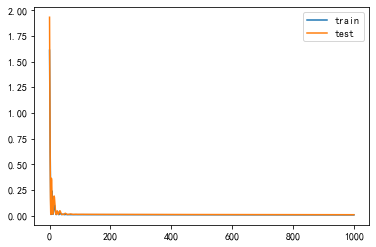

mean_squared_error: 0.008016678688951917
mean_absolute_error: 0.07407748588957773
r2_score: 0.8146670434135967
Test RMSE: 0.090


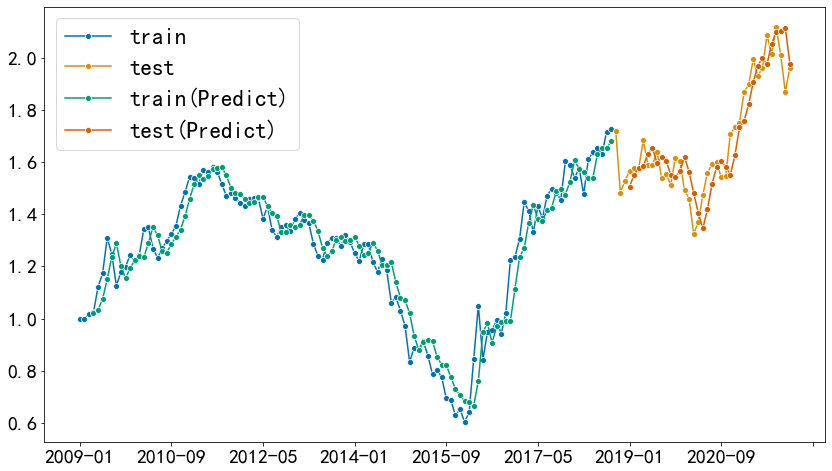

In [122]:
factor3_predict = single_predict_LSTM(factor3,1000,600)

Epoch 1/1000
1/1 [==============================] - 2s 2s/step - loss: 9.2152e-05 - val_loss: 2.3737e-04
Epoch 2/1000
1/1 [==============================] - 0s 175ms/step - loss: 3.4346e-04 - val_loss: 3.2230e-05
Epoch 3/1000
1/1 [==============================] - 0s 169ms/step - loss: 8.4995e-05 - val_loss: 9.6448e-05
Epoch 4/1000
1/1 [==============================] - 0s 171ms/step - loss: 9.2757e-05 - val_loss: 2.1116e-04
Epoch 5/1000
1/1 [==============================] - 0s 173ms/step - loss: 1.8374e-04 - val_loss: 1.6180e-04
Epoch 6/1000
1/1 [==============================] - 0s 184ms/step - loss: 1.4307e-04 - val_loss: 6.1098e-05
Epoch 7/1000
1/1 [==============================] - 0s 171ms/step - loss: 6.6633e-05 - val_loss: 1.9233e-05
Epoch 8/1000
1/1 [==============================] - 0s 167ms/step - loss: 5.1337e-05 - val_loss: 3.7863e-05
Epoch 9/1000
1/1 [==============================] - 0s 172ms/step - loss: 8.8767e-05 - val_loss: 5.3996e-05
Epoch 10/1000
1/1 [============

Epoch 151/1000
1/1 [==============================] - 0s 168ms/step - loss: 1.0581e-05 - val_loss: 8.4714e-06
Epoch 152/1000
1/1 [==============================] - 0s 175ms/step - loss: 1.0569e-05 - val_loss: 8.4640e-06
Epoch 153/1000
1/1 [==============================] - 0s 166ms/step - loss: 1.0556e-05 - val_loss: 8.4555e-06
Epoch 154/1000
1/1 [==============================] - 0s 168ms/step - loss: 1.0543e-05 - val_loss: 8.4465e-06
Epoch 155/1000
1/1 [==============================] - 0s 172ms/step - loss: 1.0531e-05 - val_loss: 8.4379e-06
Epoch 156/1000
1/1 [==============================] - 0s 169ms/step - loss: 1.0518e-05 - val_loss: 8.4301e-06
Epoch 157/1000
1/1 [==============================] - 0s 176ms/step - loss: 1.0506e-05 - val_loss: 8.4225e-06
Epoch 158/1000
1/1 [==============================] - 0s 177ms/step - loss: 1.0493e-05 - val_loss: 8.4145e-06
Epoch 159/1000
1/1 [==============================] - 0s 173ms/step - loss: 1.0480e-05 - val_loss: 8.4056e-06
Epoch 160/

1/1 [==============================] - 0s 178ms/step - loss: 8.4298e-06 - val_loss: 6.9358e-06
Epoch 300/1000
1/1 [==============================] - 0s 166ms/step - loss: 8.4137e-06 - val_loss: 6.9244e-06
Epoch 301/1000
1/1 [==============================] - 0s 164ms/step - loss: 8.3976e-06 - val_loss: 6.9130e-06
Epoch 302/1000
1/1 [==============================] - 0s 169ms/step - loss: 8.3815e-06 - val_loss: 6.9017e-06
Epoch 303/1000
1/1 [==============================] - 0s 169ms/step - loss: 8.3653e-06 - val_loss: 6.8903e-06
Epoch 304/1000
1/1 [==============================] - 0s 187ms/step - loss: 8.3492e-06 - val_loss: 6.8789e-06
Epoch 305/1000
1/1 [==============================] - 0s 172ms/step - loss: 8.3331e-06 - val_loss: 6.8675e-06
Epoch 306/1000
1/1 [==============================] - 0s 169ms/step - loss: 8.3169e-06 - val_loss: 6.8561e-06
Epoch 307/1000
1/1 [==============================] - 0s 166ms/step - loss: 8.3007e-06 - val_loss: 6.8447e-06
Epoch 308/1000
1/1 [=====

1/1 [==============================] - 0s 171ms/step - loss: 6.1121e-06 - val_loss: 5.3780e-06
Epoch 448/1000
1/1 [==============================] - 0s 168ms/step - loss: 6.0986e-06 - val_loss: 5.3698e-06
Epoch 449/1000
1/1 [==============================] - 0s 163ms/step - loss: 6.0852e-06 - val_loss: 5.3617e-06
Epoch 450/1000
1/1 [==============================] - 0s 188ms/step - loss: 6.0719e-06 - val_loss: 5.3537e-06
Epoch 451/1000
1/1 [==============================] - 0s 165ms/step - loss: 6.0586e-06 - val_loss: 5.3457e-06
Epoch 452/1000
1/1 [==============================] - 0s 171ms/step - loss: 6.0454e-06 - val_loss: 5.3378e-06
Epoch 453/1000
1/1 [==============================] - 0s 164ms/step - loss: 6.0323e-06 - val_loss: 5.3299e-06
Epoch 454/1000
1/1 [==============================] - 0s 164ms/step - loss: 6.0192e-06 - val_loss: 5.3221e-06
Epoch 455/1000
1/1 [==============================] - 0s 174ms/step - loss: 6.0061e-06 - val_loss: 5.3143e-06
Epoch 456/1000
1/1 [=====

1/1 [==============================] - 0s 184ms/step - loss: 4.9108e-06 - val_loss: 4.8246e-06
Epoch 596/1000
1/1 [==============================] - 0s 174ms/step - loss: 4.9079e-06 - val_loss: 4.8246e-06
Epoch 597/1000
1/1 [==============================] - 0s 168ms/step - loss: 4.9050e-06 - val_loss: 4.8246e-06
Epoch 598/1000
1/1 [==============================] - 0s 173ms/step - loss: 4.9021e-06 - val_loss: 4.8246e-06
Epoch 599/1000
1/1 [==============================] - 0s 172ms/step - loss: 4.8993e-06 - val_loss: 4.8246e-06
Epoch 600/1000
1/1 [==============================] - 0s 172ms/step - loss: 4.8965e-06 - val_loss: 4.8247e-06
Epoch 601/1000
1/1 [==============================] - 0s 167ms/step - loss: 4.8938e-06 - val_loss: 4.8248e-06
Epoch 602/1000
1/1 [==============================] - 0s 169ms/step - loss: 4.8911e-06 - val_loss: 4.8249e-06
Epoch 603/1000
1/1 [==============================] - 0s 174ms/step - loss: 4.8885e-06 - val_loss: 4.8250e-06
Epoch 604/1000
1/1 [=====

1/1 [==============================] - 0s 174ms/step - loss: 4.7635e-06 - val_loss: 4.9141e-06
Epoch 744/1000
1/1 [==============================] - 0s 173ms/step - loss: 4.7633e-06 - val_loss: 4.9147e-06
Epoch 745/1000
1/1 [==============================] - 0s 169ms/step - loss: 4.7631e-06 - val_loss: 4.9152e-06
Epoch 746/1000
1/1 [==============================] - 0s 171ms/step - loss: 4.7630e-06 - val_loss: 4.9157e-06
Epoch 747/1000
1/1 [==============================] - 0s 168ms/step - loss: 4.7628e-06 - val_loss: 4.9162e-06
Epoch 748/1000
1/1 [==============================] - 0s 183ms/step - loss: 4.7627e-06 - val_loss: 4.9167e-06
Epoch 749/1000
1/1 [==============================] - 0s 174ms/step - loss: 4.7626e-06 - val_loss: 4.9172e-06
Epoch 750/1000
1/1 [==============================] - 0s 174ms/step - loss: 4.7624e-06 - val_loss: 4.9177e-06
Epoch 751/1000
1/1 [==============================] - 0s 164ms/step - loss: 4.7623e-06 - val_loss: 4.9182e-06
Epoch 752/1000
1/1 [=====

1/1 [==============================] - 0s 173ms/step - loss: 4.7517e-06 - val_loss: 4.9579e-06
Epoch 892/1000
1/1 [==============================] - 0s 165ms/step - loss: 4.7516e-06 - val_loss: 4.9580e-06
Epoch 893/1000
1/1 [==============================] - 0s 177ms/step - loss: 4.7516e-06 - val_loss: 4.9582e-06
Epoch 894/1000
1/1 [==============================] - 0s 173ms/step - loss: 4.7515e-06 - val_loss: 4.9583e-06
Epoch 895/1000
1/1 [==============================] - 0s 171ms/step - loss: 4.7515e-06 - val_loss: 4.9585e-06
Epoch 896/1000
1/1 [==============================] - 0s 173ms/step - loss: 4.7514e-06 - val_loss: 4.9587e-06
Epoch 897/1000
1/1 [==============================] - 0s 169ms/step - loss: 4.7513e-06 - val_loss: 4.9588e-06
Epoch 898/1000
1/1 [==============================] - 0s 173ms/step - loss: 4.7513e-06 - val_loss: 4.9590e-06
Epoch 899/1000
1/1 [==============================] - 0s 168ms/step - loss: 4.7512e-06 - val_loss: 4.9591e-06
Epoch 900/1000
1/1 [=====

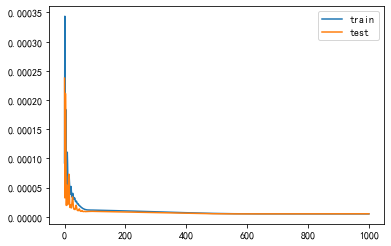

mean_squared_error: 4.97194788016801e-06
mean_absolute_error: 0.0016870065858373738
r2_score: 0.7738106862544465
Test RMSE: 0.002


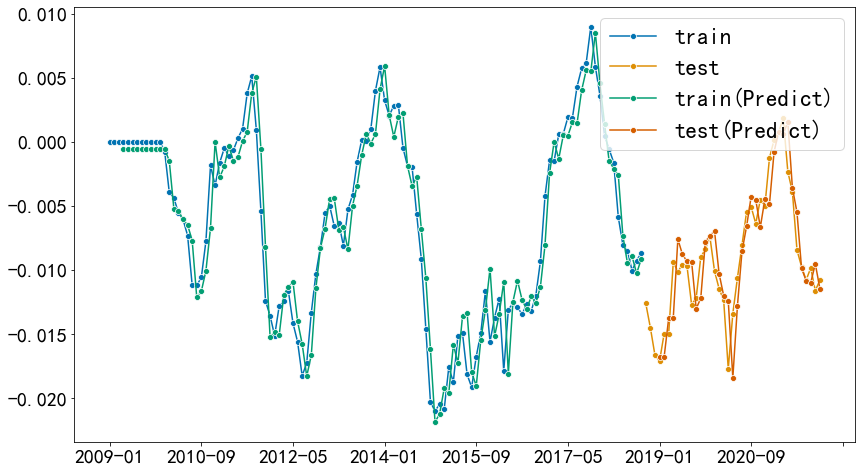

In [123]:
factor4_predict = single_predict_LSTM(factor4,1000,600)

Epoch 1/1000
1/1 [==============================] - 2s 2s/step - loss: 41.3879 - val_loss: 29.8329
Epoch 2/1000
1/1 [==============================] - 0s 177ms/step - loss: 27.8038 - val_loss: 17.5705
Epoch 3/1000
1/1 [==============================] - 0s 174ms/step - loss: 16.4535 - val_loss: 7.7262
Epoch 4/1000
1/1 [==============================] - 0s 175ms/step - loss: 7.3100 - val_loss: 1.3594
Epoch 5/1000
1/1 [==============================] - 0s 184ms/step - loss: 1.3356 - val_loss: 0.4373
Epoch 6/1000
1/1 [==============================] - 0s 167ms/step - loss: 0.3515 - val_loss: 4.5944
Epoch 7/1000
1/1 [==============================] - 0s 193ms/step - loss: 4.1053 - val_loss: 6.7979
Epoch 8/1000
1/1 [==============================] - 0s 173ms/step - loss: 6.1691 - val_loss: 5.3400
Epoch 9/1000
1/1 [==============================] - 0s 177ms/step - loss: 4.8691 - val_loss: 2.6680
Epoch 10/1000
1/1 [==============================] - 0s 177ms/step - loss: 2.4315 - val_loss: 0.70

1/1 [==============================] - 0s 173ms/step - loss: 0.0186 - val_loss: 0.0275
Epoch 163/1000
1/1 [==============================] - 0s 166ms/step - loss: 0.0186 - val_loss: 0.0275
Epoch 164/1000
1/1 [==============================] - 0s 172ms/step - loss: 0.0186 - val_loss: 0.0275
Epoch 165/1000
1/1 [==============================] - 0s 171ms/step - loss: 0.0186 - val_loss: 0.0274
Epoch 166/1000
1/1 [==============================] - 0s 166ms/step - loss: 0.0186 - val_loss: 0.0274
Epoch 167/1000
1/1 [==============================] - 0s 177ms/step - loss: 0.0186 - val_loss: 0.0274
Epoch 168/1000
1/1 [==============================] - 0s 171ms/step - loss: 0.0186 - val_loss: 0.0273
Epoch 169/1000
1/1 [==============================] - 0s 175ms/step - loss: 0.0186 - val_loss: 0.0273
Epoch 170/1000
1/1 [==============================] - 0s 169ms/step - loss: 0.0185 - val_loss: 0.0272
Epoch 171/1000
1/1 [==============================] - 0s 172ms/step - loss: 0.0185 - val_loss: 0.

1/1 [==============================] - 0s 171ms/step - loss: 0.0172 - val_loss: 0.0248
Epoch 323/1000
1/1 [==============================] - 0s 171ms/step - loss: 0.0172 - val_loss: 0.0248
Epoch 324/1000
1/1 [==============================] - 0s 170ms/step - loss: 0.0172 - val_loss: 0.0248
Epoch 325/1000
1/1 [==============================] - 0s 173ms/step - loss: 0.0172 - val_loss: 0.0248
Epoch 326/1000
1/1 [==============================] - 0s 173ms/step - loss: 0.0172 - val_loss: 0.0247
Epoch 327/1000
1/1 [==============================] - 0s 172ms/step - loss: 0.0172 - val_loss: 0.0247
Epoch 328/1000
1/1 [==============================] - 0s 175ms/step - loss: 0.0172 - val_loss: 0.0247
Epoch 329/1000
1/1 [==============================] - 0s 172ms/step - loss: 0.0172 - val_loss: 0.0247
Epoch 330/1000
1/1 [==============================] - 0s 171ms/step - loss: 0.0172 - val_loss: 0.0247
Epoch 331/1000
1/1 [==============================] - 0s 166ms/step - loss: 0.0172 - val_loss: 0.

1/1 [==============================] - 0s 174ms/step - loss: 0.0163 - val_loss: 0.0232
Epoch 483/1000
1/1 [==============================] - 0s 168ms/step - loss: 0.0163 - val_loss: 0.0232
Epoch 484/1000
1/1 [==============================] - 0s 169ms/step - loss: 0.0163 - val_loss: 0.0232
Epoch 485/1000
1/1 [==============================] - 0s 170ms/step - loss: 0.0163 - val_loss: 0.0232
Epoch 486/1000
1/1 [==============================] - 0s 173ms/step - loss: 0.0163 - val_loss: 0.0232
Epoch 487/1000
1/1 [==============================] - 0s 170ms/step - loss: 0.0163 - val_loss: 0.0232
Epoch 488/1000
1/1 [==============================] - 0s 162ms/step - loss: 0.0163 - val_loss: 0.0232
Epoch 489/1000
1/1 [==============================] - 0s 169ms/step - loss: 0.0163 - val_loss: 0.0232
Epoch 490/1000
1/1 [==============================] - 0s 190ms/step - loss: 0.0163 - val_loss: 0.0232
Epoch 491/1000
1/1 [==============================] - 0s 169ms/step - loss: 0.0163 - val_loss: 0.

1/1 [==============================] - 0s 168ms/step - loss: 0.0159 - val_loss: 0.0226
Epoch 643/1000
1/1 [==============================] - 0s 191ms/step - loss: 0.0159 - val_loss: 0.0226
Epoch 644/1000
1/1 [==============================] - 0s 175ms/step - loss: 0.0159 - val_loss: 0.0226
Epoch 645/1000
1/1 [==============================] - 0s 167ms/step - loss: 0.0159 - val_loss: 0.0226
Epoch 646/1000
1/1 [==============================] - 0s 170ms/step - loss: 0.0159 - val_loss: 0.0226
Epoch 647/1000
1/1 [==============================] - 0s 168ms/step - loss: 0.0159 - val_loss: 0.0226
Epoch 648/1000
1/1 [==============================] - 0s 174ms/step - loss: 0.0159 - val_loss: 0.0226
Epoch 649/1000
1/1 [==============================] - 0s 170ms/step - loss: 0.0159 - val_loss: 0.0226
Epoch 650/1000
1/1 [==============================] - 0s 174ms/step - loss: 0.0159 - val_loss: 0.0226
Epoch 651/1000
1/1 [==============================] - 0s 184ms/step - loss: 0.0159 - val_loss: 0.

1/1 [==============================] - 0s 170ms/step - loss: 0.0157 - val_loss: 0.0223
Epoch 803/1000
1/1 [==============================] - 0s 182ms/step - loss: 0.0157 - val_loss: 0.0223
Epoch 804/1000
1/1 [==============================] - 0s 171ms/step - loss: 0.0157 - val_loss: 0.0223
Epoch 805/1000
1/1 [==============================] - 0s 180ms/step - loss: 0.0157 - val_loss: 0.0223
Epoch 806/1000
1/1 [==============================] - 0s 169ms/step - loss: 0.0157 - val_loss: 0.0223
Epoch 807/1000
1/1 [==============================] - 0s 169ms/step - loss: 0.0157 - val_loss: 0.0223
Epoch 808/1000
1/1 [==============================] - 0s 173ms/step - loss: 0.0157 - val_loss: 0.0223
Epoch 809/1000
1/1 [==============================] - 0s 175ms/step - loss: 0.0157 - val_loss: 0.0223
Epoch 810/1000
1/1 [==============================] - 0s 171ms/step - loss: 0.0157 - val_loss: 0.0223
Epoch 811/1000
1/1 [==============================] - 0s 171ms/step - loss: 0.0157 - val_loss: 0.

1/1 [==============================] - 0s 168ms/step - loss: 0.0155 - val_loss: 0.0222
Epoch 963/1000
1/1 [==============================] - 0s 172ms/step - loss: 0.0155 - val_loss: 0.0222
Epoch 964/1000
1/1 [==============================] - 0s 170ms/step - loss: 0.0155 - val_loss: 0.0222
Epoch 965/1000
1/1 [==============================] - 0s 189ms/step - loss: 0.0155 - val_loss: 0.0222
Epoch 966/1000
1/1 [==============================] - 0s 172ms/step - loss: 0.0155 - val_loss: 0.0222
Epoch 967/1000
1/1 [==============================] - 0s 173ms/step - loss: 0.0155 - val_loss: 0.0222
Epoch 968/1000
1/1 [==============================] - 0s 170ms/step - loss: 0.0155 - val_loss: 0.0222
Epoch 969/1000
1/1 [==============================] - 0s 168ms/step - loss: 0.0155 - val_loss: 0.0222
Epoch 970/1000
1/1 [==============================] - 0s 171ms/step - loss: 0.0155 - val_loss: 0.0222
Epoch 971/1000
1/1 [==============================] - 0s 172ms/step - loss: 0.0155 - val_loss: 0.

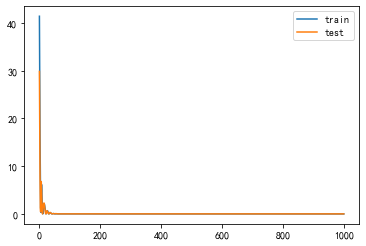

mean_squared_error: 0.02212945717091562
mean_absolute_error: 0.1206181394195457
r2_score: 0.7124181994284473
Test RMSE: 0.149


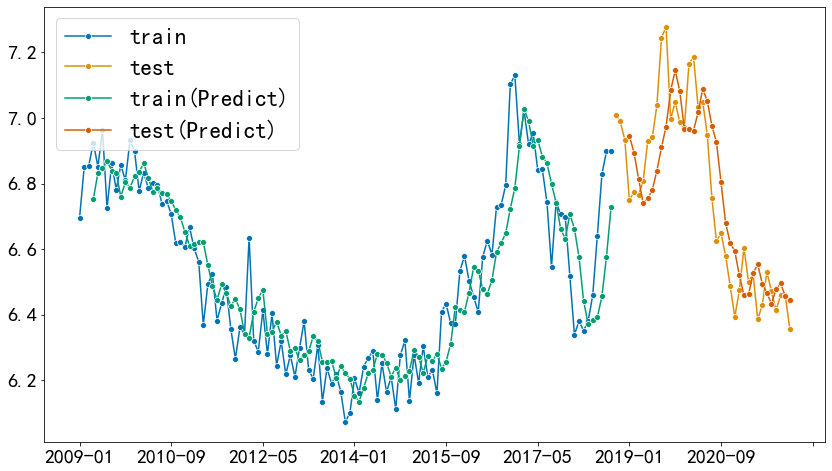

In [124]:
factor5_predict = single_predict_LSTM(factor5,1000,600)

In [115]:
import imageio
import matplotlib.animation as ani
import matplotlib.cm as cmx
import matplotlib.colors as colors

from matplotlib.patches import Ellipse
import seaborn as sns
from PIL import Image
from sklearn.cluster import KMeans

In [132]:
def gaussian(X, mu, cov):
    n = X.shape[1]
    diff = (X - mu).T
    return np.diagonal(1 / ((2 * np.pi) ** (n / 2) * np.linalg.det(cov) ** 0.5) * np.exp(-0.5 * np.dot(np.dot(diff.T, np.linalg.inv(cov)), diff))).reshape(-1, 1)

def initialize_clusters(X, n_clusters):
    clusters = []
    idx = np.arange(X.shape[0])
    
    kmeans = KMeans(n_clusters).fit(X)
    mu_k = kmeans.cluster_centers_
    
    for i in range(n_clusters):
        clusters.append({
            'pi_k': 1.0 / n_clusters,
            'mu_k': mu_k[i],
            'cov_k': np.identity(X.shape[1], dtype=np.float64)
        })
        
    return clusters

def expectation_step(X, clusters):
    global gamma_nk, totals
    N = X.shape[0]
    K = len(clusters)
    totals = np.zeros((N, 1), dtype=np.float64)
    gamma_nk = np.zeros((N, K), dtype=np.float64)
    
    for k, cluster in enumerate(clusters):
        pi_k = cluster['pi_k']
        mu_k = cluster['mu_k']
        cov_k = cluster['cov_k']
    
        gamma_nk[:, k] = (pi_k * gaussian(X, mu_k, cov_k)).ravel()
    
    totals = np.sum(gamma_nk, 1)
    gamma_nk /= np.expand_dims(totals, 1)
    
def maximization_step(X, clusters):
    global gamma_nk
    N = float(X.shape[0])
  
    for k, cluster in enumerate(clusters):
        gamma_k = np.expand_dims(gamma_nk[:, k], 1)
        N_k = np.sum(gamma_k, axis=0)
        
        pi_k = N_k / N
        mu_k = np.sum(gamma_k * X, axis=0) / N_k
        cov_k = (gamma_k * (X - mu_k)).T @ (X - mu_k) / N_k
        
        cluster['pi_k'] = pi_k
        cluster['mu_k'] = mu_k
        cluster['cov_k'] = cov_k

def get_likelihood(X, clusters):
    global gamma_nk, totals
    sample_likelihoods = np.log(totals)
    return np.sum(sample_likelihoods), sample_likelihoods

def train_gmm(X, n_clusters, n_epochs):
    clusters = initialize_clusters(X, n_clusters)
    likelihoods = np.zeros((n_epochs, ))
    scores = np.zeros((X.shape[0], n_clusters))
    history = []

    for i in range(n_epochs):
        clusters_snapshot = []
        
        # This is just for our later use in the graphs
        for cluster in clusters:
            clusters_snapshot.append({
                'mu_k': cluster['mu_k'].copy(),
                'cov_k': cluster['cov_k'].copy()
            })
            
        history.append(clusters_snapshot)
      
        expectation_step(X, clusters)
        maximization_step(X, clusters)

        likelihood, sample_likelihoods = get_likelihood(X, clusters)
        likelihoods[i] = likelihood

        print('Epoch: ', i + 1, 'Likelihood: ', likelihood)

    scores = np.log(gamma_nk)
    
    return clusters, likelihoods, scores, sample_likelihoods, history

def create_cluster_animation(X, history, scores):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    colorset = ['blue', 'red', 'black', 'yellow', 'green']
    images = []
    
    for j, clusters in enumerate(history):
      
        idx = 0
      
        if j % 3 != 0:
            continue
        
        plt.cla()
        
        for cluster in clusters:
            mu = cluster['mu_k']
            cov = cluster['cov_k']

            eigenvalues, eigenvectors = np.linalg.eigh(cov)
            order = eigenvalues.argsort()[::-1]
            eigenvalues, eigenvectors = eigenvalues[order], eigenvectors[:, order]
            vx, vy = eigenvectors[:,0][0], eigenvectors[:,0][1]
            theta = np.arctan2(vy, vx)

            color = colors.to_rgba(colorset[idx])

            for cov_factor in range(1, 4):
                ell = Ellipse(xy=mu, width=np.sqrt(eigenvalues[0]) * cov_factor * 2, height=np.sqrt(eigenvalues[1]) * cov_factor * 2, angle=np.degrees(theta), linewidth=2)
                ell.set_facecolor((color[0], color[1], color[2], 1.0 / (cov_factor * 4.5)))
                ax.add_artist(ell)

            ax.scatter(cluster['mu_k'][0], cluster['mu_k'][1], c=colorset[idx], s=1000, marker='+')
            idx += 1

        for i in range(X.shape[0]):
            ax.scatter(X[i, 0], X[i, 1], c=colorset[np.argmax(scores[i])], marker='o')
        
        fig.canvas.draw()
        
        image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
        image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

        images.append(image)
    
    kwargs_write = {'fps':1.0, 'quantizer':'nq'}
    imageio.mimsave('./gmm.gif', images, fps=1)
    plt.show(Image.open('gmm.gif').convert('RGB'))

In [133]:
X = pd.DataFrame({'增长':factor1, '通胀_生活端':factor2, '通胀_生产端':factor3, '利率':factor4, '汇率':factor5})
myData = [[row['增长'], row['通胀_生活端'],row['通胀_生产端'],row['利率'],row['汇率']]for index, row in X.iterrows()]
myArray = np.asarray(myData)

Y = pd.DataFrame({'增长':factor1_predict, '通胀_生活端':factor2_predict, '通胀_生产端':factor3_predict,
                  '利率':factor4_predict, '汇率':factor5_predict})
myData_predict = [[row['增长'], row['通胀_生活端'],row['通胀_生产端'],row['利率'],row['汇率']]for index, row in Y.iterrows()]
myArray_predict = np.asarray(myData_predict)

In [134]:
n_clusters = 4
n_epochs = 156

clusters, likelihoods, scores, sample_likelihoods, history = train_gmm(myArray, n_clusters, n_epochs)

Epoch:  1 Likelihood:  -746.5735678443191
Epoch:  2 Likelihood:  709.7035628610078
Epoch:  3 Likelihood:  724.6298261169272
Epoch:  4 Likelihood:  766.6742722809881
Epoch:  5 Likelihood:  815.8761563683911
Epoch:  6 Likelihood:  853.8927407619145
Epoch:  7 Likelihood:  897.6299199584739
Epoch:  8 Likelihood:  940.8356001992809
Epoch:  9 Likelihood:  955.2916140952885
Epoch:  10 Likelihood:  967.6975411278752
Epoch:  11 Likelihood:  979.0983057466406
Epoch:  12 Likelihood:  983.6019261979731
Epoch:  13 Likelihood:  985.1611093730536
Epoch:  14 Likelihood:  986.078393285697
Epoch:  15 Likelihood:  986.9043675642511
Epoch:  16 Likelihood:  987.7565106595184
Epoch:  17 Likelihood:  988.3241799473267
Epoch:  18 Likelihood:  988.8644257331741
Epoch:  19 Likelihood:  989.7551607350031
Epoch:  20 Likelihood:  991.3893566095925
Epoch:  21 Likelihood:  992.5725390003068
Epoch:  22 Likelihood:  992.8914990669373
Epoch:  23 Likelihood:  993.4056154975372
Epoch:  24 Likelihood:  994.0474167923103
E

In [142]:
scores

array([[-5.69096196e+01, -3.89816389e+02, -1.30057298e-10,
        -2.27630463e+01],
       [-5.82675222e+01, -4.25854605e+02, -2.16493490e-13,
        -2.91612174e+01],
       [-5.07897824e+01, -3.85726486e+02, -1.65534253e-12,
        -2.71269639e+01],
       [-3.40181310e+01, -3.07003136e+02, -4.97812902e-12,
        -2.60263107e+01],
       [-2.25083759e+01, -2.04564007e+02, -4.52335526e-08,
        -1.69151428e+01],
       [-2.14436288e+01, -2.00020830e+02, -9.21480763e-09,
        -1.85567030e+01],
       [-1.95168198e+01, -1.23741447e+02, -1.56100252e-03,
        -6.46320956e+00],
       [-1.97035157e+01, -1.53456307e+02, -4.32878343e-06,
        -1.23508669e+01],
       [-1.18335161e+01, -1.38059289e+02, -4.91163945e-05,
        -1.00812280e+01],
       [-1.35210612e+01, -1.25087662e+02, -4.01402614e-06,
        -1.28328214e+01],
       [-1.37453954e+01, -1.19054872e+02, -4.03579616e-05,
        -1.01446801e+01],
       [-1.56578807e+01, -1.20934467e+02, -9.85821001e-07,
      

In [141]:
tt = scores.tolist()
c_1 = []
c_2 = []
c_3 = []
c_4 = []
n = []
for i in tt:
    c_1.append(i[0])
    c_2.append(i[1])
    c_3.append(i[2])
    c_4.append(i[3])
    n.append(np.argmax(i))
c_1 = np.array(c_1)
c_2 = np.array(c_2)
c_3 = np.array(c_3)
c_4 = np.array(c_4)
n = np.array(n)

cc_1 = pd.Series(c_1, index=factor1.index)
cc_2 = pd.Series(c_2, index=factor2.index)
cc_3 = pd.Series(c_3, index=factor3.index)
cc_4 = pd.Series(c_4, index=factor4.index)
nn = pd.Series(n, index=factor1.index)

C = pd.DataFrame({'c_1':cc_1,'c_2':cc_2, 'c_3':cc_3, 'c_4':cc_4, 'n':nn})
C.to_csv("market.csv")

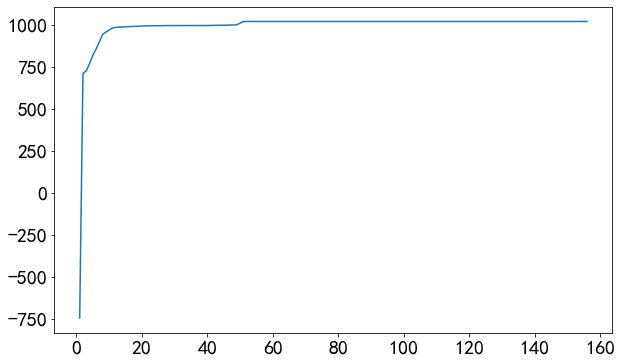

In [139]:
plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, n_epochs + 1), likelihoods)
plt.tick_params(labelsize=20)
plt.show()

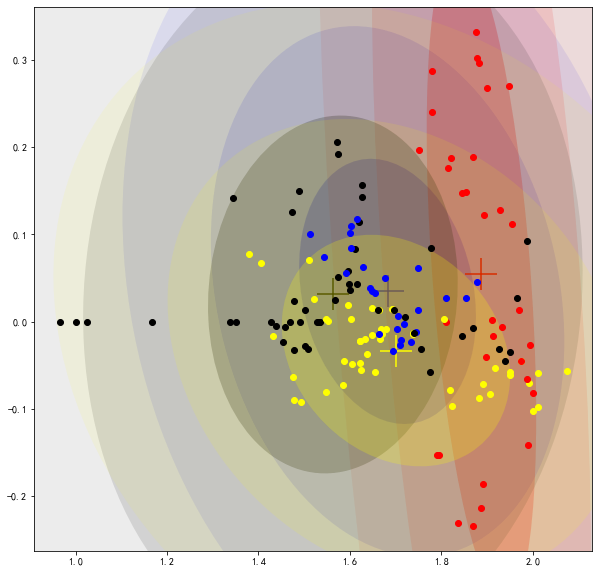

In [145]:
create_cluster_animation(myArray, history, scores)

In [144]:
clusters

[{'pi_k': array([0.16672697]),
  'mu_k': array([ 1.68256788,  0.03483328,  0.86140999, -0.01547906,  6.40537187]),
  'cov_k': array([[ 7.32421689e-03, -2.03829824e-03,  4.07030038e-03,
          -9.84681730e-05, -7.62400715e-03],
         [-2.03829824e-03,  1.98605372e-03, -2.72905390e-03,
           3.87893879e-05,  2.45094269e-03],
         [ 4.07030038e-03, -2.72905390e-03,  2.01901839e-02,
           1.14110651e-05, -1.22607107e-03],
         [-9.84681730e-05,  3.87893879e-05,  1.14110651e-05,
           1.04329194e-05,  2.93479537e-04],
         [-7.62400715e-03,  2.45094269e-03, -1.22607107e-03,
           2.93479537e-04,  3.69004845e-02]])},
 {'pi_k': array([0.21233935]),
  'mu_k': array([ 1.88792411,  0.05432199,  1.71379216, -0.00841285,  6.77764598]),
  'cov_k': array([[ 4.78533006e-03, -2.63414199e-03,  5.31320010e-03,
           2.38643269e-04, -6.66469282e-03],
         [-2.63414199e-03,  2.93077488e-02, -3.31996600e-02,
          -2.43434809e-04,  4.11866851e-02],
       

In [146]:
n_clusters = 4
n_epochs = 156

clusters, likelihoods, scores, sample_likelihoods, history = train_gmm(myArray_predict, n_clusters, n_epochs)

Epoch:  1 Likelihood:  -746.2567714795006
Epoch:  2 Likelihood:  718.3109386028249
Epoch:  3 Likelihood:  733.5132396587555
Epoch:  4 Likelihood:  777.5425468360551
Epoch:  5 Likelihood:  836.7980154620062
Epoch:  6 Likelihood:  891.1486015857715
Epoch:  7 Likelihood:  941.7003256134724
Epoch:  8 Likelihood:  993.1202634561639
Epoch:  9 Likelihood:  1025.0471364879907
Epoch:  10 Likelihood:  1031.0407831943357
Epoch:  11 Likelihood:  1033.1553513722774
Epoch:  12 Likelihood:  1035.3249993760023
Epoch:  13 Likelihood:  1035.6786038999728
Epoch:  14 Likelihood:  1035.714903202098
Epoch:  15 Likelihood:  1035.7447008268832
Epoch:  16 Likelihood:  1035.774110928083
Epoch:  17 Likelihood:  1035.8028164312714
Epoch:  18 Likelihood:  1035.8279526959343
Epoch:  19 Likelihood:  1035.8468271337279
Epoch:  20 Likelihood:  1035.859253003662
Epoch:  21 Likelihood:  1035.8669921209835
Epoch:  22 Likelihood:  1035.871880849894
Epoch:  23 Likelihood:  1035.8750658869772
Epoch:  24 Likelihood:  1035.87

In [147]:
tt = scores.tolist()
c_1 = []
c_2 = []
c_3 = []
c_4 = []
n = []
for i in tt:
    c_1.append(i[0])
    c_2.append(i[1])
    c_3.append(i[2])
    c_4.append(i[3])
    n.append(np.argmax(i))
c_1 = np.array(c_1)
c_2 = np.array(c_2)
c_3 = np.array(c_3)
c_4 = np.array(c_4)
n = np.array(n)

cc_1 = pd.Series(c_1, index=factor1.index)
cc_2 = pd.Series(c_2, index=factor2.index)
cc_3 = pd.Series(c_3, index=factor3.index)
cc_4 = pd.Series(c_4, index=factor4.index)
nn = pd.Series(n, index=factor1.index)

C = pd.DataFrame({'c_1':cc_1,'c_2':cc_2, 'c_3':cc_3, 'c_4':cc_4, 'n':nn})
C.to_csv("market_predict.csv")

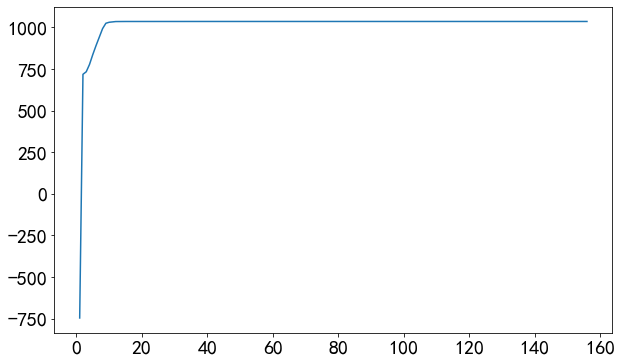

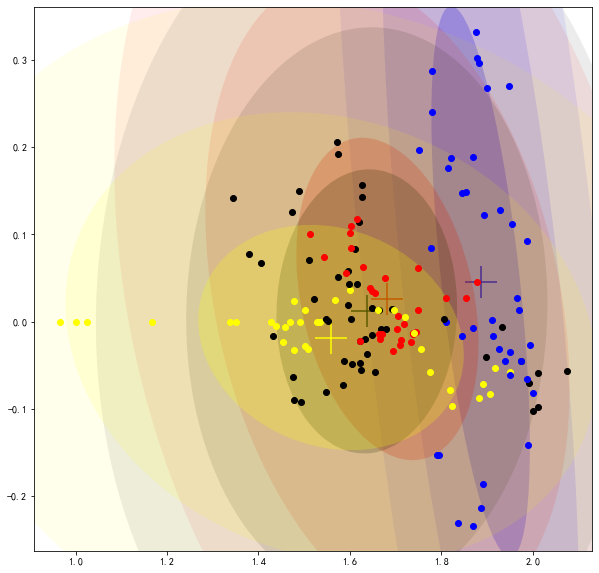

In [150]:
plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, n_epochs + 1), likelihoods)
plt.tick_params(labelsize=20)
plt.show()

create_cluster_animation(myArray, history, scores)

In [149]:
clusters

[{'pi_k': array([0.25505157]),
  'mu_k': array([ 1.88617107,  0.04610001,  1.6863127 , -0.00934152,  6.79355077]),
  'cov_k': array([[ 3.51659462e-03, -2.82383112e-03,  5.07792072e-03,
           1.49747702e-04, -6.98551073e-03],
         [-2.82383112e-03,  2.25524747e-02, -2.43021325e-02,
          -8.54654968e-05,  2.65791522e-02],
         [ 5.07792072e-03, -2.43021325e-02,  4.21642417e-02,
           4.54862424e-04, -4.02102119e-02],
         [ 1.49747702e-04, -8.54654968e-05,  4.54862424e-04,
           2.24009338e-05, -5.63778114e-04],
         [-6.98551073e-03,  2.65791522e-02, -4.02102119e-02,
          -5.63778114e-04,  5.12318538e-02]])},
 {'pi_k': array([0.20110125]),
  'mu_k': array([ 1.68227415,  0.02615299,  0.9229661 , -0.01333469,  6.37523342]),
  'cov_k': array([[ 6.48314254e-03, -1.66290019e-03,  3.13108936e-03,
          -8.61934254e-05, -6.56104359e-03],
         [-1.66290019e-03,  2.03736234e-03, -4.84760529e-03,
          -5.85347007e-05,  3.30649421e-03],
       

In [4]:
stock1 = 'stock/000068.csv'
stock2 = 'stock/000720.csv'
stock3 = 'stock/300095.csv'
stock4 = 'stock/600561.csv'
stock5 = 'stock/603638.csv'
stock1_in = 'stock_indicator/000068.csv'
stock2_in = 'stock_indicator/000720.csv'
stock3_in = 'stock_indicator/300095.csv'
stock4_in = 'stock_indicator/600561.csv'
stock5_in = 'stock_indicator/603638.csv'

bond1 = 'bond/sh010107.csv'
bond2 = 'bond/sz127003.csv'

In [5]:
stock1 = pd.read_csv(stock1,engine="python",encoding='utf-8')
stock2 = pd.read_csv(stock2,engine="python",encoding='utf-8')
stock3 = pd.read_csv(stock3,engine="python",encoding='utf-8')
stock4 = pd.read_csv(stock4,engine="python",encoding='utf-8')
stock5 = pd.read_csv(stock5,engine="python",encoding='utf-8')

stock1_in = pd.read_csv(stock1_in,engine="python",encoding='utf-8')
stock2_in = pd.read_csv(stock2_in,engine="python",encoding='utf-8')
stock3_in = pd.read_csv(stock3_in,engine="python",encoding='utf-8')
stock4_in = pd.read_csv(stock4_in,engine="python",encoding='utf-8')
stock5_in = pd.read_csv(stock5_in,engine="python",encoding='utf-8')

bond1 = pd.read_csv(bond1,engine="python",encoding='utf-8')
bond2 = pd.read_csv(bond2,engine="python",encoding='utf-8')

In [6]:
stock1['日期'] = pd.to_datetime(stock1['日期']).dt.normalize()
stock1 = stock1.set_index('日期')
stock1 = stock1.sort_index(ascending=True)
stock1 = stock1.resample('B').bfill()
stock1 = stock1.loc['2017-01-03':'2021-12-31',:]
stock1.fillna(0, inplace=True)

stock2['日期'] = pd.to_datetime(stock2['日期']).dt.normalize()
stock2 = stock2.set_index('日期')
stock2 = stock2.sort_index(ascending=True)
stock2 = stock2.resample('B').bfill()
stock2 = stock2.loc['2017-01-03':'2021-12-31',:]
stock2.fillna(0, inplace=True)

stock3['日期'] = pd.to_datetime(stock3['日期']).dt.normalize()
stock3 = stock3.set_index('日期')
stock3 = stock3.sort_index(ascending=True)
stock3 = stock3.resample('B').bfill()
stock3 = stock3.loc['2017-01-03':'2021-12-31',:]
stock3.fillna(0, inplace=True)

stock4['日期'] = pd.to_datetime(stock4['日期']).dt.normalize()
stock4 = stock4.set_index('日期')
stock4 = stock4.sort_index(ascending=True)
stock4 = stock4.resample('B').bfill()
stock4 = stock4.loc['2017-01-03':'2021-12-31',:]
stock4.fillna(0, inplace=True)

stock5['日期'] = pd.to_datetime(stock5['日期']).dt.normalize()
stock5 = stock5.set_index('日期')
stock5 = stock5.sort_index(ascending=True)
stock5 = stock5.resample('B').bfill()
stock5 = stock5.loc['2017-01-03':'2021-12-31',:]
stock5.fillna(0, inplace=True)

stock1_in['trade_date'] = pd.to_datetime(stock1_in['trade_date']).dt.normalize()
stock1_in = stock1_in.set_index('trade_date')
stock1_in = stock1_in.sort_index(ascending=True)
stock1_in = stock1_in.resample('B').bfill()
stock1_in = stock1_in.loc['2017-01-03':'2021-12-31',:]
stock1_in.fillna(0, inplace=True)

stock2_in['trade_date'] = pd.to_datetime(stock2_in['trade_date']).dt.normalize()
stock2_in = stock2_in.set_index('trade_date')
stock2_in = stock2_in.sort_index(ascending=True)
stock2_in = stock2_in.resample('B').bfill()
stock2_in = stock2_in.loc['2017-01-03':'2021-12-31',:]
stock2_in.fillna(0, inplace=True)

stock3_in['trade_date'] = pd.to_datetime(stock3_in['trade_date']).dt.normalize()
stock3_in = stock3_in.set_index('trade_date')
stock3_in = stock3_in.sort_index(ascending=True)
stock3_in = stock3_in.resample('B').bfill()
stock3_in = stock3_in.loc['2017-01-03':'2021-12-31',:]
stock3_in.fillna(0, inplace=True)

stock4_in['trade_date'] = pd.to_datetime(stock4_in['trade_date']).dt.normalize()
stock4_in = stock4_in.set_index('trade_date')
stock4_in = stock4_in.sort_index(ascending=True)
stock4_in = stock4_in.resample('B').bfill()
stock4_in = stock4_in.loc['2017-01-03':'2021-12-31',:]
stock4_in.fillna(0, inplace=True)

stock5_in['trade_date'] = pd.to_datetime(stock5_in['trade_date']).dt.normalize()
stock5_in = stock5_in.set_index('trade_date')
stock5_in = stock5_in.sort_index(ascending=True)
stock5_in = stock5_in.resample('B').bfill()
stock5_in = stock5_in.loc['2017-01-03':'2021-12-31',:]
stock5_in.fillna(0, inplace=True)

bond1['date'] = pd.to_datetime(bond1['date']).dt.normalize()
bond1 = bond1.set_index('date')
bond1 = bond1.sort_index(ascending=True)
bond1 = bond1.resample('B').bfill()
bond1 = bond1.loc['2017-01-03':'2021-12-31',:]
bond1.fillna(0, inplace=True)

bond2['date'] = pd.to_datetime(bond2['date']).dt.normalize()
bond2 = bond2.set_index('date')
bond2 = bond2.sort_index(ascending=True)
bond2 = bond2.resample('B').bfill()
bond2 = bond2.loc['2017-01-03':'2021-12-31',:]
bond2.fillna(0, inplace=True)

In [7]:
table = pd.DataFrame({'stock1':stock1['收盘'],'stock2':stock2['收盘'],'stock3':stock3['收盘'],
                      'stock4':stock4['收盘'],'stock5':stock5['收盘'],'bond1':bond1['close'],
                      'bond2':bond2['close']})
returns = table.pct_change()
mean_returns = returns.mean()
cov_matrix = returns.cov()
num_portfolios = 5000000
risk_free_rate = 0.022238

In [8]:
stock1_pct = stock1['收盘'].pct_change()
stock2_pct = stock2['收盘'].pct_change()
stock3_pct = stock3['收盘'].pct_change()
stock4_pct = stock4['收盘'].pct_change()
stock5_pct = stock5['收盘'].pct_change()

bond1_pct = bond1['close'].pct_change()
bond2_pct = bond2['close'].pct_change()

(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='收盘'>)

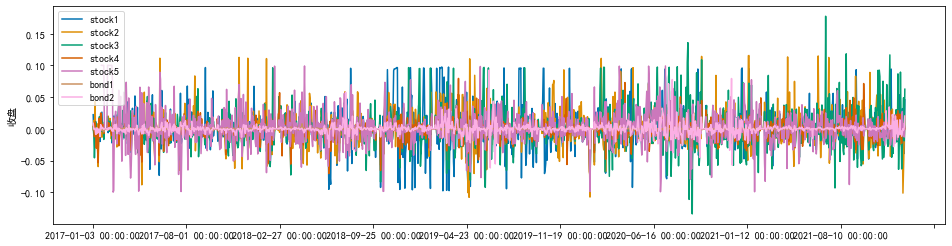

In [283]:
from sktime.utils.plotting import plot_series
plot_series(stock1_pct,stock2_pct,stock3_pct,stock4_pct,stock5_pct,bond1_pct,bond2_pct
            ,labels=['stock1','stock2','stock3','stock4','stock5','bond1','bond2']
            ,markers=['','','','','','',''])

In [320]:
import pandas as pd  
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.optimize as sco

plt.style.use('fivethirtyeight')
np.random.seed(777)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [321]:
def portfolio_annualised_performance(weights, mean_returns, cov_matrix):
    returns = np.sum(mean_returns*weights )*252
    std = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights))) * np.sqrt(252)
    return std, returns

def random_portfolios(num_portfolios, mean_returns, cov_matrix, risk_free_rate):
    results = np.zeros((3,num_portfolios))
    weights_record = []
    for i in range(num_portfolios):
        weights = np.random.random(7)
        weights /= np.sum(weights)
        weights_record.append(weights)
        portfolio_std_dev, portfolio_return = portfolio_annualised_performance(weights, mean_returns, cov_matrix)
        results[0,i] = portfolio_std_dev
        results[1,i] = portfolio_return
        results[2,i] = (portfolio_return - risk_free_rate) / portfolio_std_dev
    return results, weights_record

def display_simulated_ef_with_random(mean_returns, cov_matrix, num_portfolios, risk_free_rate):
    results, weights = random_portfolios(num_portfolios,mean_returns, cov_matrix, risk_free_rate)
    
    max_sharpe_idx = np.argmax(results[2])
    sdp, rp = results[0,max_sharpe_idx], results[1,max_sharpe_idx]
    max_sharpe_allocation = pd.DataFrame(weights[max_sharpe_idx],index=table.columns,columns=['allocation'])
    max_sharpe_allocation.allocation = [round(i*100,2)for i in max_sharpe_allocation.allocation]
    max_sharpe_allocation = max_sharpe_allocation.T
    
    min_vol_idx = np.argmin(results[0])
    sdp_min, rp_min = results[0,min_vol_idx], results[1,min_vol_idx]
    min_vol_allocation = pd.DataFrame(weights[min_vol_idx],index=table.columns,columns=['allocation'])
    min_vol_allocation.allocation = [round(i*100,2)for i in min_vol_allocation.allocation]
    min_vol_allocation = min_vol_allocation.T
    
    print("-"*80)
    print ("Maximum Sharpe Ratio Portfolio Allocation\n")
    print ("Annualised Return:", round(rp,2))
    print ("Annualised Volatility:", round(sdp,2))
    print("Sharpe Ratio:", round(results[2,max_sharpe_idx],2))
    print ("\n")
    print (max_sharpe_allocation)
    print ("-"*80)
    print ("Minimum Volatility Portfolio Allocation\n")
    print ("Annualised Return:", round(rp_min,2))
    print ("Annualised Volatility:", round(sdp_min,2))
    print("Sharpe Ratio:", round(results[2,min_vol_idx],2))
    print ("\n")
    print( min_vol_allocation)
    
    plt.figure(figsize=(10, 7))
    plt.scatter(results[0,:],results[1,:],c=results[2,:],cmap='YlGnBu', marker='o', s=10, alpha=0.3)
    plt.colorbar()
    plt.scatter(sdp,rp,marker='*',color='r',s=500, label='Maximum Sharpe ratio')
    plt.scatter(sdp_min,rp_min,marker='*',color='g',s=500, label='Minimum volatility')
    plt.tick_params(labelsize=20)
    plt.xlabel('Volatility',fontsize=20)
    plt.ylabel('Returns',fontsize=20)
    plt.legend(labelspacing=0.8,fontsize=15)

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.41
Annualised Volatility: 0.29
Sharpe Ratio: 1.34


            stock1  stock2  stock3  stock4  stock5  bond1  bond2
allocation    1.69    3.04    7.82    0.03   64.42   21.8   1.21
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.01
Annualised Volatility: 0.04
Sharpe Ratio: -0.36


            stock1  stock2  stock3  stock4  stock5  bond1  bond2
allocation    1.62    1.03    4.71    5.68    2.44   81.9   2.63


C:\Users\DaryLLS\AppData\Local\Temp\ipykernel_20504\3480854941.py:51: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


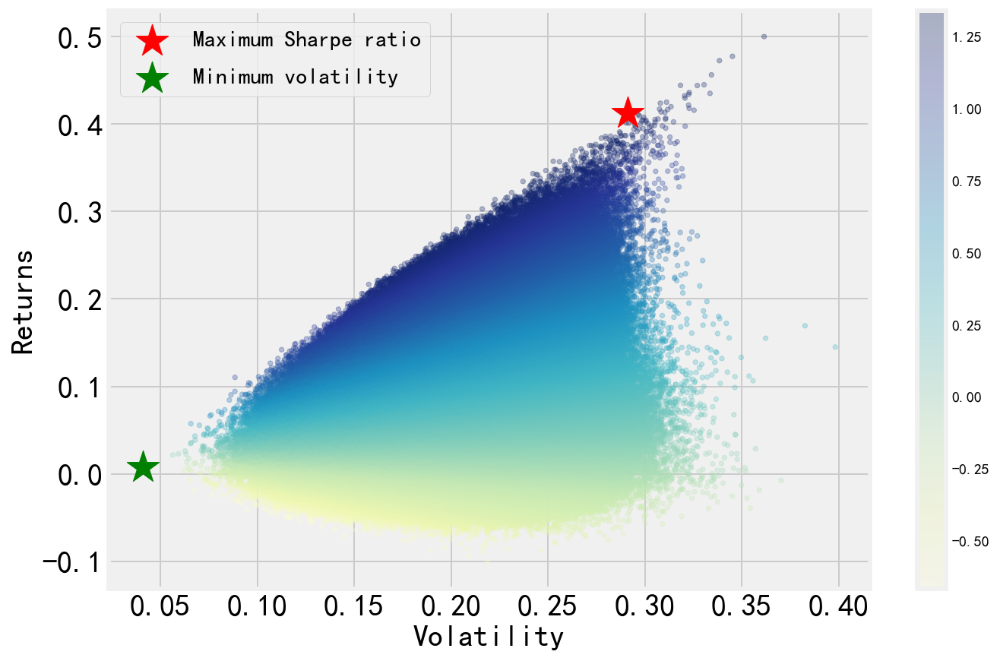

In [322]:
display_simulated_ef_with_random(mean_returns, cov_matrix, num_portfolios, risk_free_rate)

In [323]:
def neg_sharpe_ratio(weights, mean_returns, cov_matrix, risk_free_rate):
    p_var, p_ret = portfolio_annualised_performance(weights, mean_returns, cov_matrix)
    return -(p_ret - risk_free_rate) / p_var

def max_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix, risk_free_rate)
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bound = (0.0,1.0)
    bounds = tuple(bound for asset in range(num_assets))
    result = sco.minimize(neg_sharpe_ratio, num_assets*[1./num_assets,], args=args,
                        method='SLSQP', bounds=bounds, constraints=constraints)
    return result

def portfolio_volatility(weights, mean_returns, cov_matrix):
    return portfolio_annualised_performance(weights, mean_returns, cov_matrix)[0]

def min_variance(mean_returns, cov_matrix):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix)
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bound = (0.0,1.0)
    bounds = tuple(bound for asset in range(num_assets))

    result = sco.minimize(portfolio_volatility, num_assets*[1./num_assets,], args=args,
                        method='SLSQP', bounds=bounds, constraints=constraints)

    return result

def efficient_return(mean_returns, cov_matrix, target):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix)

    def portfolio_return(weights):
        return portfolio_annualised_performance(weights, mean_returns, cov_matrix)[1]

    constraints = ({'type': 'eq', 'fun': lambda x: portfolio_return(x) - target},
                   {'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bounds = tuple((0,1) for asset in range(num_assets))
    result = sco.minimize(portfolio_volatility, num_assets*[1./num_assets,], args=args, method='SLSQP', bounds=bounds, constraints=constraints)
    return result


def efficient_frontier(mean_returns, cov_matrix, returns_range):
    efficients = []
    for ret in returns_range:
        efficients.append(efficient_return(mean_returns, cov_matrix, ret))
    return efficients

def display_calculated_ef_with_random(mean_returns, cov_matrix, num_portfolios, risk_free_rate):
    results, _ = random_portfolios(num_portfolios,mean_returns, cov_matrix, risk_free_rate)
    
    max_sharpe = max_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate)
    sdp, rp = portfolio_annualised_performance(max_sharpe['x'], mean_returns, cov_matrix)
    max_sharpe_allocation = pd.DataFrame(max_sharpe.x,index=table.columns,columns=['allocation'])
    max_sharpe_allocation.allocation = [round(i*100,2)for i in max_sharpe_allocation.allocation]
    max_sharpe_allocation = max_sharpe_allocation.T
    max_sharpe_allocation

    min_vol = min_variance(mean_returns, cov_matrix)
    sdp_min, rp_min = portfolio_annualised_performance(min_vol['x'], mean_returns, cov_matrix)
    min_vol_allocation = pd.DataFrame(min_vol.x,index=table.columns,columns=['allocation'])
    min_vol_allocation.allocation = [round(i*100,2)for i in min_vol_allocation.allocation]
    min_vol_allocation = min_vol_allocation.T
    
    print ("-"*80)
    print ("Maximum Sharpe Ratio Portfolio Allocation\n")
    print ("Annualised Return:", round(rp,2))
    print ("Annualised Volatility:", round(sdp,2))
    print ("\n")
    print (max_sharpe_allocation)
    print ("-"*80)
    print ("Minimum Volatility Portfolio Allocation\n")
    print ("Annualised Return:", round(rp_min,2))
    print( "Annualised Volatility:", round(sdp_min,2))
    print ("\n")
    print (min_vol_allocation)
    
    plt.figure(figsize=(10, 7))
    plt.scatter(results[0,:],results[1,:],c=results[2,:],cmap='YlGnBu', marker='o', s=10, alpha=0.3)
    plt.colorbar()
    plt.scatter(sdp,rp,marker='*',color='r',s=500, label='Maximum Sharpe ratio')
    plt.scatter(sdp_min,rp_min,marker='*',color='g',s=500, label='Minimum volatility')

    target = np.linspace(rp_min, 0.32, 50)
    efficient_portfolios = efficient_frontier(mean_returns, cov_matrix, target)
    plt.plot([p['fun'] for p in efficient_portfolios], target, linestyle='-.', color='black', label='efficient frontier')
    plt.tick_params(labelsize=20)
    plt.xlabel('Volatility',fontsize=20)
    plt.ylabel('Returns',fontsize=20)
    plt.legend(labelspacing=0.8,fontsize=15)

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.61
Annualised Volatility: 0.42


            stock1  stock2  stock3  stock4  stock5  bond1  bond2
allocation     0.0     0.0    3.68     0.0   96.32    0.0    0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: -0.01
Annualised Volatility: 0.01


            stock1  stock2  stock3  stock4  stock5  bond1  bond2
allocation     0.0     0.0    0.06    0.23    0.06  98.88   0.76


C:\Users\DaryLLS\AppData\Local\Temp\ipykernel_20504\230988611.py:81: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


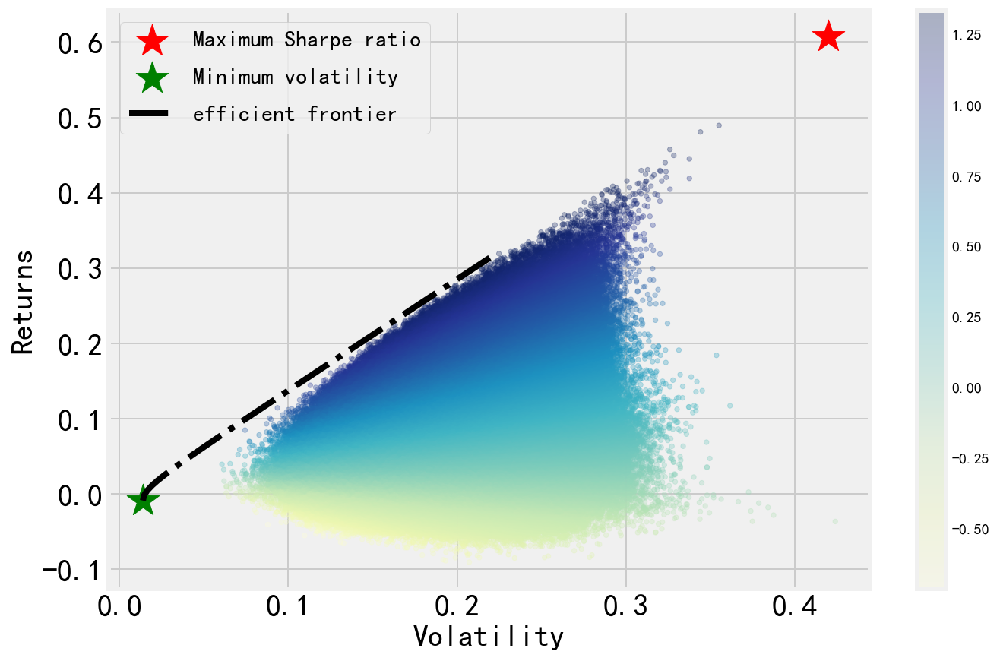

In [324]:
display_calculated_ef_with_random(mean_returns, cov_matrix, num_portfolios, risk_free_rate)

In [396]:
factor1_adj = factor1.pct_change().resample('B').bfill()
factor1_adj = factor1_adj[2066:]
factor1_adj

factor2_adj = factor2.pct_change().resample('B').bfill()
factor2_adj = factor2_adj[2066:]
factor2_adj

factor3_adj = factor3.pct_change().resample('B').bfill()
factor3_adj = factor3_adj[2066:]
factor3_adj

factor4_adj = factor4.pct_change().resample('B').bfill()
factor4_adj = factor4_adj[2066:]
factor4_adj

factor5_adj = factor5.pct_change().resample('B').bfill()
factor5_adj = factor5_adj[2066:]
factor5_adj

data_market = pd.DataFrame({'Increasing':factor1_adj,
                            'Inflation_life':factor2_adj,
                            'Inflation_product':factor3_adj,
                            'Rate':factor4_adj,
                            'Exchange':factor5_adj})
data_market

,Increasing,Inflation_life,Inflation_product,Rate,Exchange
日期,,,,,
2017-01-02,0.036047,-0.576591,0.055504,-0.658878,-0.029532
2017-01-03,0.036047,-0.576591,0.055504,-0.658878,-0.029532
2017-01-04,0.036047,-0.576591,0.055504,-0.658878,-0.029532
2017-01-05,0.036047,-0.576591,0.055504,-0.658878,-0.029532
2017-01-06,0.036047,-0.576591,0.055504,-0.658878,-0.029532
2017-01-09,0.036047,-0.576591,0.055504,-0.658878,-0.029532
2017-01-10,0.036047,-0.576591,0.055504,-0.658878,-0.029532
2017-01-11,0.036047,-0.576591,0.055504,-0.658878,-0.029532
2017-01-12,0.036047,-0.576591,0.055504,-0.658878,-0.029532


In [646]:
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data) 
    cols = []
    names = []
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
     # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

def my_predict(data,data_in,data_market,e):
    dataset = pd.DataFrame({'收益率':data,
                            'PE':data_in['pe'],
                            'PB':data_in['pb'],
                            'PS':data_in['ps'],
                            'DV_ratio':data_in['dv_ratio'],
                            'total_mv':data_in['total_mv'],
                            'Increasing':data_market['Increasing'],
                            'Inflation_life':data_market['Inflation_life'],
                            'Inflation_product':data_market['Inflation_product'],
                            'Rate':data_market['Rate'],
                            'Exchange':data_market['Exchange']})
    
    values = dataset.values
    # integer encode direction
    encoder = LabelEncoder()
    values[:,4] = encoder.fit_transform(values[:,4])
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 1, 1)
    reframed.drop(reframed.columns[[12,13,14,15,16,17,18,19,20,21]], axis=1, inplace=True)
    print(reframed.head())
    
    # split into train and test sets
    values = reframed.values
    n_train = int((len(reframed)*0.75)/1)
    train = values[:n_train, :]
    test = values[n_train:, :]

    # split into input and outputs
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]
    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)
    
    model = Sequential()
    model.add(LSTM(e, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    
    # fit network
    history = model.fit(train_X, train_y, epochs=e, batch_size=6000, validation_data=(test_X, test_y), verbose=2, shuffle=False)
    # plot history
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.legend()
    plt.show()
    
    # make a prediction
    yhat = model.predict(test_X)
    test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
    # invert scaling for forecast
    inv_yhat = np.concatenate((yhat, test_X[:, 1:]), axis=1)
    inv_yhat = scaler.inverse_transform(inv_yhat)
    inv_yhat = inv_yhat[:,0]
    inv_yhat = pd.Series(inv_yhat, index = dataset.index[-len(inv_yhat):].to_period())
    # invert scaling for actual
    test_y = test_y.reshape((len(test_y), 1))
    inv_y = np.concatenate((test_y, test_X[:, 1:]), axis=1)
    inv_y = scaler.inverse_transform(inv_y)
    inv_y = inv_y[:,0]
    inv_y  = pd.Series(inv_y, index = dataset.index[-len(inv_y):].to_period())
    # invert scaling for train
    xhat = model.predict(train_X)
    train_X = train_X.reshape((train_X.shape[0], train_X.shape[2]))
    inv_xhat = np.concatenate((xhat, train_X[:, 1:]), axis=1)
    inv_xhat = scaler.inverse_transform(inv_xhat)
    inv_xhat = inv_xhat[:,0]
    inv_xhat  = pd.Series(inv_xhat, index = dataset.index[:n_train].to_period())
    train_X = scaler.inverse_transform(train_X)
    inv_x  = pd.Series(train_X[:,0], index = dataset.index[:n_train].to_period())
    
    print("mean_squared_error:",mean_squared_error(inv_y, inv_yhat))
    print("mean_absolute_error:",mean_absolute_error(inv_y, inv_yhat))
    print("r2_score:",r2_score(inv_y, inv_yhat))
    
    fig, ax = plot_series(inv_x, inv_y, inv_xhat, inv_yhat, labels=["train", "test", "train(Predict)", "test(Predict)"]
                          ,markers=['','','',''])
    fig.set_size_inches(20,12)
    plt.legend(loc = 0, fontsize=23)
    plt.tick_params(labelsize=20)
    # calculate RMSE
    rmse = np.sqrt(mean_squared_error(inv_y, inv_yhat))
    print('Test RMSE: %.3f' % rmse)
    
    predict_data = pd.concat([inv_x,inv_y[:3]])
    predict_data = pd.concat([predict_data,inv_yhat])
    return predict_data
    
def diff_predict(data,data_in,data_market,e):
    dataset = pd.DataFrame({'收益率':data,
                            'PE':data_in['pe'],
                            'PB':data_in['pb'],
                            'PS':data_in['ps'],
                            'DV_ratio':data_in['dv_ratio'],
                            'total_mv':data_in['total_mv']})
    values = dataset.values
    # integer encode direction
    encoder = LabelEncoder()
    values[:,4] = encoder.fit_transform(values[:,4])
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 1, 1)
    reframed.drop(reframed.columns[[7,8,9,10,11]], axis=1, inplace=True)
    
    # split into train and test sets
    values = reframed.values
    n_train = int((len(reframed)*0.75)/1)
    train = values[:n_train, :]
    test = values[n_train:, :]

    # split into input and outputs
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]
    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)
    
    model = Sequential()
    model.add(LSTM(e, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    
    # fit network
    history = model.fit(train_X, train_y, epochs=e, batch_size=6000, validation_data=(test_X, test_y), verbose=2, shuffle=False)
    # plot history
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.legend()
    plt.show()
    
    # make a prediction
    yhat = model.predict(test_X)
    test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
    # invert scaling for forecast
    inv_yhat = np.concatenate((yhat, test_X[:, 1:]), axis=1)
    inv_yhat = scaler.inverse_transform(inv_yhat)
    inv_yhat = inv_yhat[:,0]
    inv_yhat = pd.Series(inv_yhat, index = dataset.index[-len(inv_yhat):].to_period())
    # invert scaling for actual
    test_y = test_y.reshape((len(test_y), 1))
    inv_y = np.concatenate((test_y, test_X[:, 1:]), axis=1)
    inv_y = scaler.inverse_transform(inv_y)
    inv_y = inv_y[:,0]
    inv_y  = pd.Series(inv_y, index = dataset.index[-len(inv_y):].to_period())
    # invert scaling for train
    xhat = model.predict(train_X)
    train_X = train_X.reshape((train_X.shape[0], train_X.shape[2]))
    inv_xhat = np.concatenate((xhat, train_X[:, 1:]), axis=1)
    inv_xhat = scaler.inverse_transform(inv_xhat)
    inv_xhat = inv_xhat[:,0]
    inv_xhat  = pd.Series(inv_xhat, index = dataset.index[:n_train].to_period())
    train_X = scaler.inverse_transform(train_X)
    inv_x  = pd.Series(train_X[:,0], index = dataset.index[:n_train].to_period())
    
    print("mean_squared_error:",mean_squared_error(inv_y, inv_yhat))
    print("mean_absolute_error:",mean_absolute_error(inv_y, inv_yhat))
    print("r2_score:",r2_score(inv_y, inv_yhat))
    
    fig, ax = plot_series(inv_x, inv_y, inv_xhat, inv_yhat, labels=["train", "test", "train(Predict)", "test(Predict)"],
                         markers=['','','',''])
    fig.set_size_inches(20,12)
    plt.legend(loc = 0, fontsize=23)
    plt.tick_params(labelsize=20)
    # calculate RMSE
    rmse = np.sqrt(mean_squared_error(inv_y, inv_yhat))
    print('Test RMSE: %.3f' % rmse)
    
    predict_data = pd.concat([inv_x,inv_y[:3]])
    predict_data = pd.concat([predict_data,inv_yhat])
    return predict_data

   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
3   0.615333   1.000000   1.000000   1.000000        0.0   0.954955   
4   0.466556   0.993023   0.990786   0.992182        0.0   0.945946   
5   0.511844   0.995349   0.993855   0.994788        0.0   0.948949   
6   0.501133   0.995349   0.993855   0.994788        0.0   0.948949   
7   0.447688   0.984884   0.980034   0.983061        0.0   0.935435   

   var7(t-1)  var8(t-1)  var9(t-1)  var10(t-1)  var11(t-1)   var1(t)  
3   0.853396   0.521279   0.786894    0.251485    0.134206  0.466556  
4   0.853396   0.521279   0.786894    0.251485    0.134206  0.511844  
5   0.853396   0.521279   0.786894    0.251485    0.134206  0.501133  
6   0.853396   0.521279   0.786894    0.251485    0.134206  0.447688  
7   0.853396   0.521279   0.786894    0.251485    0.134206  0.460627  
(976, 1, 11) (976,) (326, 1, 11) (326,)
Epoch 1/600
6/6 - 3s - loss: 0.1994 - val_loss: 0.0785 - 3s/epoch - 490ms/step
Epoch 2/600
6/6 - 0s - loss:

6/6 - 0s - loss: 0.0260 - val_loss: 0.0128 - 125ms/epoch - 21ms/step
Epoch 91/600
6/6 - 0s - loss: 0.0260 - val_loss: 0.0128 - 118ms/epoch - 20ms/step
Epoch 92/600
6/6 - 0s - loss: 0.0260 - val_loss: 0.0128 - 112ms/epoch - 19ms/step
Epoch 93/600
6/6 - 0s - loss: 0.0260 - val_loss: 0.0128 - 114ms/epoch - 19ms/step
Epoch 94/600
6/6 - 0s - loss: 0.0260 - val_loss: 0.0128 - 113ms/epoch - 19ms/step
Epoch 95/600
6/6 - 0s - loss: 0.0260 - val_loss: 0.0128 - 112ms/epoch - 19ms/step
Epoch 96/600
6/6 - 0s - loss: 0.0260 - val_loss: 0.0127 - 114ms/epoch - 19ms/step
Epoch 97/600
6/6 - 0s - loss: 0.0260 - val_loss: 0.0127 - 112ms/epoch - 19ms/step
Epoch 98/600
6/6 - 0s - loss: 0.0260 - val_loss: 0.0127 - 118ms/epoch - 20ms/step
Epoch 99/600
6/6 - 0s - loss: 0.0260 - val_loss: 0.0127 - 116ms/epoch - 19ms/step
Epoch 100/600
6/6 - 0s - loss: 0.0260 - val_loss: 0.0127 - 113ms/epoch - 19ms/step
Epoch 101/600
6/6 - 0s - loss: 0.0260 - val_loss: 0.0127 - 121ms/epoch - 20ms/step
Epoch 102/600
6/6 - 0s - lo

Epoch 189/600
6/6 - 0s - loss: 0.0258 - val_loss: 0.0124 - 120ms/epoch - 20ms/step
Epoch 190/600
6/6 - 0s - loss: 0.0258 - val_loss: 0.0124 - 118ms/epoch - 20ms/step
Epoch 191/600
6/6 - 0s - loss: 0.0258 - val_loss: 0.0124 - 113ms/epoch - 19ms/step
Epoch 192/600
6/6 - 0s - loss: 0.0258 - val_loss: 0.0124 - 114ms/epoch - 19ms/step
Epoch 193/600
6/6 - 0s - loss: 0.0258 - val_loss: 0.0124 - 117ms/epoch - 20ms/step
Epoch 194/600
6/6 - 0s - loss: 0.0258 - val_loss: 0.0124 - 118ms/epoch - 20ms/step
Epoch 195/600
6/6 - 0s - loss: 0.0258 - val_loss: 0.0124 - 116ms/epoch - 19ms/step
Epoch 196/600
6/6 - 0s - loss: 0.0258 - val_loss: 0.0124 - 118ms/epoch - 20ms/step
Epoch 197/600
6/6 - 0s - loss: 0.0258 - val_loss: 0.0124 - 117ms/epoch - 20ms/step
Epoch 198/600
6/6 - 0s - loss: 0.0258 - val_loss: 0.0124 - 116ms/epoch - 19ms/step
Epoch 199/600
6/6 - 0s - loss: 0.0258 - val_loss: 0.0124 - 116ms/epoch - 19ms/step
Epoch 200/600
6/6 - 0s - loss: 0.0258 - val_loss: 0.0124 - 120ms/epoch - 20ms/step
Epoc

Epoch 288/600
6/6 - 0s - loss: 0.0255 - val_loss: 0.0123 - 112ms/epoch - 19ms/step
Epoch 289/600
6/6 - 0s - loss: 0.0255 - val_loss: 0.0123 - 117ms/epoch - 19ms/step
Epoch 290/600
6/6 - 0s - loss: 0.0255 - val_loss: 0.0123 - 113ms/epoch - 19ms/step
Epoch 291/600
6/6 - 0s - loss: 0.0255 - val_loss: 0.0123 - 114ms/epoch - 19ms/step
Epoch 292/600
6/6 - 0s - loss: 0.0255 - val_loss: 0.0123 - 115ms/epoch - 19ms/step
Epoch 293/600
6/6 - 0s - loss: 0.0255 - val_loss: 0.0123 - 117ms/epoch - 20ms/step
Epoch 294/600
6/6 - 0s - loss: 0.0255 - val_loss: 0.0123 - 115ms/epoch - 19ms/step
Epoch 295/600
6/6 - 0s - loss: 0.0255 - val_loss: 0.0123 - 120ms/epoch - 20ms/step
Epoch 296/600
6/6 - 0s - loss: 0.0255 - val_loss: 0.0123 - 111ms/epoch - 19ms/step
Epoch 297/600
6/6 - 0s - loss: 0.0255 - val_loss: 0.0122 - 116ms/epoch - 19ms/step
Epoch 298/600
6/6 - 0s - loss: 0.0255 - val_loss: 0.0122 - 114ms/epoch - 19ms/step
Epoch 299/600
6/6 - 0s - loss: 0.0255 - val_loss: 0.0122 - 112ms/epoch - 19ms/step
Epoc

Epoch 387/600
6/6 - 0s - loss: 0.0251 - val_loss: 0.0121 - 114ms/epoch - 19ms/step
Epoch 388/600
6/6 - 0s - loss: 0.0251 - val_loss: 0.0121 - 113ms/epoch - 19ms/step
Epoch 389/600
6/6 - 0s - loss: 0.0251 - val_loss: 0.0121 - 116ms/epoch - 19ms/step
Epoch 390/600
6/6 - 0s - loss: 0.0251 - val_loss: 0.0121 - 119ms/epoch - 20ms/step
Epoch 391/600
6/6 - 0s - loss: 0.0251 - val_loss: 0.0121 - 113ms/epoch - 19ms/step
Epoch 392/600
6/6 - 0s - loss: 0.0251 - val_loss: 0.0121 - 113ms/epoch - 19ms/step
Epoch 393/600
6/6 - 0s - loss: 0.0251 - val_loss: 0.0121 - 112ms/epoch - 19ms/step
Epoch 394/600
6/6 - 0s - loss: 0.0251 - val_loss: 0.0121 - 122ms/epoch - 20ms/step
Epoch 395/600
6/6 - 0s - loss: 0.0251 - val_loss: 0.0121 - 115ms/epoch - 19ms/step
Epoch 396/600
6/6 - 0s - loss: 0.0251 - val_loss: 0.0121 - 112ms/epoch - 19ms/step
Epoch 397/600
6/6 - 0s - loss: 0.0251 - val_loss: 0.0121 - 114ms/epoch - 19ms/step
Epoch 398/600
6/6 - 0s - loss: 0.0251 - val_loss: 0.0121 - 115ms/epoch - 19ms/step
Epoc

Epoch 486/600
6/6 - 0s - loss: 0.0247 - val_loss: 0.0124 - 117ms/epoch - 20ms/step
Epoch 487/600
6/6 - 0s - loss: 0.0247 - val_loss: 0.0124 - 112ms/epoch - 19ms/step
Epoch 488/600
6/6 - 0s - loss: 0.0247 - val_loss: 0.0124 - 114ms/epoch - 19ms/step
Epoch 489/600
6/6 - 0s - loss: 0.0247 - val_loss: 0.0124 - 115ms/epoch - 19ms/step
Epoch 490/600
6/6 - 0s - loss: 0.0247 - val_loss: 0.0124 - 115ms/epoch - 19ms/step
Epoch 491/600
6/6 - 0s - loss: 0.0247 - val_loss: 0.0124 - 117ms/epoch - 20ms/step
Epoch 492/600
6/6 - 0s - loss: 0.0247 - val_loss: 0.0124 - 113ms/epoch - 19ms/step
Epoch 493/600
6/6 - 0s - loss: 0.0247 - val_loss: 0.0124 - 112ms/epoch - 19ms/step
Epoch 494/600
6/6 - 0s - loss: 0.0247 - val_loss: 0.0125 - 117ms/epoch - 20ms/step
Epoch 495/600
6/6 - 0s - loss: 0.0247 - val_loss: 0.0125 - 112ms/epoch - 19ms/step
Epoch 496/600
6/6 - 0s - loss: 0.0247 - val_loss: 0.0125 - 112ms/epoch - 19ms/step
Epoch 497/600
6/6 - 0s - loss: 0.0247 - val_loss: 0.0125 - 113ms/epoch - 19ms/step
Epoc

Epoch 585/600
6/6 - 0s - loss: 0.0253 - val_loss: 0.0131 - 114ms/epoch - 19ms/step
Epoch 586/600
6/6 - 0s - loss: 0.0253 - val_loss: 0.0137 - 112ms/epoch - 19ms/step
Epoch 587/600
6/6 - 0s - loss: 0.0250 - val_loss: 0.0128 - 113ms/epoch - 19ms/step
Epoch 588/600
6/6 - 0s - loss: 0.0262 - val_loss: 0.0130 - 113ms/epoch - 19ms/step
Epoch 589/600
6/6 - 0s - loss: 0.0248 - val_loss: 0.0134 - 119ms/epoch - 20ms/step
Epoch 590/600
6/6 - 0s - loss: 0.0253 - val_loss: 0.0129 - 111ms/epoch - 19ms/step
Epoch 591/600
6/6 - 0s - loss: 0.0246 - val_loss: 0.0128 - 112ms/epoch - 19ms/step
Epoch 592/600
6/6 - 0s - loss: 0.0245 - val_loss: 0.0130 - 114ms/epoch - 19ms/step
Epoch 593/600
6/6 - 0s - loss: 0.0243 - val_loss: 0.0129 - 113ms/epoch - 19ms/step
Epoch 594/600
6/6 - 0s - loss: 0.0243 - val_loss: 0.0129 - 112ms/epoch - 19ms/step
Epoch 595/600
6/6 - 0s - loss: 0.0243 - val_loss: 0.0129 - 117ms/epoch - 20ms/step
Epoch 596/600
6/6 - 0s - loss: 0.0243 - val_loss: 0.0129 - 118ms/epoch - 20ms/step
Epoc

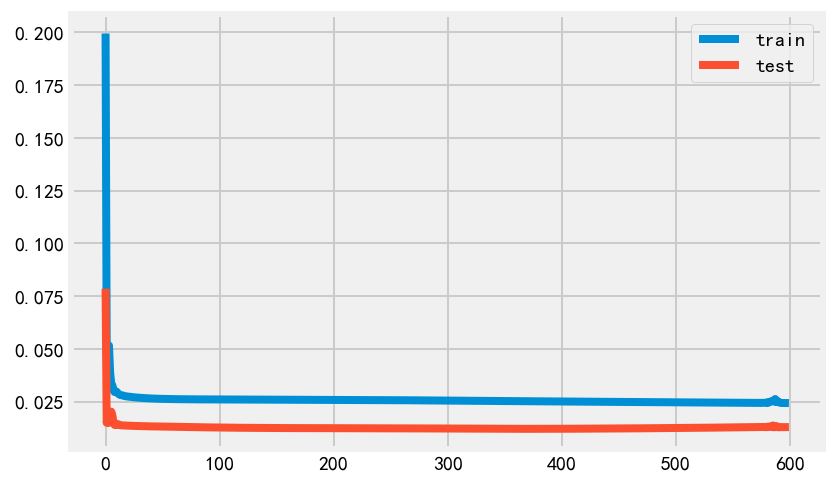

mean_squared_error: 0.00049247075
mean_absolute_error: 0.015559489
r2_score: -0.1190633510460688
Test RMSE: 0.022


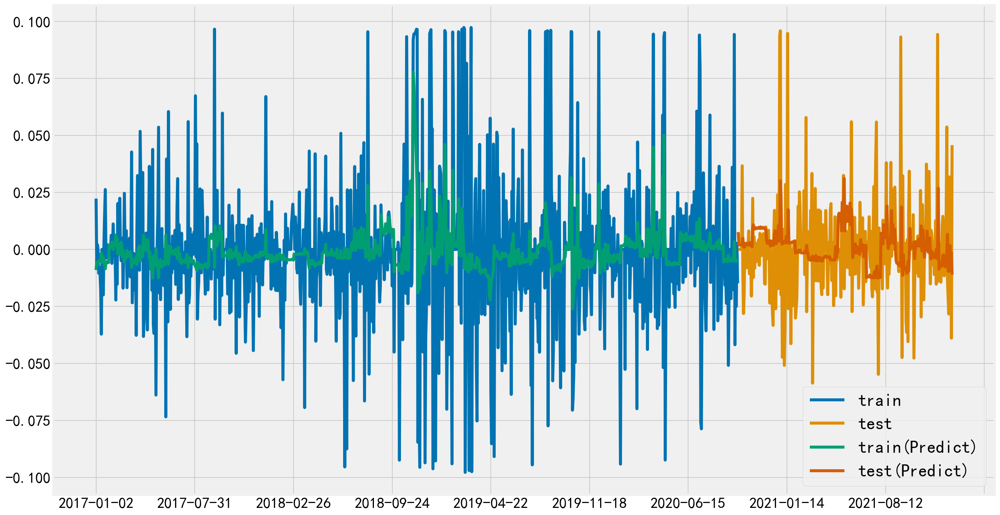

In [593]:
stock1_pdt1 = my_predict(stock1_pct,stock1_in,data_market,600)

(976, 1, 6) (976,) (326, 1, 6) (326,)
Epoch 1/600
6/6 - 2s - loss: 0.2371 - val_loss: 0.1641 - 2s/epoch - 313ms/step
Epoch 2/600
6/6 - 0s - loss: 0.1268 - val_loss: 0.0858 - 112ms/epoch - 19ms/step
Epoch 3/600
6/6 - 0s - loss: 0.0606 - val_loss: 0.0367 - 122ms/epoch - 20ms/step
Epoch 4/600
6/6 - 0s - loss: 0.0412 - val_loss: 0.0183 - 118ms/epoch - 20ms/step
Epoch 5/600
6/6 - 0s - loss: 0.0489 - val_loss: 0.0155 - 109ms/epoch - 18ms/step
Epoch 6/600
6/6 - 0s - loss: 0.0507 - val_loss: 0.0169 - 116ms/epoch - 19ms/step
Epoch 7/600
6/6 - 0s - loss: 0.0449 - val_loss: 0.0202 - 116ms/epoch - 19ms/step
Epoch 8/600
6/6 - 0s - loss: 0.0403 - val_loss: 0.0227 - 111ms/epoch - 19ms/step
Epoch 9/600
6/6 - 0s - loss: 0.0379 - val_loss: 0.0226 - 111ms/epoch - 19ms/step
Epoch 10/600
6/6 - 0s - loss: 0.0360 - val_loss: 0.0204 - 114ms/epoch - 19ms/step
Epoch 11/600
6/6 - 0s - loss: 0.0344 - val_loss: 0.0178 - 115ms/epoch - 19ms/step
Epoch 12/600
6/6 - 0s - loss: 0.0332 - val_loss: 0.0161 - 113ms/epoch -

Epoch 101/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0118 - 109ms/epoch - 18ms/step
Epoch 102/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0118 - 109ms/epoch - 18ms/step
Epoch 103/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0118 - 114ms/epoch - 19ms/step
Epoch 104/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0118 - 115ms/epoch - 19ms/step
Epoch 105/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0118 - 110ms/epoch - 18ms/step
Epoch 106/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0118 - 112ms/epoch - 19ms/step
Epoch 107/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0118 - 111ms/epoch - 19ms/step
Epoch 108/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0118 - 110ms/epoch - 18ms/step
Epoch 109/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0118 - 115ms/epoch - 19ms/step
Epoch 110/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0118 - 116ms/epoch - 19ms/step
Epoch 111/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0118 - 112ms/epoch - 19ms/step
Epoch 112/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0118 - 114ms/epoch - 19ms/step
Epoc

Epoch 200/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0119 - 112ms/epoch - 19ms/step
Epoch 201/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0119 - 116ms/epoch - 19ms/step
Epoch 202/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0119 - 112ms/epoch - 19ms/step
Epoch 203/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0119 - 109ms/epoch - 18ms/step
Epoch 204/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0119 - 111ms/epoch - 19ms/step
Epoch 205/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0119 - 109ms/epoch - 18ms/step
Epoch 206/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0119 - 113ms/epoch - 19ms/step
Epoch 207/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0119 - 107ms/epoch - 18ms/step
Epoch 208/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0119 - 112ms/epoch - 19ms/step
Epoch 209/600
6/6 - 0s - loss: 0.0261 - val_loss: 0.0119 - 111ms/epoch - 19ms/step
Epoch 210/600
6/6 - 0s - loss: 0.0260 - val_loss: 0.0119 - 111ms/epoch - 19ms/step
Epoch 211/600
6/6 - 0s - loss: 0.0260 - val_loss: 0.0119 - 119ms/epoch - 20ms/step
Epoc

Epoch 299/600
6/6 - 0s - loss: 0.0259 - val_loss: 0.0119 - 124ms/epoch - 21ms/step
Epoch 300/600
6/6 - 0s - loss: 0.0259 - val_loss: 0.0119 - 122ms/epoch - 20ms/step
Epoch 301/600
6/6 - 0s - loss: 0.0259 - val_loss: 0.0119 - 116ms/epoch - 19ms/step
Epoch 302/600
6/6 - 0s - loss: 0.0259 - val_loss: 0.0119 - 117ms/epoch - 20ms/step
Epoch 303/600
6/6 - 0s - loss: 0.0259 - val_loss: 0.0119 - 111ms/epoch - 19ms/step
Epoch 304/600
6/6 - 0s - loss: 0.0259 - val_loss: 0.0119 - 128ms/epoch - 21ms/step
Epoch 305/600
6/6 - 0s - loss: 0.0259 - val_loss: 0.0119 - 117ms/epoch - 20ms/step
Epoch 306/600
6/6 - 0s - loss: 0.0259 - val_loss: 0.0119 - 112ms/epoch - 19ms/step
Epoch 307/600
6/6 - 0s - loss: 0.0259 - val_loss: 0.0119 - 114ms/epoch - 19ms/step
Epoch 308/600
6/6 - 0s - loss: 0.0259 - val_loss: 0.0119 - 110ms/epoch - 18ms/step
Epoch 309/600
6/6 - 0s - loss: 0.0259 - val_loss: 0.0119 - 111ms/epoch - 19ms/step
Epoch 310/600
6/6 - 0s - loss: 0.0259 - val_loss: 0.0119 - 113ms/epoch - 19ms/step
Epoc

Epoch 398/600
6/6 - 0s - loss: 0.0257 - val_loss: 0.0118 - 112ms/epoch - 19ms/step
Epoch 399/600
6/6 - 0s - loss: 0.0257 - val_loss: 0.0118 - 109ms/epoch - 18ms/step
Epoch 400/600
6/6 - 0s - loss: 0.0257 - val_loss: 0.0118 - 110ms/epoch - 18ms/step
Epoch 401/600
6/6 - 0s - loss: 0.0257 - val_loss: 0.0118 - 112ms/epoch - 19ms/step
Epoch 402/600
6/6 - 0s - loss: 0.0256 - val_loss: 0.0118 - 110ms/epoch - 18ms/step
Epoch 403/600
6/6 - 0s - loss: 0.0256 - val_loss: 0.0118 - 112ms/epoch - 19ms/step
Epoch 404/600
6/6 - 0s - loss: 0.0256 - val_loss: 0.0118 - 111ms/epoch - 19ms/step
Epoch 405/600
6/6 - 0s - loss: 0.0256 - val_loss: 0.0118 - 111ms/epoch - 19ms/step
Epoch 406/600
6/6 - 0s - loss: 0.0256 - val_loss: 0.0118 - 114ms/epoch - 19ms/step
Epoch 407/600
6/6 - 0s - loss: 0.0256 - val_loss: 0.0118 - 112ms/epoch - 19ms/step
Epoch 408/600
6/6 - 0s - loss: 0.0256 - val_loss: 0.0118 - 112ms/epoch - 19ms/step
Epoch 409/600
6/6 - 0s - loss: 0.0256 - val_loss: 0.0119 - 114ms/epoch - 19ms/step
Epoc

Epoch 497/600
6/6 - 0s - loss: 0.0254 - val_loss: 0.0120 - 112ms/epoch - 19ms/step
Epoch 498/600
6/6 - 0s - loss: 0.0254 - val_loss: 0.0120 - 112ms/epoch - 19ms/step
Epoch 499/600
6/6 - 0s - loss: 0.0254 - val_loss: 0.0120 - 111ms/epoch - 19ms/step
Epoch 500/600
6/6 - 0s - loss: 0.0254 - val_loss: 0.0120 - 109ms/epoch - 18ms/step
Epoch 501/600
6/6 - 0s - loss: 0.0254 - val_loss: 0.0120 - 115ms/epoch - 19ms/step
Epoch 502/600
6/6 - 0s - loss: 0.0254 - val_loss: 0.0120 - 110ms/epoch - 18ms/step
Epoch 503/600
6/6 - 0s - loss: 0.0254 - val_loss: 0.0120 - 111ms/epoch - 18ms/step
Epoch 504/600
6/6 - 0s - loss: 0.0254 - val_loss: 0.0120 - 114ms/epoch - 19ms/step
Epoch 505/600
6/6 - 0s - loss: 0.0254 - val_loss: 0.0120 - 109ms/epoch - 18ms/step
Epoch 506/600
6/6 - 0s - loss: 0.0254 - val_loss: 0.0120 - 113ms/epoch - 19ms/step
Epoch 507/600
6/6 - 0s - loss: 0.0254 - val_loss: 0.0120 - 116ms/epoch - 19ms/step
Epoch 508/600
6/6 - 0s - loss: 0.0254 - val_loss: 0.0120 - 111ms/epoch - 19ms/step
Epoc

Epoch 596/600
6/6 - 0s - loss: 0.0253 - val_loss: 0.0121 - 112ms/epoch - 19ms/step
Epoch 597/600
6/6 - 0s - loss: 0.0253 - val_loss: 0.0121 - 111ms/epoch - 19ms/step
Epoch 598/600
6/6 - 0s - loss: 0.0253 - val_loss: 0.0121 - 112ms/epoch - 19ms/step
Epoch 599/600
6/6 - 0s - loss: 0.0253 - val_loss: 0.0121 - 118ms/epoch - 20ms/step
Epoch 600/600
6/6 - 0s - loss: 0.0253 - val_loss: 0.0121 - 109ms/epoch - 18ms/step


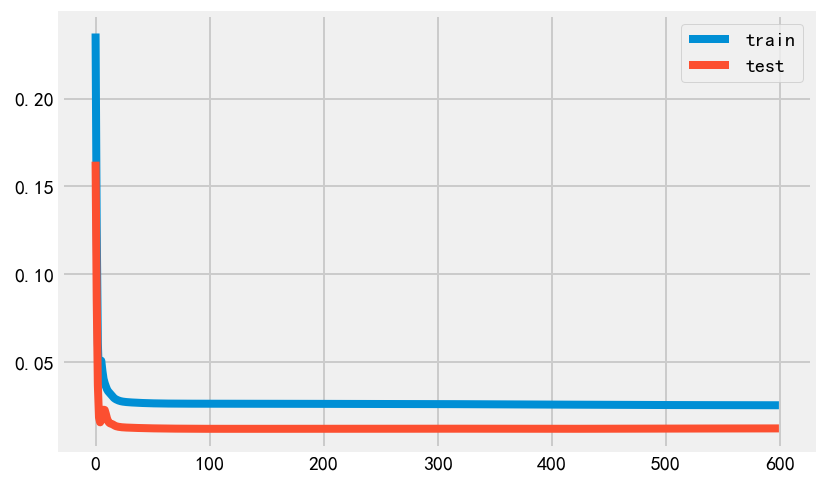

mean_squared_error: 0.00046012583
mean_absolute_error: 0.0145449415
r2_score: -0.04556450232072273
Test RMSE: 0.021


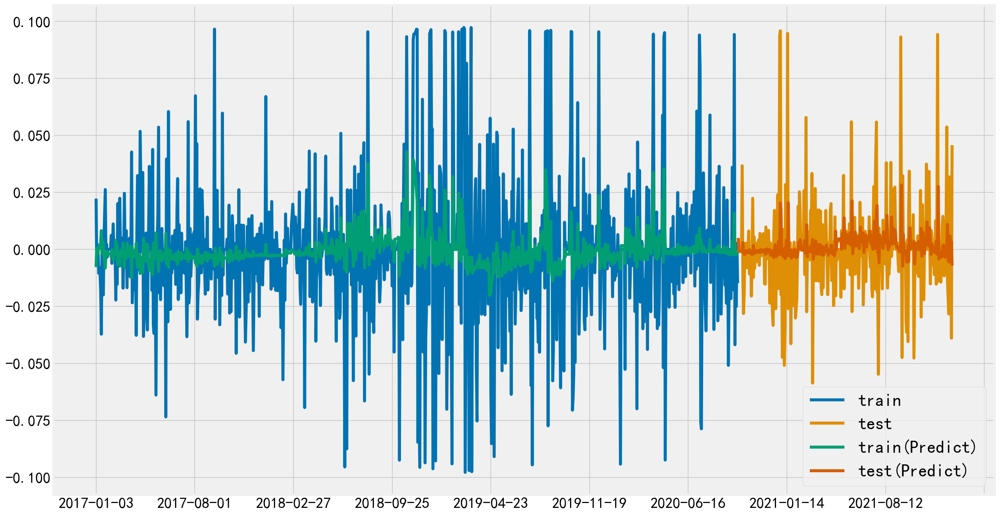

In [594]:
stock1_pdt2 = diff_predict(stock1_pct,stock1_in,data_market,600)

   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
3   0.476233   0.952654   0.938859   0.247413        0.0   0.393387   
4   0.541353   0.964132   0.953666   0.256944        0.0   0.406845   
5   0.468415   0.961263   0.949959   0.254539        0.0   0.403480   
6   0.676590   1.000000   1.000000   0.286674        0.0   0.448901   
7   0.393047   0.981349   0.975906   0.271196        0.0   0.427031   

   var7(t-1)  var8(t-1)  var9(t-1)  var10(t-1)  var11(t-1)   var1(t)  
3   0.853396   0.521279   0.786894    0.251485    0.134206  0.541353  
4   0.853396   0.521279   0.786894    0.251485    0.134206  0.468415  
5   0.853396   0.521279   0.786894    0.251485    0.134206  0.676590  
6   0.853396   0.521279   0.786894    0.251485    0.134206  0.393047  
7   0.853396   0.521279   0.786894    0.251485    0.134206  0.392304  
(976, 1, 11) (976,) (326, 1, 11) (326,)
Epoch 1/800
20/20 - 2s - loss: 0.0657 - val_loss: 0.0184 - 2s/epoch - 102ms/step
Epoch 2/800
20/20 - 0s - l

20/20 - 0s - loss: 0.0126 - val_loss: 0.0147 - 330ms/epoch - 17ms/step
Epoch 89/800
20/20 - 0s - loss: 0.0126 - val_loss: 0.0147 - 320ms/epoch - 16ms/step
Epoch 90/800
20/20 - 0s - loss: 0.0126 - val_loss: 0.0147 - 326ms/epoch - 16ms/step
Epoch 91/800
20/20 - 0s - loss: 0.0126 - val_loss: 0.0147 - 335ms/epoch - 17ms/step
Epoch 92/800
20/20 - 0s - loss: 0.0126 - val_loss: 0.0147 - 321ms/epoch - 16ms/step
Epoch 93/800
20/20 - 0s - loss: 0.0126 - val_loss: 0.0147 - 323ms/epoch - 16ms/step
Epoch 94/800
20/20 - 0s - loss: 0.0126 - val_loss: 0.0147 - 325ms/epoch - 16ms/step
Epoch 95/800
20/20 - 0s - loss: 0.0126 - val_loss: 0.0147 - 327ms/epoch - 16ms/step
Epoch 96/800
20/20 - 0s - loss: 0.0126 - val_loss: 0.0147 - 320ms/epoch - 16ms/step
Epoch 97/800
20/20 - 0s - loss: 0.0126 - val_loss: 0.0147 - 318ms/epoch - 16ms/step
Epoch 98/800
20/20 - 0s - loss: 0.0126 - val_loss: 0.0147 - 322ms/epoch - 16ms/step
Epoch 99/800
20/20 - 0s - loss: 0.0126 - val_loss: 0.0147 - 320ms/epoch - 16ms/step
Epoch

Epoch 185/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0145 - 344ms/epoch - 17ms/step
Epoch 186/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0145 - 335ms/epoch - 17ms/step
Epoch 187/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0145 - 345ms/epoch - 17ms/step
Epoch 188/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0145 - 350ms/epoch - 17ms/step
Epoch 189/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0145 - 353ms/epoch - 18ms/step
Epoch 190/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0145 - 348ms/epoch - 17ms/step
Epoch 191/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0145 - 344ms/epoch - 17ms/step
Epoch 192/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0145 - 344ms/epoch - 17ms/step
Epoch 193/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0145 - 350ms/epoch - 18ms/step
Epoch 194/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0145 - 322ms/epoch - 16ms/step
Epoch 195/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0145 - 342ms/epoch - 17ms/step
Epoch 196/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0145 - 342m

Epoch 282/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0146 - 329ms/epoch - 16ms/step
Epoch 283/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0146 - 320ms/epoch - 16ms/step
Epoch 284/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0146 - 328ms/epoch - 16ms/step
Epoch 285/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0146 - 328ms/epoch - 16ms/step
Epoch 286/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0146 - 321ms/epoch - 16ms/step
Epoch 287/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0146 - 319ms/epoch - 16ms/step
Epoch 288/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0146 - 319ms/epoch - 16ms/step
Epoch 289/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0146 - 326ms/epoch - 16ms/step
Epoch 290/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0146 - 320ms/epoch - 16ms/step
Epoch 291/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0146 - 318ms/epoch - 16ms/step
Epoch 292/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0146 - 319ms/epoch - 16ms/step
Epoch 293/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0146 - 330m

Epoch 379/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0147 - 330ms/epoch - 17ms/step
Epoch 380/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0146 - 327ms/epoch - 16ms/step
Epoch 381/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0147 - 333ms/epoch - 17ms/step
Epoch 382/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0146 - 343ms/epoch - 17ms/step
Epoch 383/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0147 - 353ms/epoch - 18ms/step
Epoch 384/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0146 - 328ms/epoch - 16ms/step
Epoch 385/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0147 - 324ms/epoch - 16ms/step
Epoch 386/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0146 - 319ms/epoch - 16ms/step
Epoch 387/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0147 - 341ms/epoch - 17ms/step
Epoch 388/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0146 - 385ms/epoch - 19ms/step
Epoch 389/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0147 - 360ms/epoch - 18ms/step
Epoch 390/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0146 - 338m

Epoch 476/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0146 - 340ms/epoch - 17ms/step
Epoch 477/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0147 - 363ms/epoch - 18ms/step
Epoch 478/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0146 - 330ms/epoch - 17ms/step
Epoch 479/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0147 - 328ms/epoch - 16ms/step
Epoch 480/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0147 - 329ms/epoch - 16ms/step
Epoch 481/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0147 - 318ms/epoch - 16ms/step
Epoch 482/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0147 - 348ms/epoch - 17ms/step
Epoch 483/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0147 - 344ms/epoch - 17ms/step
Epoch 484/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0147 - 320ms/epoch - 16ms/step
Epoch 485/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0147 - 320ms/epoch - 16ms/step
Epoch 486/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0147 - 323ms/epoch - 16ms/step
Epoch 487/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0147 - 338m

Epoch 573/800
20/20 - 0s - loss: 0.0118 - val_loss: 0.0148 - 335ms/epoch - 17ms/step
Epoch 574/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0148 - 336ms/epoch - 17ms/step
Epoch 575/800
20/20 - 0s - loss: 0.0118 - val_loss: 0.0148 - 338ms/epoch - 17ms/step
Epoch 576/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0148 - 340ms/epoch - 17ms/step
Epoch 577/800
20/20 - 0s - loss: 0.0118 - val_loss: 0.0149 - 319ms/epoch - 16ms/step
Epoch 578/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0148 - 320ms/epoch - 16ms/step
Epoch 579/800
20/20 - 0s - loss: 0.0118 - val_loss: 0.0149 - 329ms/epoch - 16ms/step
Epoch 580/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0148 - 325ms/epoch - 16ms/step
Epoch 581/800
20/20 - 0s - loss: 0.0118 - val_loss: 0.0149 - 364ms/epoch - 18ms/step
Epoch 582/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0148 - 324ms/epoch - 16ms/step
Epoch 583/800
20/20 - 0s - loss: 0.0118 - val_loss: 0.0149 - 314ms/epoch - 16ms/step
Epoch 584/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0149 - 324m

Epoch 670/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0152 - 322ms/epoch - 16ms/step
Epoch 671/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0151 - 335ms/epoch - 17ms/step
Epoch 672/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0152 - 325ms/epoch - 16ms/step
Epoch 673/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0152 - 324ms/epoch - 16ms/step
Epoch 674/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0152 - 335ms/epoch - 17ms/step
Epoch 675/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0152 - 318ms/epoch - 16ms/step
Epoch 676/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0152 - 353ms/epoch - 18ms/step
Epoch 677/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0152 - 334ms/epoch - 17ms/step
Epoch 678/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0152 - 326ms/epoch - 16ms/step
Epoch 679/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0152 - 337ms/epoch - 17ms/step
Epoch 680/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0152 - 323ms/epoch - 16ms/step
Epoch 681/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0152 - 324m

Epoch 767/800
20/20 - 0s - loss: 0.0116 - val_loss: 0.0154 - 323ms/epoch - 16ms/step
Epoch 768/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0154 - 324ms/epoch - 16ms/step
Epoch 769/800
20/20 - 0s - loss: 0.0116 - val_loss: 0.0154 - 315ms/epoch - 16ms/step
Epoch 770/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0154 - 323ms/epoch - 16ms/step
Epoch 771/800
20/20 - 0s - loss: 0.0116 - val_loss: 0.0154 - 327ms/epoch - 16ms/step
Epoch 772/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0154 - 317ms/epoch - 16ms/step
Epoch 773/800
20/20 - 0s - loss: 0.0116 - val_loss: 0.0154 - 319ms/epoch - 16ms/step
Epoch 774/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0154 - 321ms/epoch - 16ms/step
Epoch 775/800
20/20 - 0s - loss: 0.0116 - val_loss: 0.0154 - 326ms/epoch - 16ms/step
Epoch 776/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0155 - 326ms/epoch - 16ms/step
Epoch 777/800
20/20 - 0s - loss: 0.0116 - val_loss: 0.0154 - 331ms/epoch - 17ms/step
Epoch 778/800
20/20 - 0s - loss: 0.0117 - val_loss: 0.0155 - 322m

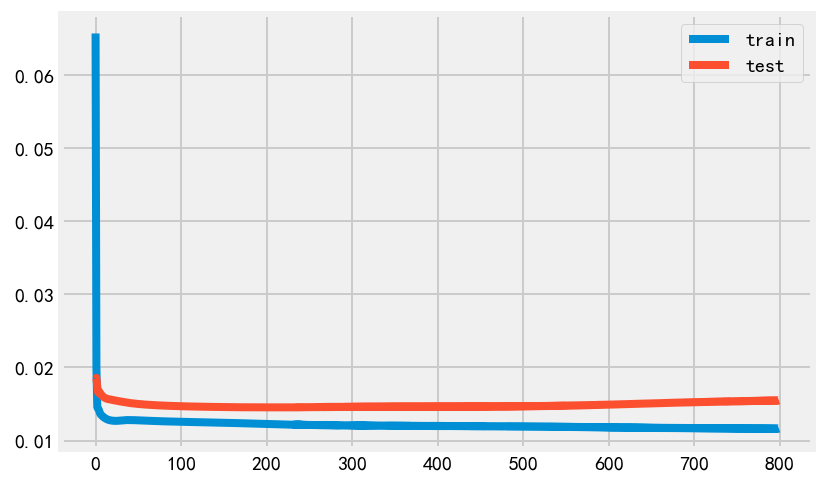

mean_squared_error: 0.0007749825
mean_absolute_error: 0.019425038
r2_score: -0.0769386579708724
Test RMSE: 0.028


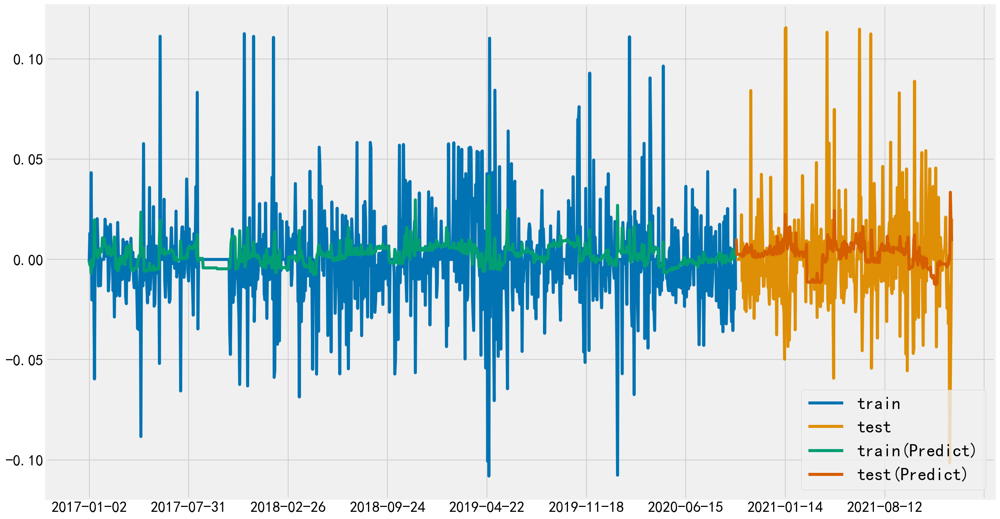

In [614]:
stock2_pdt1 = my_predict(stock2_pct,stock2_in,data_market,800)

(976, 1, 6) (976,) (326, 1, 6) (326,)
Epoch 1/800
20/20 - 2s - loss: 0.1002 - val_loss: 0.0270 - 2s/epoch - 106ms/step
Epoch 2/800
20/20 - 0s - loss: 0.0250 - val_loss: 0.0288 - 311ms/epoch - 16ms/step
Epoch 3/800
20/20 - 0s - loss: 0.0203 - val_loss: 0.0275 - 322ms/epoch - 16ms/step
Epoch 4/800
20/20 - 0s - loss: 0.0174 - val_loss: 0.0237 - 318ms/epoch - 16ms/step
Epoch 5/800
20/20 - 0s - loss: 0.0163 - val_loss: 0.0219 - 315ms/epoch - 16ms/step
Epoch 6/800
20/20 - 0s - loss: 0.0151 - val_loss: 0.0204 - 316ms/epoch - 16ms/step
Epoch 7/800
20/20 - 0s - loss: 0.0145 - val_loss: 0.0189 - 315ms/epoch - 16ms/step
Epoch 8/800
20/20 - 0s - loss: 0.0140 - val_loss: 0.0179 - 316ms/epoch - 16ms/step
Epoch 9/800
20/20 - 0s - loss: 0.0136 - val_loss: 0.0171 - 316ms/epoch - 16ms/step
Epoch 10/800
20/20 - 0s - loss: 0.0133 - val_loss: 0.0164 - 316ms/epoch - 16ms/step
Epoch 11/800
20/20 - 0s - loss: 0.0131 - val_loss: 0.0160 - 313ms/epoch - 16ms/step
Epoch 12/800
20/20 - 0s - loss: 0.0130 - val_loss

Epoch 99/800
20/20 - 0s - loss: 0.0125 - val_loss: 0.0143 - 309ms/epoch - 15ms/step
Epoch 100/800
20/20 - 0s - loss: 0.0125 - val_loss: 0.0143 - 325ms/epoch - 16ms/step
Epoch 101/800
20/20 - 0s - loss: 0.0125 - val_loss: 0.0143 - 325ms/epoch - 16ms/step
Epoch 102/800
20/20 - 0s - loss: 0.0125 - val_loss: 0.0143 - 311ms/epoch - 16ms/step
Epoch 103/800
20/20 - 0s - loss: 0.0125 - val_loss: 0.0143 - 311ms/epoch - 16ms/step
Epoch 104/800
20/20 - 0s - loss: 0.0125 - val_loss: 0.0143 - 319ms/epoch - 16ms/step
Epoch 105/800
20/20 - 0s - loss: 0.0125 - val_loss: 0.0143 - 309ms/epoch - 15ms/step
Epoch 106/800
20/20 - 0s - loss: 0.0125 - val_loss: 0.0143 - 317ms/epoch - 16ms/step
Epoch 107/800
20/20 - 0s - loss: 0.0125 - val_loss: 0.0143 - 316ms/epoch - 16ms/step
Epoch 108/800
20/20 - 0s - loss: 0.0125 - val_loss: 0.0143 - 317ms/epoch - 16ms/step
Epoch 109/800
20/20 - 0s - loss: 0.0125 - val_loss: 0.0143 - 327ms/epoch - 16ms/step
Epoch 110/800
20/20 - 0s - loss: 0.0125 - val_loss: 0.0143 - 314ms

Epoch 196/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0143 - 335ms/epoch - 17ms/step
Epoch 197/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0143 - 344ms/epoch - 17ms/step
Epoch 198/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0143 - 329ms/epoch - 16ms/step
Epoch 199/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0143 - 317ms/epoch - 16ms/step
Epoch 200/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0143 - 324ms/epoch - 16ms/step
Epoch 201/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0143 - 327ms/epoch - 16ms/step
Epoch 202/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0143 - 314ms/epoch - 16ms/step
Epoch 203/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0143 - 323ms/epoch - 16ms/step
Epoch 204/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0143 - 322ms/epoch - 16ms/step
Epoch 205/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0143 - 320ms/epoch - 16ms/step
Epoch 206/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0143 - 314ms/epoch - 16ms/step
Epoch 207/800
20/20 - 0s - loss: 0.0123 - val_loss: 0.0143 - 332m

Epoch 293/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 310ms/epoch - 16ms/step
Epoch 294/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 317ms/epoch - 16ms/step
Epoch 295/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 313ms/epoch - 16ms/step
Epoch 296/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 323ms/epoch - 16ms/step
Epoch 297/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 315ms/epoch - 16ms/step
Epoch 298/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 334ms/epoch - 17ms/step
Epoch 299/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 313ms/epoch - 16ms/step
Epoch 300/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 320ms/epoch - 16ms/step
Epoch 301/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 335ms/epoch - 17ms/step
Epoch 302/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 326ms/epoch - 16ms/step
Epoch 303/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 319ms/epoch - 16ms/step
Epoch 304/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 315m

Epoch 390/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0143 - 317ms/epoch - 16ms/step
Epoch 391/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 316ms/epoch - 16ms/step
Epoch 392/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0143 - 314ms/epoch - 16ms/step
Epoch 393/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 336ms/epoch - 17ms/step
Epoch 394/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0143 - 321ms/epoch - 16ms/step
Epoch 395/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 319ms/epoch - 16ms/step
Epoch 396/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0143 - 330ms/epoch - 16ms/step
Epoch 397/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 315ms/epoch - 16ms/step
Epoch 398/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0143 - 314ms/epoch - 16ms/step
Epoch 399/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 320ms/epoch - 16ms/step
Epoch 400/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0143 - 324ms/epoch - 16ms/step
Epoch 401/800
20/20 - 0s - loss: 0.0122 - val_loss: 0.0143 - 322m

Epoch 487/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0143 - 317ms/epoch - 16ms/step
Epoch 488/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0143 - 319ms/epoch - 16ms/step
Epoch 489/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0144 - 330ms/epoch - 17ms/step
Epoch 490/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0143 - 319ms/epoch - 16ms/step
Epoch 491/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0144 - 319ms/epoch - 16ms/step
Epoch 492/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0143 - 316ms/epoch - 16ms/step
Epoch 493/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0144 - 352ms/epoch - 18ms/step
Epoch 494/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0143 - 343ms/epoch - 17ms/step
Epoch 495/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0144 - 350ms/epoch - 18ms/step
Epoch 496/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0143 - 331ms/epoch - 17ms/step
Epoch 497/800
20/20 - 0s - loss: 0.0121 - val_loss: 0.0144 - 325ms/epoch - 16ms/step
Epoch 498/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0143 - 321m

Epoch 584/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0145 - 316ms/epoch - 16ms/step
Epoch 585/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0145 - 318ms/epoch - 16ms/step
Epoch 586/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0145 - 313ms/epoch - 16ms/step
Epoch 587/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0145 - 317ms/epoch - 16ms/step
Epoch 588/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0145 - 322ms/epoch - 16ms/step
Epoch 589/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0145 - 309ms/epoch - 15ms/step
Epoch 590/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0145 - 315ms/epoch - 16ms/step
Epoch 591/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0145 - 322ms/epoch - 16ms/step
Epoch 592/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0145 - 321ms/epoch - 16ms/step
Epoch 593/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0145 - 318ms/epoch - 16ms/step
Epoch 594/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0145 - 316ms/epoch - 16ms/step
Epoch 595/800
20/20 - 0s - loss: 0.0120 - val_loss: 0.0145 - 314m

Epoch 681/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0147 - 330ms/epoch - 17ms/step
Epoch 682/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0146 - 314ms/epoch - 16ms/step
Epoch 683/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0147 - 325ms/epoch - 16ms/step
Epoch 684/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0146 - 321ms/epoch - 16ms/step
Epoch 685/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0147 - 312ms/epoch - 16ms/step
Epoch 686/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0146 - 343ms/epoch - 17ms/step
Epoch 687/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0147 - 354ms/epoch - 18ms/step
Epoch 688/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0146 - 364ms/epoch - 18ms/step
Epoch 689/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0147 - 344ms/epoch - 17ms/step
Epoch 690/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0147 - 333ms/epoch - 17ms/step
Epoch 691/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0147 - 318ms/epoch - 16ms/step
Epoch 692/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0147 - 319m

Epoch 778/800
20/20 - 0s - loss: 0.0118 - val_loss: 0.0148 - 320ms/epoch - 16ms/step
Epoch 779/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0149 - 325ms/epoch - 16ms/step
Epoch 780/800
20/20 - 0s - loss: 0.0118 - val_loss: 0.0148 - 334ms/epoch - 17ms/step
Epoch 781/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0149 - 327ms/epoch - 16ms/step
Epoch 782/800
20/20 - 0s - loss: 0.0118 - val_loss: 0.0148 - 328ms/epoch - 16ms/step
Epoch 783/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0149 - 328ms/epoch - 16ms/step
Epoch 784/800
20/20 - 0s - loss: 0.0118 - val_loss: 0.0148 - 323ms/epoch - 16ms/step
Epoch 785/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0149 - 322ms/epoch - 16ms/step
Epoch 786/800
20/20 - 0s - loss: 0.0118 - val_loss: 0.0148 - 328ms/epoch - 16ms/step
Epoch 787/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0149 - 317ms/epoch - 16ms/step
Epoch 788/800
20/20 - 0s - loss: 0.0118 - val_loss: 0.0148 - 321ms/epoch - 16ms/step
Epoch 789/800
20/20 - 0s - loss: 0.0119 - val_loss: 0.0149 - 311m

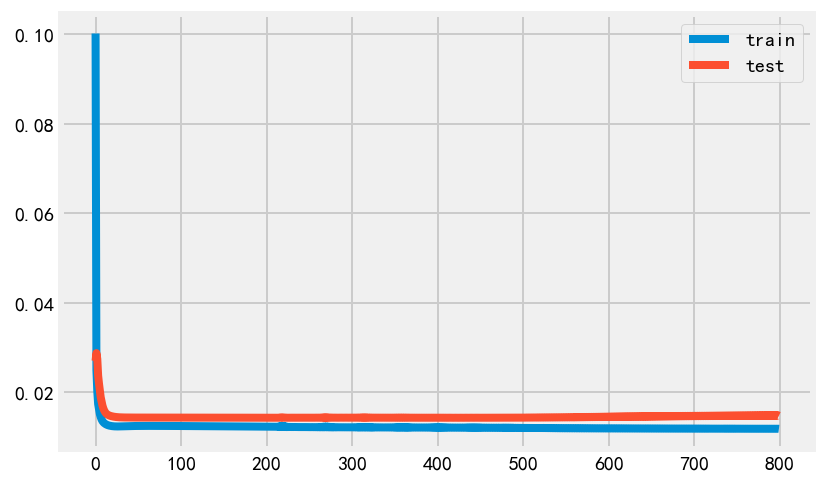

mean_squared_error: 0.00073944574
mean_absolute_error: 0.018401816
r2_score: -0.027555767533977482
Test RMSE: 0.027


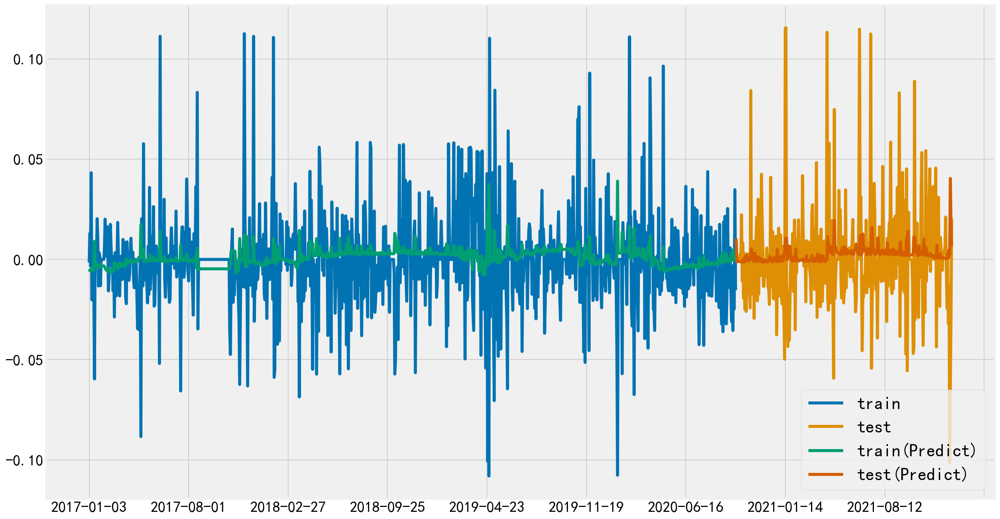

In [615]:
stock2_pdt2 = diff_predict(stock2_pct,stock2_in,data_market,800)

   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
3   0.441456   0.906463   0.819762   1.000000   0.287390   0.585934   
4   0.397375   0.896888   0.807458   0.986491   0.290323   0.576919   
5   0.283746   0.855395   0.754077   0.927971   0.322581   0.537853   
6   0.366953   0.838160   0.731913   0.903664   0.341642   0.521625   
7   0.467010   0.847735   0.744244   0.917172   0.332845   0.530640   

   var7(t-1)  var8(t-1)  var9(t-1)  var10(t-1)  var11(t-1)   var1(t)  
3   0.853396   0.521279   0.786894    0.251485    0.134206  0.397375  
4   0.853396   0.521279   0.786894    0.251485    0.134206  0.283746  
5   0.853396   0.521279   0.786894    0.251485    0.134206  0.366953  
6   0.853396   0.521279   0.786894    0.251485    0.134206  0.467010  
7   0.853396   0.521279   0.786894    0.251485    0.134206  0.387170  
(976, 1, 11) (976,) (326, 1, 11) (326,)
Epoch 1/700
4/4 - 2s - loss: 0.1441 - val_loss: 0.0648 - 2s/epoch - 460ms/step
Epoch 2/700
4/4 - 0s - loss:

4/4 - 0s - loss: 0.0079 - val_loss: 0.0121 - 103ms/epoch - 26ms/step
Epoch 91/700
4/4 - 0s - loss: 0.0079 - val_loss: 0.0121 - 103ms/epoch - 26ms/step
Epoch 92/700
4/4 - 0s - loss: 0.0079 - val_loss: 0.0121 - 103ms/epoch - 26ms/step
Epoch 93/700
4/4 - 0s - loss: 0.0079 - val_loss: 0.0121 - 102ms/epoch - 26ms/step
Epoch 94/700
4/4 - 0s - loss: 0.0079 - val_loss: 0.0121 - 104ms/epoch - 26ms/step
Epoch 95/700
4/4 - 0s - loss: 0.0079 - val_loss: 0.0120 - 101ms/epoch - 25ms/step
Epoch 96/700
4/4 - 0s - loss: 0.0079 - val_loss: 0.0120 - 102ms/epoch - 26ms/step
Epoch 97/700
4/4 - 0s - loss: 0.0079 - val_loss: 0.0120 - 104ms/epoch - 26ms/step
Epoch 98/700
4/4 - 0s - loss: 0.0079 - val_loss: 0.0120 - 102ms/epoch - 26ms/step
Epoch 99/700
4/4 - 0s - loss: 0.0079 - val_loss: 0.0120 - 102ms/epoch - 26ms/step
Epoch 100/700
4/4 - 0s - loss: 0.0079 - val_loss: 0.0120 - 104ms/epoch - 26ms/step
Epoch 101/700
4/4 - 0s - loss: 0.0079 - val_loss: 0.0120 - 102ms/epoch - 26ms/step
Epoch 102/700
4/4 - 0s - lo

Epoch 189/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0115 - 102ms/epoch - 26ms/step
Epoch 190/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0115 - 104ms/epoch - 26ms/step
Epoch 191/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0115 - 103ms/epoch - 26ms/step
Epoch 192/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0115 - 100ms/epoch - 25ms/step
Epoch 193/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0115 - 103ms/epoch - 26ms/step
Epoch 194/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0115 - 102ms/epoch - 26ms/step
Epoch 195/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0115 - 102ms/epoch - 26ms/step
Epoch 196/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0115 - 106ms/epoch - 27ms/step
Epoch 197/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0115 - 107ms/epoch - 27ms/step
Epoch 198/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0115 - 102ms/epoch - 26ms/step
Epoch 199/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0115 - 101ms/epoch - 25ms/step
Epoch 200/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0115 - 103ms/epoch - 26ms/step
Epoc

Epoch 288/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0119 - 103ms/epoch - 26ms/step
Epoch 289/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0119 - 103ms/epoch - 26ms/step
Epoch 290/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0119 - 107ms/epoch - 27ms/step
Epoch 291/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0119 - 105ms/epoch - 26ms/step
Epoch 292/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0119 - 102ms/epoch - 26ms/step
Epoch 293/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0119 - 102ms/epoch - 26ms/step
Epoch 294/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0120 - 104ms/epoch - 26ms/step
Epoch 295/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0120 - 103ms/epoch - 26ms/step
Epoch 296/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0120 - 104ms/epoch - 26ms/step
Epoch 297/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0120 - 101ms/epoch - 25ms/step
Epoch 298/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0120 - 102ms/epoch - 26ms/step
Epoch 299/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0120 - 104ms/epoch - 26ms/step
Epoc

Epoch 387/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 103ms/epoch - 26ms/step
Epoch 388/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 103ms/epoch - 26ms/step
Epoch 389/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 104ms/epoch - 26ms/step
Epoch 390/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 105ms/epoch - 26ms/step
Epoch 391/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 104ms/epoch - 26ms/step
Epoch 392/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 102ms/epoch - 26ms/step
Epoch 393/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 103ms/epoch - 26ms/step
Epoch 394/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0127 - 104ms/epoch - 26ms/step
Epoch 395/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0127 - 102ms/epoch - 26ms/step
Epoch 396/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0127 - 103ms/epoch - 26ms/step
Epoch 397/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0127 - 105ms/epoch - 26ms/step
Epoch 398/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0127 - 108ms/epoch - 27ms/step
Epoc

Epoch 486/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0131 - 106ms/epoch - 27ms/step
Epoch 487/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0131 - 103ms/epoch - 26ms/step
Epoch 488/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0132 - 109ms/epoch - 27ms/step
Epoch 489/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0132 - 106ms/epoch - 27ms/step
Epoch 490/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0132 - 106ms/epoch - 27ms/step
Epoch 491/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0132 - 108ms/epoch - 27ms/step
Epoch 492/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0132 - 107ms/epoch - 27ms/step
Epoch 493/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0132 - 103ms/epoch - 26ms/step
Epoch 494/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0132 - 104ms/epoch - 26ms/step
Epoch 495/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0132 - 107ms/epoch - 27ms/step
Epoch 496/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0132 - 107ms/epoch - 27ms/step
Epoch 497/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0132 - 105ms/epoch - 26ms/step
Epoc

Epoch 585/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0135 - 101ms/epoch - 25ms/step
Epoch 586/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0135 - 103ms/epoch - 26ms/step
Epoch 587/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0135 - 102ms/epoch - 26ms/step
Epoch 588/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0135 - 104ms/epoch - 26ms/step
Epoch 589/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0135 - 101ms/epoch - 25ms/step
Epoch 590/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0135 - 100ms/epoch - 25ms/step
Epoch 591/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0135 - 102ms/epoch - 26ms/step
Epoch 592/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0136 - 101ms/epoch - 25ms/step
Epoch 593/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0136 - 105ms/epoch - 26ms/step
Epoch 594/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0136 - 103ms/epoch - 26ms/step
Epoch 595/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0136 - 104ms/epoch - 26ms/step
Epoch 596/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0136 - 105ms/epoch - 26ms/step
Epoc

Epoch 684/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0137 - 101ms/epoch - 25ms/step
Epoch 685/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0137 - 103ms/epoch - 26ms/step
Epoch 686/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0137 - 107ms/epoch - 27ms/step
Epoch 687/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0137 - 101ms/epoch - 25ms/step
Epoch 688/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0137 - 102ms/epoch - 26ms/step
Epoch 689/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0137 - 110ms/epoch - 28ms/step
Epoch 690/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0137 - 116ms/epoch - 29ms/step
Epoch 691/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0137 - 105ms/epoch - 26ms/step
Epoch 692/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0137 - 102ms/epoch - 26ms/step
Epoch 693/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0138 - 103ms/epoch - 26ms/step
Epoch 694/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0138 - 107ms/epoch - 27ms/step
Epoch 695/700
4/4 - 0s - loss: 0.0074 - val_loss: 0.0138 - 103ms/epoch - 26ms/step
Epoc

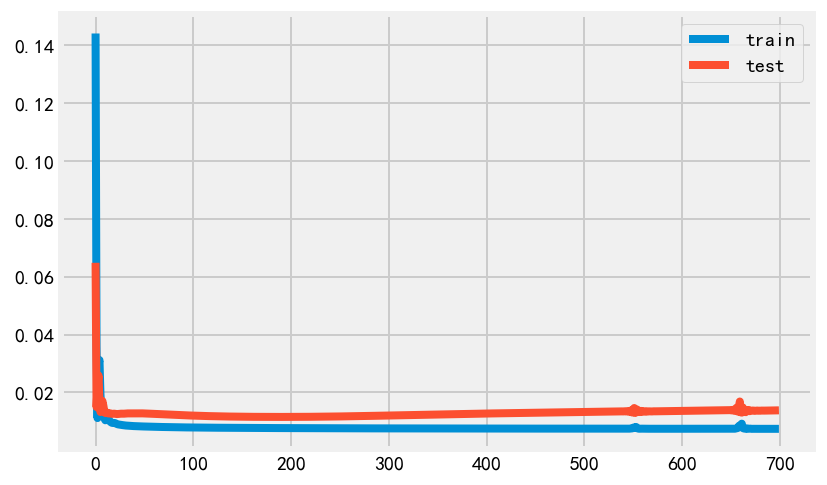

mean_squared_error: 0.0013405231
mean_absolute_error: 0.02713366
r2_score: -0.2449011091651827
Test RMSE: 0.037


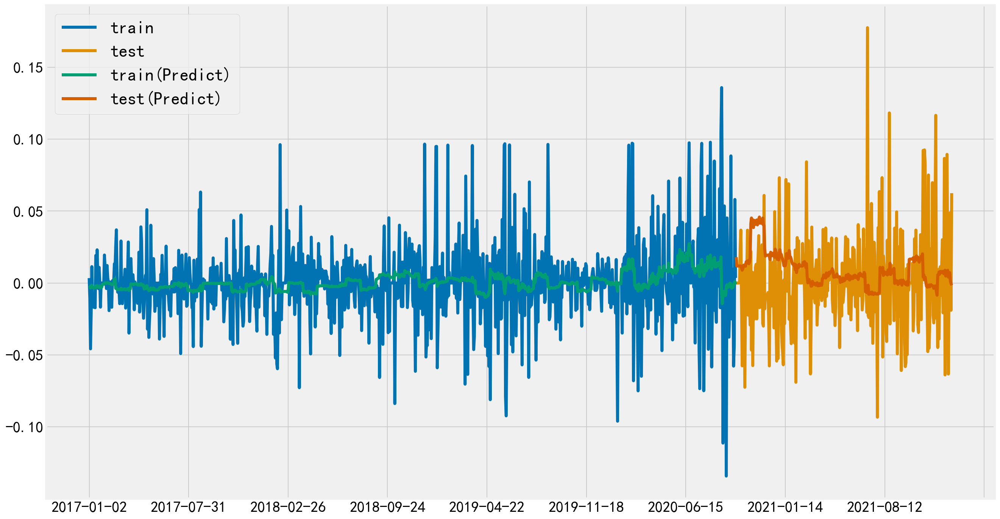

In [632]:
stock3_pdt1 = my_predict(stock3_pct,stock3_in,data_market,700)

(976, 1, 6) (976,) (326, 1, 6) (326,)
Epoch 1/700
4/4 - 2s - loss: 0.1713 - val_loss: 0.1232 - 2s/epoch - 463ms/step
Epoch 2/700
4/4 - 0s - loss: 0.0926 - val_loss: 0.0638 - 100ms/epoch - 25ms/step
Epoch 3/700
4/4 - 0s - loss: 0.0418 - val_loss: 0.0282 - 100ms/epoch - 25ms/step
Epoch 4/700
4/4 - 0s - loss: 0.0182 - val_loss: 0.0155 - 100ms/epoch - 25ms/step
Epoch 5/700
4/4 - 0s - loss: 0.0178 - val_loss: 0.0161 - 103ms/epoch - 26ms/step
Epoch 6/700
4/4 - 0s - loss: 0.0256 - val_loss: 0.0170 - 104ms/epoch - 26ms/step
Epoch 7/700
4/4 - 0s - loss: 0.0271 - val_loss: 0.0152 - 104ms/epoch - 26ms/step
Epoch 8/700
4/4 - 0s - loss: 0.0226 - val_loss: 0.0142 - 101ms/epoch - 25ms/step
Epoch 9/700
4/4 - 0s - loss: 0.0179 - val_loss: 0.0151 - 99ms/epoch - 25ms/step
Epoch 10/700
4/4 - 0s - loss: 0.0154 - val_loss: 0.0167 - 105ms/epoch - 26ms/step
Epoch 11/700
4/4 - 0s - loss: 0.0144 - val_loss: 0.0174 - 102ms/epoch - 26ms/step
Epoch 12/700
4/4 - 0s - loss: 0.0137 - val_loss: 0.0169 - 104ms/epoch - 

Epoch 101/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0117 - 100ms/epoch - 25ms/step
Epoch 102/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0117 - 102ms/epoch - 26ms/step
Epoch 103/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0117 - 100ms/epoch - 25ms/step
Epoch 104/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0117 - 102ms/epoch - 26ms/step
Epoch 105/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0117 - 102ms/epoch - 26ms/step
Epoch 106/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0116 - 99ms/epoch - 25ms/step
Epoch 107/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0116 - 102ms/epoch - 26ms/step
Epoch 108/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0116 - 100ms/epoch - 25ms/step
Epoch 109/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0116 - 100ms/epoch - 25ms/step
Epoch 110/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0116 - 106ms/epoch - 27ms/step
Epoch 111/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0116 - 106ms/epoch - 27ms/step
Epoch 112/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0116 - 101ms/epoch - 25ms/step
Epoch

Epoch 200/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 102ms/epoch - 26ms/step
Epoch 201/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 100ms/epoch - 25ms/step
Epoch 202/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 101ms/epoch - 25ms/step
Epoch 203/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 104ms/epoch - 26ms/step
Epoch 204/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 99ms/epoch - 25ms/step
Epoch 205/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 103ms/epoch - 26ms/step
Epoch 206/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 102ms/epoch - 26ms/step
Epoch 207/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 100ms/epoch - 25ms/step
Epoch 208/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 103ms/epoch - 26ms/step
Epoch 209/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 101ms/epoch - 25ms/step
Epoch 210/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 99ms/epoch - 25ms/step
Epoch 211/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 102ms/epoch - 26ms/step
Epoch 

Epoch 299/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 104ms/epoch - 26ms/step
Epoch 300/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 100ms/epoch - 25ms/step
Epoch 301/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 102ms/epoch - 26ms/step
Epoch 302/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 102ms/epoch - 26ms/step
Epoch 303/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 100ms/epoch - 25ms/step
Epoch 304/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 100ms/epoch - 25ms/step
Epoch 305/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 101ms/epoch - 25ms/step
Epoch 306/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 100ms/epoch - 25ms/step
Epoch 307/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 103ms/epoch - 26ms/step
Epoch 308/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 101ms/epoch - 25ms/step
Epoch 309/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 99ms/epoch - 25ms/step
Epoch 310/700
4/4 - 0s - loss: 0.0077 - val_loss: 0.0114 - 101ms/epoch - 25ms/step
Epoch

Epoch 398/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0115 - 101ms/epoch - 25ms/step
Epoch 399/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0115 - 100ms/epoch - 25ms/step
Epoch 400/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0115 - 102ms/epoch - 26ms/step
Epoch 401/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0115 - 100ms/epoch - 25ms/step
Epoch 402/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0115 - 106ms/epoch - 27ms/step
Epoch 403/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0115 - 106ms/epoch - 27ms/step
Epoch 404/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0115 - 100ms/epoch - 25ms/step
Epoch 405/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0115 - 101ms/epoch - 25ms/step
Epoch 406/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0115 - 100ms/epoch - 25ms/step
Epoch 407/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0115 - 104ms/epoch - 26ms/step
Epoch 408/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0115 - 110ms/epoch - 28ms/step
Epoch 409/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0115 - 103ms/epoch - 26ms/step
Epoc

Epoch 497/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0119 - 105ms/epoch - 26ms/step
Epoch 498/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0119 - 101ms/epoch - 25ms/step
Epoch 499/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0119 - 102ms/epoch - 26ms/step
Epoch 500/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0119 - 106ms/epoch - 27ms/step
Epoch 501/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0119 - 115ms/epoch - 29ms/step
Epoch 502/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0120 - 107ms/epoch - 27ms/step
Epoch 503/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0120 - 101ms/epoch - 25ms/step
Epoch 504/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0120 - 103ms/epoch - 26ms/step
Epoch 505/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0120 - 101ms/epoch - 25ms/step
Epoch 506/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0120 - 103ms/epoch - 26ms/step
Epoch 507/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0120 - 103ms/epoch - 26ms/step
Epoch 508/700
4/4 - 0s - loss: 0.0076 - val_loss: 0.0120 - 102ms/epoch - 26ms/step
Epoc

Epoch 596/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0125 - 101ms/epoch - 25ms/step
Epoch 597/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 101ms/epoch - 25ms/step
Epoch 598/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 101ms/epoch - 25ms/step
Epoch 599/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0125 - 101ms/epoch - 25ms/step
Epoch 600/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 101ms/epoch - 25ms/step
Epoch 601/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0125 - 101ms/epoch - 25ms/step
Epoch 602/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 102ms/epoch - 26ms/step
Epoch 603/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 101ms/epoch - 25ms/step
Epoch 604/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 101ms/epoch - 25ms/step
Epoch 605/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 101ms/epoch - 25ms/step
Epoch 606/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 102ms/epoch - 26ms/step
Epoch 607/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 100ms/epoch - 25ms/step
Epoc

Epoch 695/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 101ms/epoch - 25ms/step
Epoch 696/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0128 - 102ms/epoch - 26ms/step
Epoch 697/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 103ms/epoch - 26ms/step
Epoch 698/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0128 - 102ms/epoch - 26ms/step
Epoch 699/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0126 - 100ms/epoch - 25ms/step
Epoch 700/700
4/4 - 0s - loss: 0.0075 - val_loss: 0.0129 - 102ms/epoch - 26ms/step


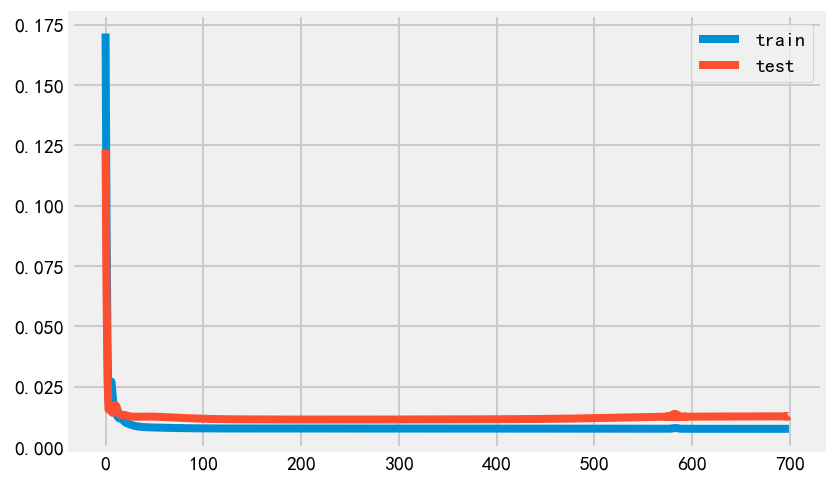

mean_squared_error: 0.0012524049
mean_absolute_error: 0.025310675
r2_score: -0.16306861919027993
Test RMSE: 0.035


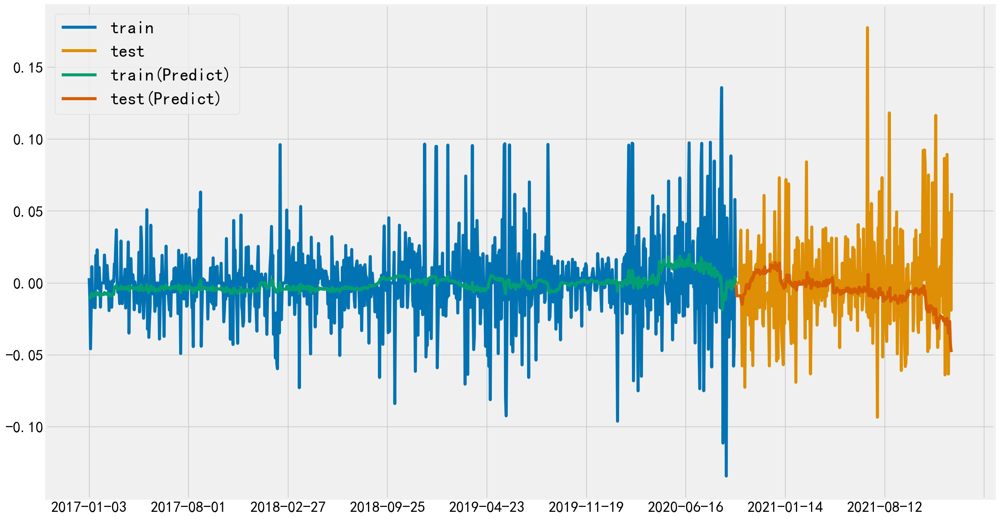

In [633]:
stock3_pdt2 = diff_predict(stock3_pct,stock3_in,data_market,700)

   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
3   0.504506   0.453525   0.986262   0.987075   0.678776   0.986937   
4   0.536625   0.457697   1.000000   1.000000   0.669216   1.000000   
5   0.401382   0.451278   0.978860   0.980043   0.688336   0.979904   
6   0.553029   0.456734   0.996799   0.997001   0.673040   0.996986   
7   0.495414   0.457697   1.000000   1.000000   0.669216   1.000000   

   var7(t-1)  var8(t-1)  var9(t-1)  var10(t-1)  var11(t-1)   var1(t)  
3   0.853396   0.521279   0.786894    0.251485    0.134206  0.536625  
4   0.853396   0.521279   0.786894    0.251485    0.134206  0.401382  
5   0.853396   0.521279   0.786894    0.251485    0.134206  0.553029  
6   0.853396   0.521279   0.786894    0.251485    0.134206  0.495414  
7   0.853396   0.521279   0.786894    0.251485    0.134206  0.284315  
(976, 1, 11) (976,) (326, 1, 11) (326,)
Epoch 1/1500
2/2 - 2s - loss: 0.2052 - val_loss: 0.1270 - 2s/epoch - 988ms/step
Epoch 2/1500
2/2 - 0s - los

2/2 - 0s - loss: 0.0107 - val_loss: 0.0105 - 246ms/epoch - 123ms/step
Epoch 89/1500
2/2 - 0s - loss: 0.0107 - val_loss: 0.0105 - 252ms/epoch - 126ms/step
Epoch 90/1500
2/2 - 0s - loss: 0.0107 - val_loss: 0.0104 - 244ms/epoch - 122ms/step
Epoch 91/1500
2/2 - 0s - loss: 0.0107 - val_loss: 0.0104 - 238ms/epoch - 119ms/step
Epoch 92/1500
2/2 - 0s - loss: 0.0106 - val_loss: 0.0104 - 243ms/epoch - 122ms/step
Epoch 93/1500
2/2 - 0s - loss: 0.0106 - val_loss: 0.0103 - 246ms/epoch - 123ms/step
Epoch 94/1500
2/2 - 0s - loss: 0.0106 - val_loss: 0.0103 - 241ms/epoch - 121ms/step
Epoch 95/1500
2/2 - 0s - loss: 0.0106 - val_loss: 0.0103 - 246ms/epoch - 123ms/step
Epoch 96/1500
2/2 - 0s - loss: 0.0106 - val_loss: 0.0103 - 268ms/epoch - 134ms/step
Epoch 97/1500
2/2 - 0s - loss: 0.0106 - val_loss: 0.0102 - 256ms/epoch - 128ms/step
Epoch 98/1500
2/2 - 0s - loss: 0.0106 - val_loss: 0.0102 - 266ms/epoch - 133ms/step
Epoch 99/1500
2/2 - 0s - loss: 0.0106 - val_loss: 0.0102 - 267ms/epoch - 134ms/step
Epoch 

Epoch 185/1500
2/2 - 0s - loss: 0.0100 - val_loss: 0.0088 - 244ms/epoch - 122ms/step
Epoch 186/1500
2/2 - 0s - loss: 0.0100 - val_loss: 0.0088 - 250ms/epoch - 125ms/step
Epoch 187/1500
2/2 - 0s - loss: 0.0100 - val_loss: 0.0088 - 258ms/epoch - 129ms/step
Epoch 188/1500
2/2 - 0s - loss: 0.0100 - val_loss: 0.0088 - 246ms/epoch - 123ms/step
Epoch 189/1500
2/2 - 0s - loss: 0.0100 - val_loss: 0.0088 - 249ms/epoch - 125ms/step
Epoch 190/1500
2/2 - 0s - loss: 0.0100 - val_loss: 0.0088 - 245ms/epoch - 123ms/step
Epoch 191/1500
2/2 - 0s - loss: 0.0100 - val_loss: 0.0088 - 252ms/epoch - 126ms/step
Epoch 192/1500
2/2 - 0s - loss: 0.0100 - val_loss: 0.0088 - 257ms/epoch - 128ms/step
Epoch 193/1500
2/2 - 0s - loss: 0.0100 - val_loss: 0.0088 - 248ms/epoch - 124ms/step
Epoch 194/1500
2/2 - 0s - loss: 0.0100 - val_loss: 0.0087 - 243ms/epoch - 122ms/step
Epoch 195/1500
2/2 - 0s - loss: 0.0100 - val_loss: 0.0087 - 243ms/epoch - 122ms/step
Epoch 196/1500
2/2 - 0s - loss: 0.0100 - val_loss: 0.0087 - 245ms

Epoch 282/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 245ms/epoch - 123ms/step
Epoch 283/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 252ms/epoch - 126ms/step
Epoch 284/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 251ms/epoch - 126ms/step
Epoch 285/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 259ms/epoch - 130ms/step
Epoch 286/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 249ms/epoch - 125ms/step
Epoch 287/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 250ms/epoch - 125ms/step
Epoch 288/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 249ms/epoch - 125ms/step
Epoch 289/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 250ms/epoch - 125ms/step
Epoch 290/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 249ms/epoch - 125ms/step
Epoch 291/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 260ms/epoch - 130ms/step
Epoch 292/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 253ms/epoch - 127ms/step
Epoch 293/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 258ms

Epoch 379/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 245ms/epoch - 123ms/step
Epoch 380/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 241ms/epoch - 121ms/step
Epoch 381/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 245ms/epoch - 123ms/step
Epoch 382/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 245ms/epoch - 123ms/step
Epoch 383/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 243ms/epoch - 122ms/step
Epoch 384/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 248ms/epoch - 124ms/step
Epoch 385/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 253ms/epoch - 127ms/step
Epoch 386/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 250ms/epoch - 125ms/step
Epoch 387/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 246ms/epoch - 123ms/step
Epoch 388/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 251ms/epoch - 126ms/step
Epoch 389/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 244ms/epoch - 122ms/step
Epoch 390/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 250ms

Epoch 476/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 252ms/epoch - 126ms/step
Epoch 477/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 254ms/epoch - 127ms/step
Epoch 478/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 244ms/epoch - 122ms/step
Epoch 479/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 248ms/epoch - 124ms/step
Epoch 480/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 243ms/epoch - 122ms/step
Epoch 481/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 242ms/epoch - 121ms/step
Epoch 482/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 252ms/epoch - 126ms/step
Epoch 483/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 261ms/epoch - 131ms/step
Epoch 484/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 267ms/epoch - 134ms/step
Epoch 485/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 260ms/epoch - 130ms/step
Epoch 486/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 257ms/epoch - 129ms/step
Epoch 487/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 244ms

Epoch 573/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 252ms/epoch - 126ms/step
Epoch 574/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 264ms/epoch - 132ms/step
Epoch 575/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 253ms/epoch - 127ms/step
Epoch 576/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 243ms/epoch - 122ms/step
Epoch 577/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 254ms/epoch - 127ms/step
Epoch 578/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 249ms/epoch - 125ms/step
Epoch 579/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 262ms/epoch - 131ms/step
Epoch 580/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 249ms/epoch - 125ms/step
Epoch 581/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 251ms/epoch - 126ms/step
Epoch 582/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 243ms/epoch - 122ms/step
Epoch 583/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 259ms/epoch - 130ms/step
Epoch 584/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 251ms

Epoch 670/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 270ms/epoch - 135ms/step
Epoch 671/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 250ms/epoch - 125ms/step
Epoch 672/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 250ms/epoch - 125ms/step
Epoch 673/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 247ms/epoch - 124ms/step
Epoch 674/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 247ms/epoch - 124ms/step
Epoch 675/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 247ms/epoch - 124ms/step
Epoch 676/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 243ms/epoch - 122ms/step
Epoch 677/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0085 - 246ms/epoch - 123ms/step
Epoch 678/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0085 - 261ms/epoch - 131ms/step
Epoch 679/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0085 - 255ms/epoch - 128ms/step
Epoch 680/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0085 - 254ms/epoch - 127ms/step
Epoch 681/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0085 - 258ms

Epoch 767/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 247ms/epoch - 124ms/step
Epoch 768/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 243ms/epoch - 122ms/step
Epoch 769/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 246ms/epoch - 123ms/step
Epoch 770/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 245ms/epoch - 123ms/step
Epoch 771/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 254ms/epoch - 127ms/step
Epoch 772/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 240ms/epoch - 120ms/step
Epoch 773/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 245ms/epoch - 123ms/step
Epoch 774/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 244ms/epoch - 122ms/step
Epoch 775/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 246ms/epoch - 123ms/step
Epoch 776/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 244ms/epoch - 122ms/step
Epoch 777/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 247ms/epoch - 124ms/step
Epoch 778/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 257ms

Epoch 864/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 247ms/epoch - 124ms/step
Epoch 865/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 240ms/epoch - 120ms/step
Epoch 866/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 245ms/epoch - 123ms/step
Epoch 867/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 249ms/epoch - 125ms/step
Epoch 868/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 246ms/epoch - 123ms/step
Epoch 869/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 245ms/epoch - 123ms/step
Epoch 870/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 245ms/epoch - 123ms/step
Epoch 871/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 245ms/epoch - 123ms/step
Epoch 872/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 247ms/epoch - 124ms/step
Epoch 873/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 250ms/epoch - 125ms/step
Epoch 874/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 248ms/epoch - 124ms/step
Epoch 875/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 244ms

Epoch 961/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0086 - 250ms/epoch - 125ms/step
Epoch 962/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0086 - 241ms/epoch - 121ms/step
Epoch 963/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0086 - 242ms/epoch - 121ms/step
Epoch 964/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0086 - 251ms/epoch - 126ms/step
Epoch 965/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0086 - 247ms/epoch - 124ms/step
Epoch 966/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0086 - 242ms/epoch - 121ms/step
Epoch 967/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0086 - 241ms/epoch - 121ms/step
Epoch 968/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0086 - 242ms/epoch - 121ms/step
Epoch 969/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0086 - 245ms/epoch - 123ms/step
Epoch 970/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0086 - 243ms/epoch - 122ms/step
Epoch 971/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0086 - 247ms/epoch - 124ms/step
Epoch 972/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0086 - 240ms

Epoch 1057/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0087 - 249ms/epoch - 125ms/step
Epoch 1058/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0087 - 247ms/epoch - 124ms/step
Epoch 1059/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0087 - 267ms/epoch - 134ms/step
Epoch 1060/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0087 - 252ms/epoch - 126ms/step
Epoch 1061/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0087 - 246ms/epoch - 123ms/step
Epoch 1062/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0087 - 245ms/epoch - 123ms/step
Epoch 1063/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0087 - 251ms/epoch - 126ms/step
Epoch 1064/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0087 - 264ms/epoch - 132ms/step
Epoch 1065/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0087 - 280ms/epoch - 140ms/step
Epoch 1066/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0087 - 260ms/epoch - 130ms/step
Epoch 1067/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0087 - 254ms/epoch - 127ms/step
Epoch 1068/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.

Epoch 1153/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0089 - 249ms/epoch - 125ms/step
Epoch 1154/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0089 - 252ms/epoch - 126ms/step
Epoch 1155/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0089 - 250ms/epoch - 125ms/step
Epoch 1156/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0089 - 246ms/epoch - 123ms/step
Epoch 1157/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0089 - 247ms/epoch - 124ms/step
Epoch 1158/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0089 - 245ms/epoch - 123ms/step
Epoch 1159/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0089 - 255ms/epoch - 128ms/step
Epoch 1160/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0089 - 255ms/epoch - 127ms/step
Epoch 1161/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0089 - 248ms/epoch - 124ms/step
Epoch 1162/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0089 - 248ms/epoch - 124ms/step
Epoch 1163/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0089 - 251ms/epoch - 126ms/step
Epoch 1164/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.

Epoch 1249/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0092 - 242ms/epoch - 121ms/step
Epoch 1250/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0092 - 243ms/epoch - 122ms/step
Epoch 1251/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0092 - 242ms/epoch - 121ms/step
Epoch 1252/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0092 - 252ms/epoch - 126ms/step
Epoch 1253/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0092 - 256ms/epoch - 128ms/step
Epoch 1254/1500
2/2 - 0s - loss: 0.0096 - val_loss: 0.0092 - 245ms/epoch - 122ms/step
Epoch 1255/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0092 - 248ms/epoch - 124ms/step
Epoch 1256/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0092 - 254ms/epoch - 127ms/step
Epoch 1257/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0092 - 251ms/epoch - 126ms/step
Epoch 1258/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0092 - 246ms/epoch - 123ms/step
Epoch 1259/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0092 - 254ms/epoch - 127ms/step
Epoch 1260/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.

Epoch 1345/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0094 - 250ms/epoch - 125ms/step
Epoch 1346/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0094 - 251ms/epoch - 126ms/step
Epoch 1347/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0094 - 253ms/epoch - 127ms/step
Epoch 1348/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0094 - 255ms/epoch - 128ms/step
Epoch 1349/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0094 - 249ms/epoch - 125ms/step
Epoch 1350/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0094 - 245ms/epoch - 123ms/step
Epoch 1351/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0094 - 249ms/epoch - 125ms/step
Epoch 1352/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0094 - 249ms/epoch - 125ms/step
Epoch 1353/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0095 - 246ms/epoch - 123ms/step
Epoch 1354/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0095 - 242ms/epoch - 121ms/step
Epoch 1355/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0095 - 256ms/epoch - 128ms/step
Epoch 1356/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.

Epoch 1441/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0097 - 245ms/epoch - 123ms/step
Epoch 1442/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0097 - 251ms/epoch - 126ms/step
Epoch 1443/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0097 - 249ms/epoch - 125ms/step
Epoch 1444/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0097 - 249ms/epoch - 125ms/step
Epoch 1445/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0097 - 242ms/epoch - 121ms/step
Epoch 1446/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0097 - 242ms/epoch - 121ms/step
Epoch 1447/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0098 - 250ms/epoch - 125ms/step
Epoch 1448/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0098 - 246ms/epoch - 123ms/step
Epoch 1449/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0098 - 247ms/epoch - 124ms/step
Epoch 1450/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0098 - 240ms/epoch - 120ms/step
Epoch 1451/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.0098 - 268ms/epoch - 134ms/step
Epoch 1452/1500
2/2 - 0s - loss: 0.0095 - val_loss: 0.

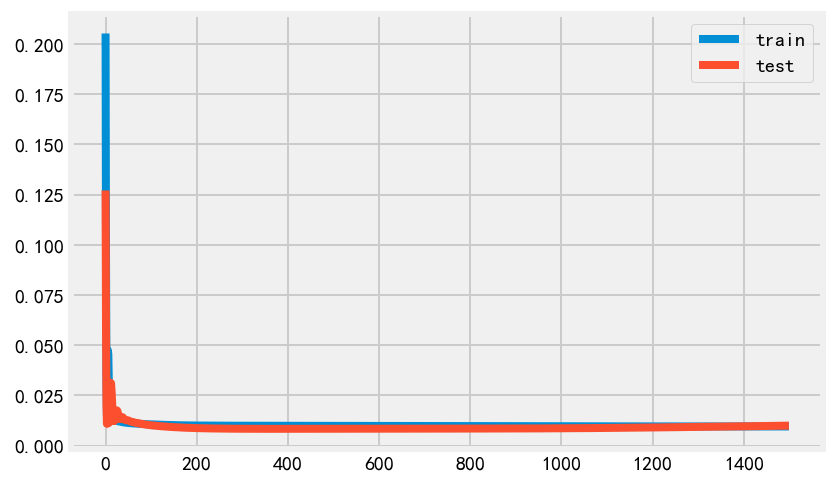

mean_squared_error: 0.00023483115
mean_absolute_error: 0.011234029
r2_score: -0.20258149695724437
Test RMSE: 0.015


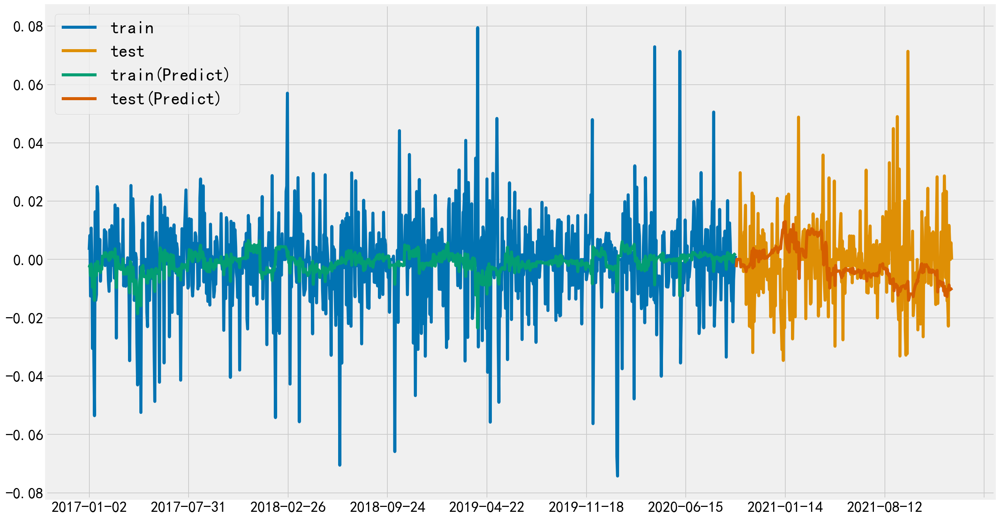

In [637]:
stock4_pdt1 = my_predict(stock4_pct,stock4_in,data_market,1500)

(976, 1, 6) (976,) (326, 1, 6) (326,)
Epoch 1/1500
2/2 - 2s - loss: 0.2343 - val_loss: 0.1947 - 2s/epoch - 1000ms/step
Epoch 2/1500
2/2 - 0s - loss: 0.1586 - val_loss: 0.1483 - 251ms/epoch - 126ms/step
Epoch 3/1500
2/2 - 0s - loss: 0.0992 - val_loss: 0.1082 - 250ms/epoch - 125ms/step
Epoch 4/1500
2/2 - 0s - loss: 0.0557 - val_loss: 0.0750 - 246ms/epoch - 123ms/step
Epoch 5/1500
2/2 - 0s - loss: 0.0291 - val_loss: 0.0496 - 249ms/epoch - 125ms/step
Epoch 6/1500
2/2 - 0s - loss: 0.0197 - val_loss: 0.0329 - 249ms/epoch - 125ms/step
Epoch 7/1500
2/2 - 0s - loss: 0.0245 - val_loss: 0.0240 - 247ms/epoch - 124ms/step
Epoch 8/1500
2/2 - 0s - loss: 0.0348 - val_loss: 0.0205 - 248ms/epoch - 124ms/step
Epoch 9/1500
2/2 - 0s - loss: 0.0413 - val_loss: 0.0201 - 245ms/epoch - 123ms/step
Epoch 10/1500
2/2 - 0s - loss: 0.0405 - val_loss: 0.0218 - 250ms/epoch - 125ms/step
Epoch 11/1500
2/2 - 0s - loss: 0.0346 - val_loss: 0.0253 - 245ms/epoch - 123ms/step
Epoch 12/1500
2/2 - 0s - loss: 0.0274 - val_loss:

Epoch 99/1500
2/2 - 0s - loss: 0.0105 - val_loss: 0.0116 - 243ms/epoch - 122ms/step
Epoch 100/1500
2/2 - 0s - loss: 0.0105 - val_loss: 0.0115 - 246ms/epoch - 123ms/step
Epoch 101/1500
2/2 - 0s - loss: 0.0105 - val_loss: 0.0114 - 250ms/epoch - 125ms/step
Epoch 102/1500
2/2 - 0s - loss: 0.0105 - val_loss: 0.0113 - 248ms/epoch - 124ms/step
Epoch 103/1500
2/2 - 0s - loss: 0.0105 - val_loss: 0.0112 - 248ms/epoch - 124ms/step
Epoch 104/1500
2/2 - 0s - loss: 0.0105 - val_loss: 0.0111 - 243ms/epoch - 122ms/step
Epoch 105/1500
2/2 - 0s - loss: 0.0104 - val_loss: 0.0110 - 243ms/epoch - 122ms/step
Epoch 106/1500
2/2 - 0s - loss: 0.0104 - val_loss: 0.0109 - 243ms/epoch - 122ms/step
Epoch 107/1500
2/2 - 0s - loss: 0.0104 - val_loss: 0.0108 - 247ms/epoch - 124ms/step
Epoch 108/1500
2/2 - 0s - loss: 0.0104 - val_loss: 0.0107 - 248ms/epoch - 124ms/step
Epoch 109/1500
2/2 - 0s - loss: 0.0104 - val_loss: 0.0107 - 243ms/epoch - 122ms/step
Epoch 110/1500
2/2 - 0s - loss: 0.0104 - val_loss: 0.0106 - 241ms/

Epoch 196/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0086 - 252ms/epoch - 126ms/step
Epoch 197/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0086 - 243ms/epoch - 122ms/step
Epoch 198/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0086 - 254ms/epoch - 127ms/step
Epoch 199/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0086 - 253ms/epoch - 127ms/step
Epoch 200/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0086 - 254ms/epoch - 127ms/step
Epoch 201/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0085 - 257ms/epoch - 129ms/step
Epoch 202/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0085 - 250ms/epoch - 125ms/step
Epoch 203/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0085 - 250ms/epoch - 125ms/step
Epoch 204/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0085 - 250ms/epoch - 125ms/step
Epoch 205/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0085 - 254ms/epoch - 127ms/step
Epoch 206/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0085 - 248ms/epoch - 124ms/step
Epoch 207/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0085 - 241ms

Epoch 293/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 261ms/epoch - 131ms/step
Epoch 294/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 253ms/epoch - 127ms/step
Epoch 295/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 247ms/epoch - 124ms/step
Epoch 296/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 255ms/epoch - 128ms/step
Epoch 297/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 249ms/epoch - 125ms/step
Epoch 298/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 254ms/epoch - 127ms/step
Epoch 299/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 250ms/epoch - 125ms/step
Epoch 300/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 247ms/epoch - 124ms/step
Epoch 301/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 253ms/epoch - 127ms/step
Epoch 302/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 245ms/epoch - 123ms/step
Epoch 303/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 251ms/epoch - 126ms/step
Epoch 304/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0084 - 251ms

Epoch 390/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 254ms/epoch - 127ms/step
Epoch 391/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 261ms/epoch - 131ms/step
Epoch 392/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 268ms/epoch - 134ms/step
Epoch 393/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 267ms/epoch - 134ms/step
Epoch 394/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 253ms/epoch - 127ms/step
Epoch 395/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 245ms/epoch - 123ms/step
Epoch 396/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 249ms/epoch - 125ms/step
Epoch 397/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 253ms/epoch - 127ms/step
Epoch 398/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 264ms/epoch - 132ms/step
Epoch 399/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 243ms/epoch - 122ms/step
Epoch 400/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 263ms/epoch - 132ms/step
Epoch 401/1500
2/2 - 0s - loss: 0.0099 - val_loss: 0.0083 - 245ms

Epoch 487/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 246ms/epoch - 123ms/step
Epoch 488/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 246ms/epoch - 123ms/step
Epoch 489/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 252ms/epoch - 126ms/step
Epoch 490/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 250ms/epoch - 125ms/step
Epoch 491/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 246ms/epoch - 123ms/step
Epoch 492/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 250ms/epoch - 125ms/step
Epoch 493/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 261ms/epoch - 131ms/step
Epoch 494/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 270ms/epoch - 135ms/step
Epoch 495/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 254ms/epoch - 127ms/step
Epoch 496/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 261ms/epoch - 131ms/step
Epoch 497/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 268ms/epoch - 134ms/step
Epoch 498/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 249ms

Epoch 584/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 257ms/epoch - 129ms/step
Epoch 585/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 252ms/epoch - 126ms/step
Epoch 586/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 243ms/epoch - 122ms/step
Epoch 587/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 245ms/epoch - 123ms/step
Epoch 588/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 245ms/epoch - 123ms/step
Epoch 589/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 245ms/epoch - 123ms/step
Epoch 590/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 246ms/epoch - 123ms/step
Epoch 591/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 288ms/epoch - 144ms/step
Epoch 592/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 248ms/epoch - 124ms/step
Epoch 593/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 255ms/epoch - 128ms/step
Epoch 594/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 256ms/epoch - 128ms/step
Epoch 595/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 263ms

Epoch 681/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 263ms/epoch - 132ms/step
Epoch 682/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 263ms/epoch - 132ms/step
Epoch 683/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 251ms/epoch - 126ms/step
Epoch 684/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 262ms/epoch - 131ms/step
Epoch 685/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 270ms/epoch - 135ms/step
Epoch 686/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 250ms/epoch - 125ms/step
Epoch 687/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 246ms/epoch - 123ms/step
Epoch 688/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 246ms/epoch - 123ms/step
Epoch 689/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 259ms/epoch - 130ms/step
Epoch 690/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 249ms/epoch - 125ms/step
Epoch 691/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 253ms/epoch - 127ms/step
Epoch 692/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0083 - 254ms

Epoch 778/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 268ms/epoch - 134ms/step
Epoch 779/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 289ms/epoch - 145ms/step
Epoch 780/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 245ms/epoch - 123ms/step
Epoch 781/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 251ms/epoch - 126ms/step
Epoch 782/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 253ms/epoch - 127ms/step
Epoch 783/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 250ms/epoch - 125ms/step
Epoch 784/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 244ms/epoch - 122ms/step
Epoch 785/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 266ms/epoch - 133ms/step
Epoch 786/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 277ms/epoch - 139ms/step
Epoch 787/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 247ms/epoch - 124ms/step
Epoch 788/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 248ms/epoch - 124ms/step
Epoch 789/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 257ms

Epoch 875/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0084 - 244ms/epoch - 122ms/step
Epoch 876/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0085 - 249ms/epoch - 125ms/step
Epoch 877/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0085 - 251ms/epoch - 126ms/step
Epoch 878/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0085 - 259ms/epoch - 130ms/step
Epoch 879/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0085 - 248ms/epoch - 124ms/step
Epoch 880/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0085 - 264ms/epoch - 132ms/step
Epoch 881/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0085 - 260ms/epoch - 130ms/step
Epoch 882/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0085 - 254ms/epoch - 127ms/step
Epoch 883/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0085 - 249ms/epoch - 125ms/step
Epoch 884/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0085 - 251ms/epoch - 126ms/step
Epoch 885/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0085 - 256ms/epoch - 128ms/step
Epoch 886/1500
2/2 - 0s - loss: 0.0098 - val_loss: 0.0085 - 247ms

Epoch 972/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 243ms/epoch - 122ms/step
Epoch 973/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 247ms/epoch - 124ms/step
Epoch 974/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0085 - 246ms/epoch - 123ms/step
Epoch 975/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0086 - 252ms/epoch - 126ms/step
Epoch 976/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0086 - 255ms/epoch - 128ms/step
Epoch 977/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0086 - 249ms/epoch - 125ms/step
Epoch 978/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0086 - 249ms/epoch - 125ms/step
Epoch 979/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0086 - 247ms/epoch - 123ms/step
Epoch 980/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0086 - 251ms/epoch - 126ms/step
Epoch 981/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0086 - 247ms/epoch - 124ms/step
Epoch 982/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0086 - 246ms/epoch - 123ms/step
Epoch 983/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0086 - 249ms

Epoch 1068/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0087 - 251ms/epoch - 126ms/step
Epoch 1069/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0087 - 241ms/epoch - 121ms/step
Epoch 1070/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0087 - 246ms/epoch - 123ms/step
Epoch 1071/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0087 - 255ms/epoch - 128ms/step
Epoch 1072/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0087 - 249ms/epoch - 125ms/step
Epoch 1073/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0087 - 249ms/epoch - 125ms/step
Epoch 1074/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0087 - 252ms/epoch - 126ms/step
Epoch 1075/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0087 - 246ms/epoch - 123ms/step
Epoch 1076/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0087 - 245ms/epoch - 123ms/step
Epoch 1077/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0087 - 245ms/epoch - 123ms/step
Epoch 1078/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0087 - 251ms/epoch - 126ms/step
Epoch 1079/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.

Epoch 1164/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0088 - 247ms/epoch - 124ms/step
Epoch 1165/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0088 - 251ms/epoch - 126ms/step
Epoch 1166/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0088 - 244ms/epoch - 122ms/step
Epoch 1167/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0088 - 245ms/epoch - 123ms/step
Epoch 1168/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0089 - 247ms/epoch - 124ms/step
Epoch 1169/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0089 - 246ms/epoch - 123ms/step
Epoch 1170/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0089 - 251ms/epoch - 126ms/step
Epoch 1171/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0089 - 242ms/epoch - 121ms/step
Epoch 1172/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0089 - 245ms/epoch - 123ms/step
Epoch 1173/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0089 - 243ms/epoch - 122ms/step
Epoch 1174/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0089 - 244ms/epoch - 122ms/step
Epoch 1175/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.

Epoch 1260/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0091 - 252ms/epoch - 126ms/step
Epoch 1261/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0091 - 243ms/epoch - 122ms/step
Epoch 1262/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0091 - 245ms/epoch - 123ms/step
Epoch 1263/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0091 - 250ms/epoch - 125ms/step
Epoch 1264/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0091 - 249ms/epoch - 124ms/step
Epoch 1265/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0091 - 250ms/epoch - 125ms/step
Epoch 1266/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0091 - 253ms/epoch - 127ms/step
Epoch 1267/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0091 - 263ms/epoch - 132ms/step
Epoch 1268/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0091 - 244ms/epoch - 122ms/step
Epoch 1269/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0091 - 252ms/epoch - 126ms/step
Epoch 1270/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0091 - 246ms/epoch - 123ms/step
Epoch 1271/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.

Epoch 1356/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0093 - 248ms/epoch - 124ms/step
Epoch 1357/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0093 - 249ms/epoch - 125ms/step
Epoch 1358/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0093 - 253ms/epoch - 127ms/step
Epoch 1359/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0093 - 249ms/epoch - 125ms/step
Epoch 1360/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0093 - 244ms/epoch - 122ms/step
Epoch 1361/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0093 - 244ms/epoch - 122ms/step
Epoch 1362/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0093 - 259ms/epoch - 130ms/step
Epoch 1363/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0093 - 264ms/epoch - 132ms/step
Epoch 1364/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0094 - 244ms/epoch - 122ms/step
Epoch 1365/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0094 - 248ms/epoch - 124ms/step
Epoch 1366/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0094 - 257ms/epoch - 128ms/step
Epoch 1367/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.

Epoch 1452/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0097 - 244ms/epoch - 122ms/step
Epoch 1453/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0097 - 255ms/epoch - 128ms/step
Epoch 1454/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0097 - 259ms/epoch - 130ms/step
Epoch 1455/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0097 - 261ms/epoch - 131ms/step
Epoch 1456/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0097 - 261ms/epoch - 131ms/step
Epoch 1457/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0097 - 257ms/epoch - 129ms/step
Epoch 1458/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0097 - 265ms/epoch - 133ms/step
Epoch 1459/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0097 - 254ms/epoch - 127ms/step
Epoch 1460/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0097 - 255ms/epoch - 128ms/step
Epoch 1461/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0097 - 249ms/epoch - 124ms/step
Epoch 1462/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.0097 - 240ms/epoch - 120ms/step
Epoch 1463/1500
2/2 - 0s - loss: 0.0097 - val_loss: 0.

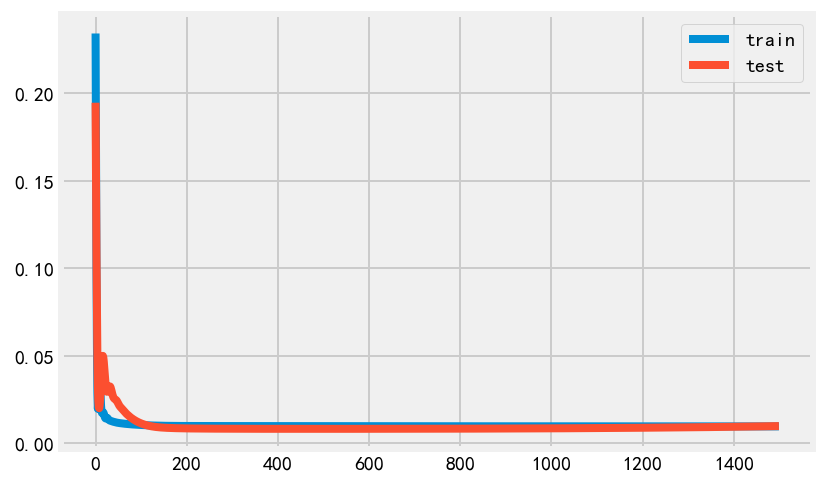

mean_squared_error: 0.00023345341
mean_absolute_error: 0.011093812
r2_score: -0.19552600862019265
Test RMSE: 0.015


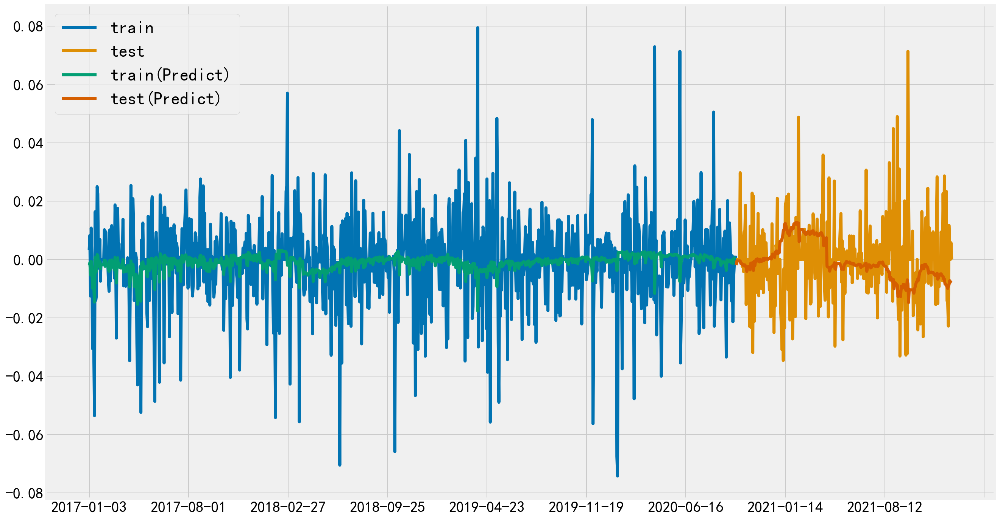

In [638]:
stock4_pdt2 = diff_predict(stock4_pct,stock4_in,data_market,1500)

    var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
16   0.999747   0.035060   0.011143   0.016479        0.0   0.003206   
17   0.997256   0.062997   0.023341   0.034518        0.0   0.006715   
18   1.000000   0.093889   0.036830   0.054467        0.0   0.010595   
19   0.997901   0.127736   0.051612   0.076323        0.0   0.014847   
20   0.999413   0.165075   0.067919   0.100435        0.0   0.019537   

    var7(t-1)  var8(t-1)  var9(t-1)  var10(t-1)  var11(t-1)   var1(t)  
16   0.853396   0.521279   0.786894    0.251485    0.134206  0.997256  
17   0.853396   0.521279   0.786894    0.251485    0.134206  1.000000  
18   0.853396   0.521279   0.786894    0.251485    0.134206  0.997901  
19   0.853396   0.521279   0.786894    0.251485    0.134206  0.999413  
20   0.853396   0.521279   0.786894    0.251485    0.134206  0.499061  
(966, 1, 11) (966,) (323, 1, 11) (323,)
Epoch 1/400
1/1 - 3s - loss: 0.2886 - val_loss: 0.2179 - 3s/epoch - 3s/step
Epoch 2/400
1/1 - 0

1/1 - 0s - loss: 0.0221 - val_loss: 0.0199 - 50ms/epoch - 50ms/step
Epoch 92/400
1/1 - 0s - loss: 0.0221 - val_loss: 0.0199 - 47ms/epoch - 47ms/step
Epoch 93/400
1/1 - 0s - loss: 0.0221 - val_loss: 0.0198 - 49ms/epoch - 49ms/step
Epoch 94/400
1/1 - 0s - loss: 0.0220 - val_loss: 0.0197 - 52ms/epoch - 52ms/step
Epoch 95/400
1/1 - 0s - loss: 0.0220 - val_loss: 0.0195 - 51ms/epoch - 51ms/step
Epoch 96/400
1/1 - 0s - loss: 0.0220 - val_loss: 0.0194 - 50ms/epoch - 50ms/step
Epoch 97/400
1/1 - 0s - loss: 0.0220 - val_loss: 0.0193 - 48ms/epoch - 48ms/step
Epoch 98/400
1/1 - 0s - loss: 0.0220 - val_loss: 0.0191 - 49ms/epoch - 49ms/step
Epoch 99/400
1/1 - 0s - loss: 0.0220 - val_loss: 0.0190 - 53ms/epoch - 53ms/step
Epoch 100/400
1/1 - 0s - loss: 0.0220 - val_loss: 0.0188 - 53ms/epoch - 53ms/step
Epoch 101/400
1/1 - 0s - loss: 0.0219 - val_loss: 0.0187 - 53ms/epoch - 53ms/step
Epoch 102/400
1/1 - 0s - loss: 0.0219 - val_loss: 0.0185 - 52ms/epoch - 52ms/step
Epoch 103/400
1/1 - 0s - loss: 0.0219 

Epoch 192/400
1/1 - 0s - loss: 0.0211 - val_loss: 0.0144 - 51ms/epoch - 51ms/step
Epoch 193/400
1/1 - 0s - loss: 0.0211 - val_loss: 0.0143 - 50ms/epoch - 50ms/step
Epoch 194/400
1/1 - 0s - loss: 0.0211 - val_loss: 0.0143 - 48ms/epoch - 48ms/step
Epoch 195/400
1/1 - 0s - loss: 0.0211 - val_loss: 0.0143 - 48ms/epoch - 48ms/step
Epoch 196/400
1/1 - 0s - loss: 0.0210 - val_loss: 0.0142 - 51ms/epoch - 51ms/step
Epoch 197/400
1/1 - 0s - loss: 0.0210 - val_loss: 0.0142 - 52ms/epoch - 52ms/step
Epoch 198/400
1/1 - 0s - loss: 0.0210 - val_loss: 0.0142 - 54ms/epoch - 54ms/step
Epoch 199/400
1/1 - 0s - loss: 0.0210 - val_loss: 0.0141 - 51ms/epoch - 51ms/step
Epoch 200/400
1/1 - 0s - loss: 0.0210 - val_loss: 0.0141 - 53ms/epoch - 53ms/step
Epoch 201/400
1/1 - 0s - loss: 0.0210 - val_loss: 0.0141 - 55ms/epoch - 55ms/step
Epoch 202/400
1/1 - 0s - loss: 0.0210 - val_loss: 0.0140 - 54ms/epoch - 54ms/step
Epoch 203/400
1/1 - 0s - loss: 0.0210 - val_loss: 0.0140 - 52ms/epoch - 52ms/step
Epoch 204/400
1/

Epoch 292/400
1/1 - 0s - loss: 0.0201 - val_loss: 0.0122 - 50ms/epoch - 50ms/step
Epoch 293/400
1/1 - 0s - loss: 0.0201 - val_loss: 0.0122 - 51ms/epoch - 51ms/step
Epoch 294/400
1/1 - 0s - loss: 0.0201 - val_loss: 0.0122 - 49ms/epoch - 49ms/step
Epoch 295/400
1/1 - 0s - loss: 0.0201 - val_loss: 0.0122 - 52ms/epoch - 52ms/step
Epoch 296/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0122 - 50ms/epoch - 50ms/step
Epoch 297/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0122 - 51ms/epoch - 51ms/step
Epoch 298/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0122 - 51ms/epoch - 51ms/step
Epoch 299/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0122 - 50ms/epoch - 50ms/step
Epoch 300/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0122 - 50ms/epoch - 50ms/step
Epoch 301/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0122 - 48ms/epoch - 48ms/step
Epoch 302/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0122 - 48ms/epoch - 48ms/step
Epoch 303/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0122 - 46ms/epoch - 46ms/step
Epoch 304/400
1/

Epoch 392/400
1/1 - 0s - loss: 0.0194 - val_loss: 0.0132 - 50ms/epoch - 50ms/step
Epoch 393/400
1/1 - 0s - loss: 0.0194 - val_loss: 0.0132 - 52ms/epoch - 52ms/step
Epoch 394/400
1/1 - 0s - loss: 0.0194 - val_loss: 0.0132 - 50ms/epoch - 50ms/step
Epoch 395/400
1/1 - 0s - loss: 0.0194 - val_loss: 0.0132 - 50ms/epoch - 50ms/step
Epoch 396/400
1/1 - 0s - loss: 0.0194 - val_loss: 0.0132 - 49ms/epoch - 49ms/step
Epoch 397/400
1/1 - 0s - loss: 0.0194 - val_loss: 0.0133 - 50ms/epoch - 50ms/step
Epoch 398/400
1/1 - 0s - loss: 0.0194 - val_loss: 0.0133 - 47ms/epoch - 47ms/step
Epoch 399/400
1/1 - 0s - loss: 0.0194 - val_loss: 0.0133 - 48ms/epoch - 48ms/step
Epoch 400/400
1/1 - 0s - loss: 0.0194 - val_loss: 0.0133 - 48ms/epoch - 48ms/step


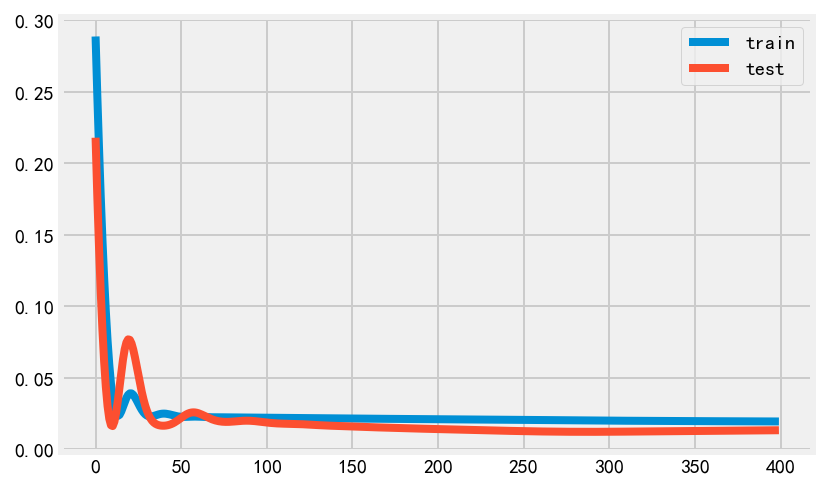

mean_squared_error: 0.0005323095
mean_absolute_error: 0.017149705
r2_score: -0.1705709987157471
Test RMSE: 0.023


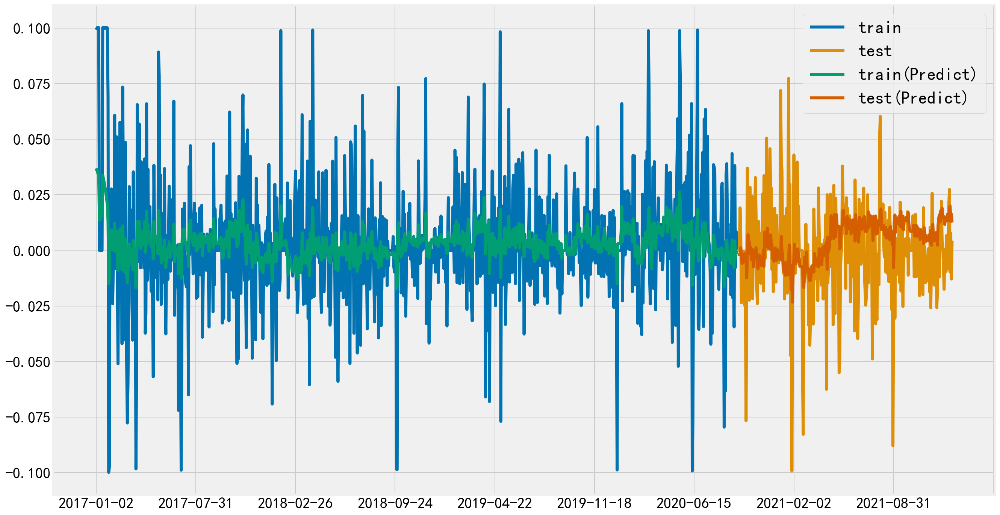

In [647]:
stock5_pdt1 = my_predict(stock5_pct,stock5_in,data_market,400)

(966, 1, 6) (966,) (323, 1, 6) (323,)
Epoch 1/400
1/1 - 2s - loss: 0.2957 - val_loss: 0.2297 - 2s/epoch - 2s/step
Epoch 2/400
1/1 - 0s - loss: 0.2726 - val_loss: 0.2038 - 50ms/epoch - 50ms/step
Epoch 3/400
1/1 - 0s - loss: 0.2506 - val_loss: 0.1796 - 49ms/epoch - 49ms/step
Epoch 4/400
1/1 - 0s - loss: 0.2297 - val_loss: 0.1569 - 49ms/epoch - 49ms/step
Epoch 5/400
1/1 - 0s - loss: 0.2097 - val_loss: 0.1359 - 48ms/epoch - 48ms/step
Epoch 6/400
1/1 - 0s - loss: 0.1907 - val_loss: 0.1165 - 48ms/epoch - 48ms/step
Epoch 7/400
1/1 - 0s - loss: 0.1727 - val_loss: 0.0988 - 49ms/epoch - 49ms/step
Epoch 8/400
1/1 - 0s - loss: 0.1556 - val_loss: 0.0827 - 49ms/epoch - 49ms/step
Epoch 9/400
1/1 - 0s - loss: 0.1396 - val_loss: 0.0684 - 51ms/epoch - 51ms/step
Epoch 10/400
1/1 - 0s - loss: 0.1246 - val_loss: 0.0558 - 52ms/epoch - 52ms/step
Epoch 11/400
1/1 - 0s - loss: 0.1106 - val_loss: 0.0449 - 52ms/epoch - 52ms/step
Epoch 12/400
1/1 - 0s - loss: 0.0976 - val_loss: 0.0359 - 52ms/epoch - 52ms/step
Epo

Epoch 102/400
1/1 - 0s - loss: 0.0237 - val_loss: 0.0206 - 51ms/epoch - 51ms/step
Epoch 103/400
1/1 - 0s - loss: 0.0237 - val_loss: 0.0205 - 51ms/epoch - 51ms/step
Epoch 104/400
1/1 - 0s - loss: 0.0236 - val_loss: 0.0204 - 52ms/epoch - 52ms/step
Epoch 105/400
1/1 - 0s - loss: 0.0236 - val_loss: 0.0203 - 50ms/epoch - 50ms/step
Epoch 106/400
1/1 - 0s - loss: 0.0236 - val_loss: 0.0202 - 53ms/epoch - 53ms/step
Epoch 107/400
1/1 - 0s - loss: 0.0235 - val_loss: 0.0201 - 54ms/epoch - 54ms/step
Epoch 108/400
1/1 - 0s - loss: 0.0235 - val_loss: 0.0200 - 54ms/epoch - 54ms/step
Epoch 109/400
1/1 - 0s - loss: 0.0234 - val_loss: 0.0199 - 55ms/epoch - 55ms/step
Epoch 110/400
1/1 - 0s - loss: 0.0234 - val_loss: 0.0197 - 50ms/epoch - 50ms/step
Epoch 111/400
1/1 - 0s - loss: 0.0233 - val_loss: 0.0196 - 50ms/epoch - 50ms/step
Epoch 112/400
1/1 - 0s - loss: 0.0233 - val_loss: 0.0195 - 49ms/epoch - 49ms/step
Epoch 113/400
1/1 - 0s - loss: 0.0233 - val_loss: 0.0193 - 50ms/epoch - 50ms/step
Epoch 114/400
1/

Epoch 202/400
1/1 - 0s - loss: 0.0209 - val_loss: 0.0118 - 50ms/epoch - 50ms/step
Epoch 203/400
1/1 - 0s - loss: 0.0209 - val_loss: 0.0117 - 53ms/epoch - 53ms/step
Epoch 204/400
1/1 - 0s - loss: 0.0209 - val_loss: 0.0117 - 51ms/epoch - 51ms/step
Epoch 205/400
1/1 - 0s - loss: 0.0209 - val_loss: 0.0117 - 51ms/epoch - 51ms/step
Epoch 206/400
1/1 - 0s - loss: 0.0209 - val_loss: 0.0117 - 50ms/epoch - 50ms/step
Epoch 207/400
1/1 - 0s - loss: 0.0208 - val_loss: 0.0117 - 49ms/epoch - 49ms/step
Epoch 208/400
1/1 - 0s - loss: 0.0208 - val_loss: 0.0116 - 50ms/epoch - 50ms/step
Epoch 209/400
1/1 - 0s - loss: 0.0208 - val_loss: 0.0116 - 52ms/epoch - 52ms/step
Epoch 210/400
1/1 - 0s - loss: 0.0208 - val_loss: 0.0116 - 50ms/epoch - 50ms/step
Epoch 211/400
1/1 - 0s - loss: 0.0208 - val_loss: 0.0116 - 48ms/epoch - 48ms/step
Epoch 212/400
1/1 - 0s - loss: 0.0208 - val_loss: 0.0116 - 47ms/epoch - 47ms/step
Epoch 213/400
1/1 - 0s - loss: 0.0208 - val_loss: 0.0116 - 46ms/epoch - 46ms/step
Epoch 214/400
1/

Epoch 302/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0116 - 54ms/epoch - 54ms/step
Epoch 303/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0116 - 51ms/epoch - 51ms/step
Epoch 304/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0116 - 51ms/epoch - 51ms/step
Epoch 305/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0116 - 49ms/epoch - 49ms/step
Epoch 306/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0116 - 49ms/epoch - 49ms/step
Epoch 307/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0116 - 50ms/epoch - 50ms/step
Epoch 308/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0116 - 48ms/epoch - 48ms/step
Epoch 309/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0116 - 47ms/epoch - 47ms/step
Epoch 310/400
1/1 - 0s - loss: 0.0200 - val_loss: 0.0116 - 51ms/epoch - 51ms/step
Epoch 311/400
1/1 - 0s - loss: 0.0199 - val_loss: 0.0117 - 48ms/epoch - 48ms/step
Epoch 312/400
1/1 - 0s - loss: 0.0199 - val_loss: 0.0117 - 48ms/epoch - 48ms/step
Epoch 313/400
1/1 - 0s - loss: 0.0199 - val_loss: 0.0117 - 48ms/epoch - 48ms/step
Epoch 314/400
1/

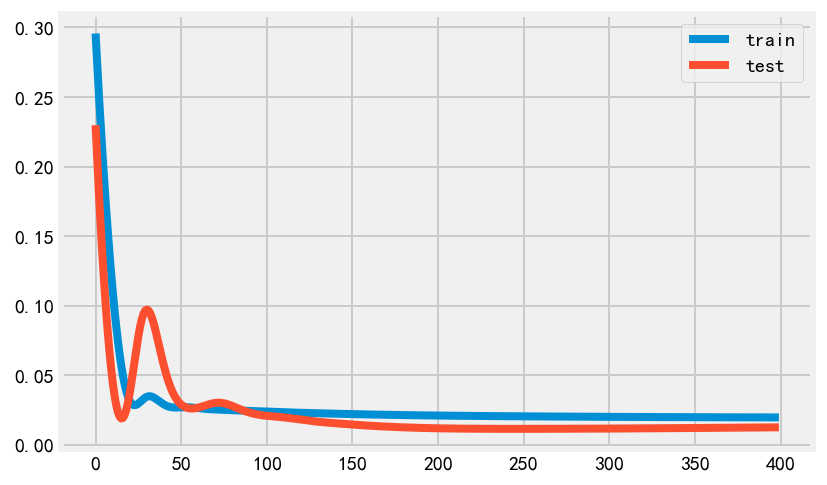

mean_squared_error: 0.0004998931
mean_absolute_error: 0.016495751
r2_score: -0.099285898406823
Test RMSE: 0.022


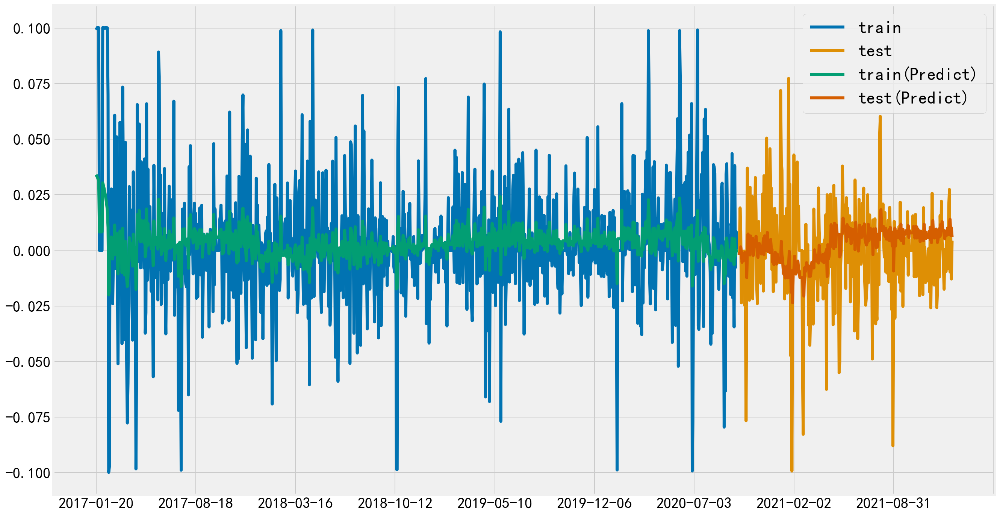

In [648]:
stock5_pdt2 = diff_predict(stock5_pct,stock5_in,data_market,400)

In [659]:
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data) 
    cols = []
    names = []
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
     # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

def my_bond_predict(data,data_in,data_market,e):
    dataset = pd.DataFrame({'收益率':data,
                            'volume':data_in['volume'],
                            'Increasing':data_market['Increasing'],
                            'Inflation_life':data_market['Inflation_life'],
                            'Inflation_product':data_market['Inflation_product'],
                            'Rate':data_market['Rate'],
                            'Exchange':data_market['Exchange']})
    
    values = dataset.values
    # integer encode direction
    encoder = LabelEncoder()
    values[:,4] = encoder.fit_transform(values[:,4])
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 1, 1)
    reframed.drop(reframed.columns[[8,9,10,11,12,13]], axis=1, inplace=True)
    print(reframed.head())
    
    # split into train and test sets
    values = reframed.values
    n_train = int((len(reframed)*0.75)/1)
    train = values[:n_train, :]
    test = values[n_train:, :]

    # split into input and outputs
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]
    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)
    
    model = Sequential()
    model.add(LSTM(e, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    
    # fit network
    history = model.fit(train_X, train_y, epochs=e, batch_size=500, validation_data=(test_X, test_y), verbose=2, shuffle=False)
    # plot history
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.legend()
    plt.show()
    
    # make a prediction
    yhat = model.predict(test_X)
    test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
    # invert scaling for forecast
    inv_yhat = np.concatenate((yhat, test_X[:, 1:]), axis=1)
    inv_yhat = scaler.inverse_transform(inv_yhat)
    inv_yhat = inv_yhat[:,0]
    inv_yhat = pd.Series(inv_yhat, index = dataset.index[-len(inv_yhat):].to_period())
    # invert scaling for actual
    test_y = test_y.reshape((len(test_y), 1))
    inv_y = np.concatenate((test_y, test_X[:, 1:]), axis=1)
    inv_y = scaler.inverse_transform(inv_y)
    inv_y = inv_y[:,0]
    inv_y  = pd.Series(inv_y, index = dataset.index[-len(inv_y):].to_period())
    # invert scaling for train
    xhat = model.predict(train_X)
    train_X = train_X.reshape((train_X.shape[0], train_X.shape[2]))
    inv_xhat = np.concatenate((xhat, train_X[:, 1:]), axis=1)
    inv_xhat = scaler.inverse_transform(inv_xhat)
    inv_xhat = inv_xhat[:,0]
    inv_xhat  = pd.Series(inv_xhat, index = dataset.index[:n_train].to_period())
    train_X = scaler.inverse_transform(train_X)
    inv_x  = pd.Series(train_X[:,0], index = dataset.index[:n_train].to_period())
    
    print("mean_squared_error:",mean_squared_error(inv_y, inv_yhat))
    print("mean_absolute_error:",mean_absolute_error(inv_y, inv_yhat))
    print("r2_score:",r2_score(inv_y, inv_yhat))
    
    fig, ax = plot_series(inv_x, inv_y, inv_xhat, inv_yhat, labels=["train", "test", "train(Predict)", "test(Predict)"]
                          ,markers=['','','',''])
    fig.set_size_inches(20,12)
    plt.legend(loc = 0, fontsize=23)
    plt.tick_params(labelsize=20)
    # calculate RMSE
    rmse = np.sqrt(mean_squared_error(inv_y, inv_yhat))
    print('Test RMSE: %.3f' % rmse)
    
    predict_data = pd.concat([inv_x,inv_y[:3]])
    predict_data = pd.concat([predict_data,inv_yhat])
    return predict_data
    
def diff_bond_predict(data,data_in,data_market,e):
    dataset = pd.DataFrame({'收益率':data,
                            'volume':data_in['volume']})
    values = dataset.values
    # integer encode direction
    encoder = LabelEncoder()
    values[:,1] = encoder.fit_transform(values[:,1])
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 1, 1)
    reframed.drop(reframed.columns[[3]], axis=1, inplace=True)
    
    # split into train and test sets
    values = reframed.values
    n_train = int((len(reframed)*0.75)/1)
    train = values[:n_train, :]
    test = values[n_train:, :]

    # split into input and outputs
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]
    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)
    
    model = Sequential()
    model.add(LSTM(e, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    
    # fit network
    history = model.fit(train_X, train_y, epochs=e, batch_size=500, validation_data=(test_X, test_y), verbose=2, shuffle=False)
    # plot history
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.legend()
    plt.show()
    
    # make a prediction
    yhat = model.predict(test_X)
    test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
    # invert scaling for forecast
    inv_yhat = np.concatenate((yhat, test_X[:, 1:]), axis=1)
    inv_yhat = scaler.inverse_transform(inv_yhat)
    inv_yhat = inv_yhat[:,0]
    inv_yhat = pd.Series(inv_yhat, index = dataset.index[-len(inv_yhat):].to_period())
    # invert scaling for actual
    test_y = test_y.reshape((len(test_y), 1))
    inv_y = np.concatenate((test_y, test_X[:, 1:]), axis=1)
    inv_y = scaler.inverse_transform(inv_y)
    inv_y = inv_y[:,0]
    inv_y  = pd.Series(inv_y, index = dataset.index[-len(inv_y):].to_period())
    # invert scaling for train
    xhat = model.predict(train_X)
    train_X = train_X.reshape((train_X.shape[0], train_X.shape[2]))
    inv_xhat = np.concatenate((xhat, train_X[:, 1:]), axis=1)
    inv_xhat = scaler.inverse_transform(inv_xhat)
    inv_xhat = inv_xhat[:,0]
    inv_xhat  = pd.Series(inv_xhat, index = dataset.index[:n_train].to_period())
    train_X = scaler.inverse_transform(train_X)
    inv_x  = pd.Series(train_X[:,0], index = dataset.index[:n_train].to_period())
    
    print("mean_squared_error:",mean_squared_error(inv_y, inv_yhat))
    print("mean_absolute_error:",mean_absolute_error(inv_y, inv_yhat))
    print("r2_score:",r2_score(inv_y, inv_yhat))
    
    fig, ax = plot_series(inv_x, inv_y, inv_xhat, inv_yhat, labels=["train", "test", "train(Predict)", "test(Predict)"],
                         markers=['','','',''])
    fig.set_size_inches(20,12)
    plt.legend(loc = 0, fontsize=23)
    plt.tick_params(labelsize=20)
    # calculate RMSE
    rmse = np.sqrt(mean_squared_error(inv_y, inv_yhat))
    print('Test RMSE: %.3f' % rmse)
    
    predict_data = pd.concat([inv_x,inv_y[:3]])
    predict_data = pd.concat([predict_data,inv_yhat])
    return predict_data

   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
3   0.313884   0.248784   0.853396   0.521279    0.79661   0.251485   
4   0.269231   0.325851   0.853396   0.521279    0.79661   0.251485   
5   0.402999   0.271632   0.853396   0.521279    0.79661   0.251485   
6   0.507160   0.952844   0.853396   0.521279    0.79661   0.251485   
7   0.514407   0.586803   0.853396   0.521279    0.79661   0.251485   

   var7(t-1)   var1(t)  
3   0.134206  0.269231  
4   0.134206  0.402999  
5   0.134206  0.507160  
6   0.134206  0.514407  
7   0.134206  0.291697  
(894, 1, 7) (894,) (298, 1, 7) (298,)
Epoch 1/400
2/2 - 2s - loss: 0.1602 - val_loss: 0.1198 - 2s/epoch - 895ms/step
Epoch 2/400
2/2 - 0s - loss: 0.1164 - val_loss: 0.0825 - 49ms/epoch - 25ms/step
Epoch 3/400
2/2 - 0s - loss: 0.0802 - val_loss: 0.0528 - 50ms/epoch - 25ms/step
Epoch 4/400
2/2 - 0s - loss: 0.0516 - val_loss: 0.0304 - 49ms/epoch - 25ms/step
Epoch 5/400
2/2 - 0s - loss: 0.0305 - val_loss: 0.0152 - 51ms/epoc

Epoch 95/400
2/2 - 0s - loss: 0.0065 - val_loss: 0.0038 - 50ms/epoch - 25ms/step
Epoch 96/400
2/2 - 0s - loss: 0.0065 - val_loss: 0.0038 - 49ms/epoch - 25ms/step
Epoch 97/400
2/2 - 0s - loss: 0.0065 - val_loss: 0.0038 - 52ms/epoch - 26ms/step
Epoch 98/400
2/2 - 0s - loss: 0.0065 - val_loss: 0.0038 - 52ms/epoch - 26ms/step
Epoch 99/400
2/2 - 0s - loss: 0.0065 - val_loss: 0.0038 - 52ms/epoch - 26ms/step
Epoch 100/400
2/2 - 0s - loss: 0.0065 - val_loss: 0.0038 - 48ms/epoch - 24ms/step
Epoch 101/400
2/2 - 0s - loss: 0.0065 - val_loss: 0.0038 - 52ms/epoch - 26ms/step
Epoch 102/400
2/2 - 0s - loss: 0.0065 - val_loss: 0.0038 - 50ms/epoch - 25ms/step
Epoch 103/400
2/2 - 0s - loss: 0.0065 - val_loss: 0.0038 - 50ms/epoch - 25ms/step
Epoch 104/400
2/2 - 0s - loss: 0.0065 - val_loss: 0.0037 - 50ms/epoch - 25ms/step
Epoch 105/400
2/2 - 0s - loss: 0.0065 - val_loss: 0.0037 - 50ms/epoch - 25ms/step
Epoch 106/400
2/2 - 0s - loss: 0.0064 - val_loss: 0.0037 - 51ms/epoch - 25ms/step
Epoch 107/400
2/2 - 0

Epoch 195/400
2/2 - 0s - loss: 0.0062 - val_loss: 0.0036 - 50ms/epoch - 25ms/step
Epoch 196/400
2/2 - 0s - loss: 0.0062 - val_loss: 0.0036 - 51ms/epoch - 26ms/step
Epoch 197/400
2/2 - 0s - loss: 0.0062 - val_loss: 0.0036 - 52ms/epoch - 26ms/step
Epoch 198/400
2/2 - 0s - loss: 0.0062 - val_loss: 0.0036 - 50ms/epoch - 25ms/step
Epoch 199/400
2/2 - 0s - loss: 0.0061 - val_loss: 0.0036 - 52ms/epoch - 26ms/step
Epoch 200/400
2/2 - 0s - loss: 0.0061 - val_loss: 0.0036 - 50ms/epoch - 25ms/step
Epoch 201/400
2/2 - 0s - loss: 0.0061 - val_loss: 0.0036 - 51ms/epoch - 26ms/step
Epoch 202/400
2/2 - 0s - loss: 0.0061 - val_loss: 0.0036 - 50ms/epoch - 25ms/step
Epoch 203/400
2/2 - 0s - loss: 0.0061 - val_loss: 0.0036 - 51ms/epoch - 26ms/step
Epoch 204/400
2/2 - 0s - loss: 0.0061 - val_loss: 0.0036 - 49ms/epoch - 25ms/step
Epoch 205/400
2/2 - 0s - loss: 0.0061 - val_loss: 0.0036 - 49ms/epoch - 25ms/step
Epoch 206/400
2/2 - 0s - loss: 0.0061 - val_loss: 0.0036 - 50ms/epoch - 25ms/step
Epoch 207/400
2/

Epoch 295/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0034 - 50ms/epoch - 25ms/step
Epoch 296/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0034 - 50ms/epoch - 25ms/step
Epoch 297/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0034 - 52ms/epoch - 26ms/step
Epoch 298/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0034 - 50ms/epoch - 25ms/step
Epoch 299/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0034 - 50ms/epoch - 25ms/step
Epoch 300/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0034 - 51ms/epoch - 26ms/step
Epoch 301/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0034 - 51ms/epoch - 26ms/step
Epoch 302/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0034 - 53ms/epoch - 27ms/step
Epoch 303/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0033 - 53ms/epoch - 27ms/step
Epoch 304/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0033 - 54ms/epoch - 27ms/step
Epoch 305/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0033 - 52ms/epoch - 26ms/step
Epoch 306/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0033 - 49ms/epoch - 25ms/step
Epoch 307/400
2/

Epoch 395/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0030 - 52ms/epoch - 26ms/step
Epoch 396/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0030 - 52ms/epoch - 26ms/step
Epoch 397/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0030 - 50ms/epoch - 25ms/step
Epoch 398/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0030 - 51ms/epoch - 26ms/step
Epoch 399/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0030 - 50ms/epoch - 25ms/step
Epoch 400/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0030 - 51ms/epoch - 26ms/step


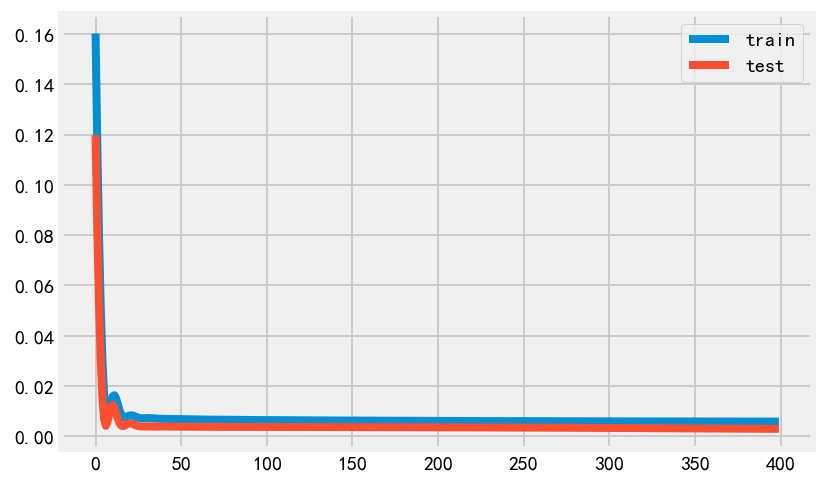

mean_squared_error: 4.951841e-07
mean_absolute_error: 0.00048986665
r2_score: -0.13508741565531257
Test RMSE: 0.001


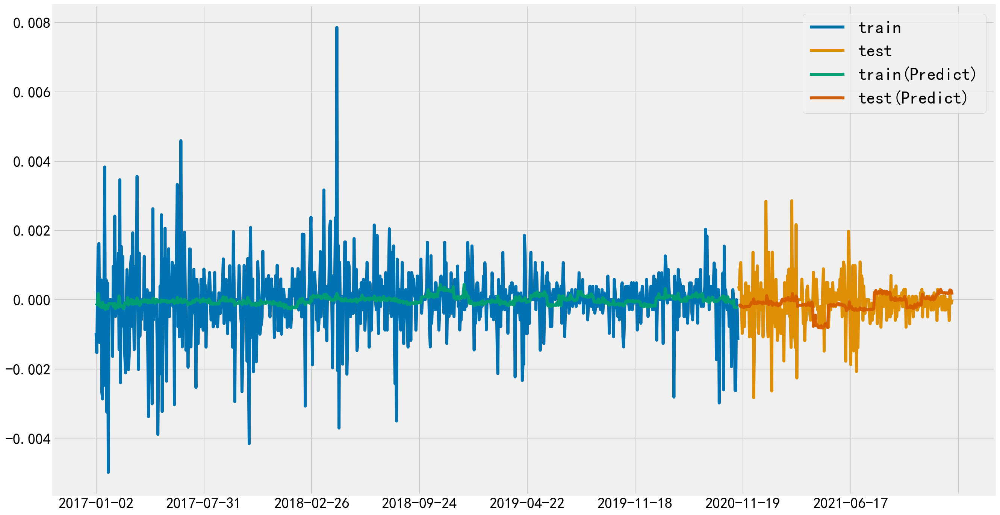

In [660]:
 bond1_pdt1 = my_bond_predict(bond1_pct,bond1,data_market,400)

(894, 1, 2) (894,) (298, 1, 2) (298,)
Epoch 1/400
2/2 - 2s - loss: 0.1379 - val_loss: 0.1189 - 2s/epoch - 895ms/step
Epoch 2/400
2/2 - 0s - loss: 0.1170 - val_loss: 0.1007 - 49ms/epoch - 25ms/step
Epoch 3/400
2/2 - 0s - loss: 0.0978 - val_loss: 0.0840 - 51ms/epoch - 26ms/step
Epoch 4/400
2/2 - 0s - loss: 0.0804 - val_loss: 0.0689 - 49ms/epoch - 25ms/step
Epoch 5/400
2/2 - 0s - loss: 0.0648 - val_loss: 0.0553 - 49ms/epoch - 25ms/step
Epoch 6/400
2/2 - 0s - loss: 0.0510 - val_loss: 0.0433 - 50ms/epoch - 25ms/step
Epoch 7/400
2/2 - 0s - loss: 0.0392 - val_loss: 0.0331 - 50ms/epoch - 25ms/step
Epoch 8/400
2/2 - 0s - loss: 0.0294 - val_loss: 0.0246 - 49ms/epoch - 25ms/step
Epoch 9/400
2/2 - 0s - loss: 0.0217 - val_loss: 0.0180 - 51ms/epoch - 26ms/step
Epoch 10/400
2/2 - 0s - loss: 0.0161 - val_loss: 0.0133 - 50ms/epoch - 25ms/step
Epoch 11/400
2/2 - 0s - loss: 0.0125 - val_loss: 0.0103 - 50ms/epoch - 25ms/step
Epoch 12/400
2/2 - 0s - loss: 0.0108 - val_loss: 0.0087 - 52ms/epoch - 26ms/step


Epoch 102/400
2/2 - 0s - loss: 0.0063 - val_loss: 0.0030 - 52ms/epoch - 26ms/step
Epoch 103/400
2/2 - 0s - loss: 0.0063 - val_loss: 0.0030 - 49ms/epoch - 25ms/step
Epoch 104/400
2/2 - 0s - loss: 0.0063 - val_loss: 0.0030 - 52ms/epoch - 26ms/step
Epoch 105/400
2/2 - 0s - loss: 0.0063 - val_loss: 0.0030 - 53ms/epoch - 27ms/step
Epoch 106/400
2/2 - 0s - loss: 0.0063 - val_loss: 0.0030 - 50ms/epoch - 25ms/step
Epoch 107/400
2/2 - 0s - loss: 0.0063 - val_loss: 0.0030 - 53ms/epoch - 27ms/step
Epoch 108/400
2/2 - 0s - loss: 0.0063 - val_loss: 0.0029 - 54ms/epoch - 27ms/step
Epoch 109/400
2/2 - 0s - loss: 0.0063 - val_loss: 0.0029 - 53ms/epoch - 26ms/step
Epoch 110/400
2/2 - 0s - loss: 0.0063 - val_loss: 0.0029 - 51ms/epoch - 26ms/step
Epoch 111/400
2/2 - 0s - loss: 0.0063 - val_loss: 0.0029 - 52ms/epoch - 26ms/step
Epoch 112/400
2/2 - 0s - loss: 0.0063 - val_loss: 0.0029 - 54ms/epoch - 27ms/step
Epoch 113/400
2/2 - 0s - loss: 0.0063 - val_loss: 0.0029 - 55ms/epoch - 28ms/step
Epoch 114/400
2/

Epoch 202/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0028 - 51ms/epoch - 26ms/step
Epoch 203/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0028 - 50ms/epoch - 25ms/step
Epoch 204/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0028 - 52ms/epoch - 26ms/step
Epoch 205/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0028 - 49ms/epoch - 25ms/step
Epoch 206/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0028 - 48ms/epoch - 24ms/step
Epoch 207/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0028 - 51ms/epoch - 26ms/step
Epoch 208/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0028 - 51ms/epoch - 26ms/step
Epoch 209/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0027 - 50ms/epoch - 25ms/step
Epoch 210/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0027 - 49ms/epoch - 25ms/step
Epoch 211/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0027 - 51ms/epoch - 26ms/step
Epoch 212/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0027 - 50ms/epoch - 25ms/step
Epoch 213/400
2/2 - 0s - loss: 0.0060 - val_loss: 0.0027 - 50ms/epoch - 25ms/step
Epoch 214/400
2/

Epoch 302/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0027 - 51ms/epoch - 26ms/step
Epoch 303/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0027 - 52ms/epoch - 26ms/step
Epoch 304/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0027 - 51ms/epoch - 26ms/step
Epoch 305/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0027 - 61ms/epoch - 31ms/step
Epoch 306/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0027 - 54ms/epoch - 27ms/step
Epoch 307/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0027 - 50ms/epoch - 25ms/step
Epoch 308/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0027 - 54ms/epoch - 27ms/step
Epoch 309/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0027 - 52ms/epoch - 26ms/step
Epoch 310/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0027 - 48ms/epoch - 24ms/step
Epoch 311/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0027 - 48ms/epoch - 24ms/step
Epoch 312/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0027 - 49ms/epoch - 25ms/step
Epoch 313/400
2/2 - 0s - loss: 0.0059 - val_loss: 0.0027 - 48ms/epoch - 24ms/step
Epoch 314/400
2/

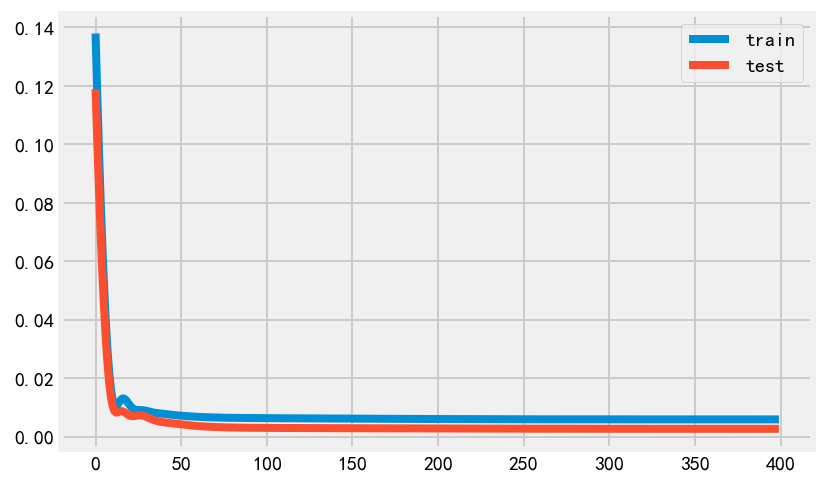

mean_squared_error: 4.3714863e-07
mean_absolute_error: 0.0004393035
r2_score: -0.0020553314099902575
Test RMSE: 0.001


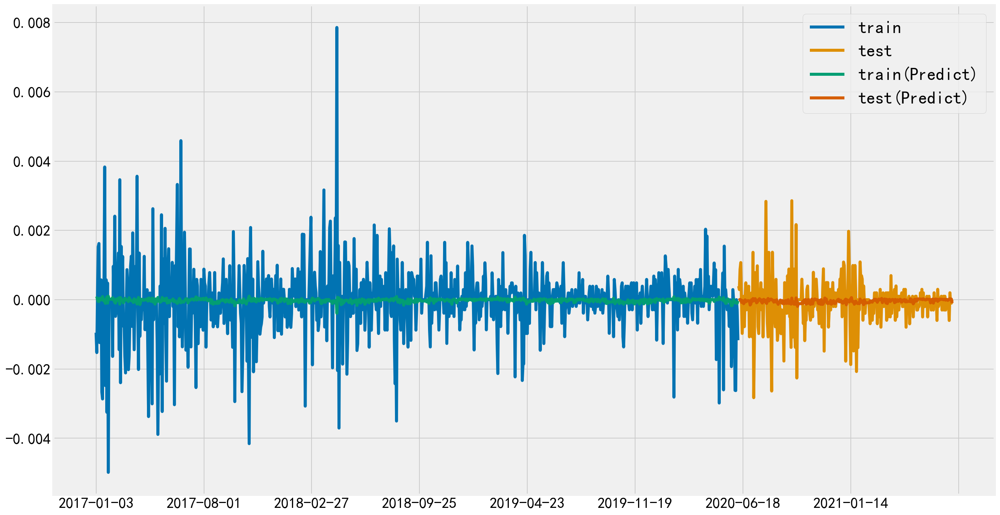

In [661]:
bond1_pdt2 = diff_bond_predict(bond1_pct,bond1,data_market,400)

   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
3   0.455110   0.012940   0.853396   0.521279    0.79661   0.251485   
4   0.397560   0.015538   0.853396   0.521279    0.79661   0.251485   
5   0.397785   0.003425   0.853396   0.521279    0.79661   0.251485   
6   0.401847   0.019050   0.853396   0.521279    0.79661   0.251485   
7   0.342170   0.009954   0.853396   0.521279    0.79661   0.251485   

   var7(t-1)   var1(t)  
3   0.134206  0.397560  
4   0.134206  0.397785  
5   0.134206  0.401847  
6   0.134206  0.342170  
7   0.134206  0.345302  
(976, 1, 7) (976,) (326, 1, 7) (326,)
Epoch 1/400
2/2 - 2s - loss: 0.1687 - val_loss: 0.1339 - 2s/epoch - 889ms/step
Epoch 2/400
2/2 - 0s - loss: 0.1246 - val_loss: 0.0953 - 49ms/epoch - 25ms/step
Epoch 3/400
2/2 - 0s - loss: 0.0876 - val_loss: 0.0637 - 48ms/epoch - 24ms/step
Epoch 4/400
2/2 - 0s - loss: 0.0576 - val_loss: 0.0392 - 51ms/epoch - 26ms/step
Epoch 5/400
2/2 - 0s - loss: 0.0347 - val_loss: 0.0216 - 50ms/epoc

Epoch 95/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0040 - 51ms/epoch - 26ms/step
Epoch 96/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0040 - 52ms/epoch - 26ms/step
Epoch 97/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0040 - 52ms/epoch - 26ms/step
Epoch 98/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0040 - 53ms/epoch - 27ms/step
Epoch 99/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0040 - 52ms/epoch - 26ms/step
Epoch 100/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0040 - 52ms/epoch - 26ms/step
Epoch 101/400
2/2 - 0s - loss: 0.0039 - val_loss: 0.0040 - 52ms/epoch - 26ms/step
Epoch 102/400
2/2 - 0s - loss: 0.0039 - val_loss: 0.0040 - 52ms/epoch - 26ms/step
Epoch 103/400
2/2 - 0s - loss: 0.0039 - val_loss: 0.0040 - 51ms/epoch - 26ms/step
Epoch 104/400
2/2 - 0s - loss: 0.0039 - val_loss: 0.0040 - 51ms/epoch - 26ms/step
Epoch 105/400
2/2 - 0s - loss: 0.0039 - val_loss: 0.0040 - 51ms/epoch - 26ms/step
Epoch 106/400
2/2 - 0s - loss: 0.0039 - val_loss: 0.0040 - 51ms/epoch - 26ms/step
Epoch 107/400
2/2 - 0

Epoch 195/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 51ms/epoch - 26ms/step
Epoch 196/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 51ms/epoch - 26ms/step
Epoch 197/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 51ms/epoch - 26ms/step
Epoch 198/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 51ms/epoch - 26ms/step
Epoch 199/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 51ms/epoch - 26ms/step
Epoch 200/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 51ms/epoch - 26ms/step
Epoch 201/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 50ms/epoch - 25ms/step
Epoch 202/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 52ms/epoch - 26ms/step
Epoch 203/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 53ms/epoch - 27ms/step
Epoch 204/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 52ms/epoch - 26ms/step
Epoch 205/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 51ms/epoch - 26ms/step
Epoch 206/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 54ms/epoch - 27ms/step
Epoch 207/400
2/

Epoch 295/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0033 - 53ms/epoch - 27ms/step
Epoch 296/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0033 - 52ms/epoch - 26ms/step
Epoch 297/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0033 - 51ms/epoch - 26ms/step
Epoch 298/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0033 - 54ms/epoch - 27ms/step
Epoch 299/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0033 - 50ms/epoch - 25ms/step
Epoch 300/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0033 - 49ms/epoch - 25ms/step
Epoch 301/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0033 - 52ms/epoch - 26ms/step
Epoch 302/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0033 - 48ms/epoch - 24ms/step
Epoch 303/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0033 - 49ms/epoch - 25ms/step
Epoch 304/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0033 - 50ms/epoch - 25ms/step
Epoch 305/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0033 - 50ms/epoch - 25ms/step
Epoch 306/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0033 - 51ms/epoch - 26ms/step
Epoch 307/400
2/

Epoch 395/400
2/2 - 0s - loss: 0.0034 - val_loss: 0.0032 - 50ms/epoch - 25ms/step
Epoch 396/400
2/2 - 0s - loss: 0.0034 - val_loss: 0.0032 - 51ms/epoch - 26ms/step
Epoch 397/400
2/2 - 0s - loss: 0.0034 - val_loss: 0.0032 - 51ms/epoch - 26ms/step
Epoch 398/400
2/2 - 0s - loss: 0.0034 - val_loss: 0.0032 - 48ms/epoch - 24ms/step
Epoch 399/400
2/2 - 0s - loss: 0.0034 - val_loss: 0.0032 - 49ms/epoch - 25ms/step
Epoch 400/400
2/2 - 0s - loss: 0.0034 - val_loss: 0.0032 - 49ms/epoch - 25ms/step


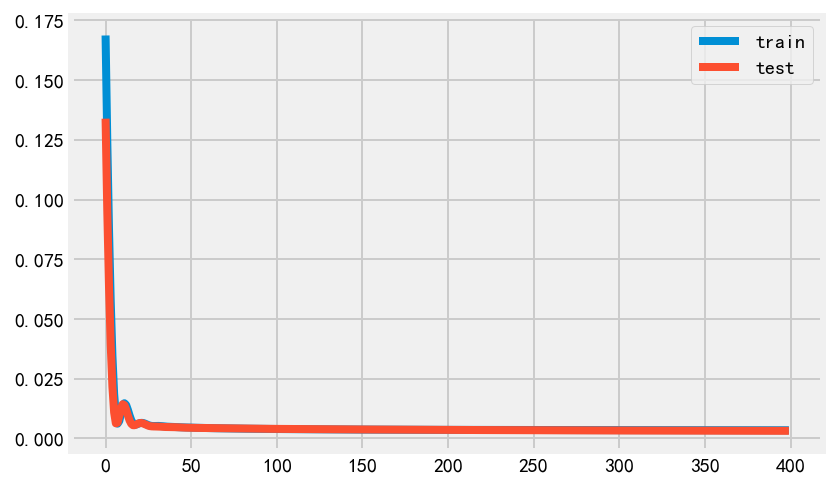

mean_squared_error: 7.6122815e-05
mean_absolute_error: 0.0041648983
r2_score: -0.025773641260520286
Test RMSE: 0.009


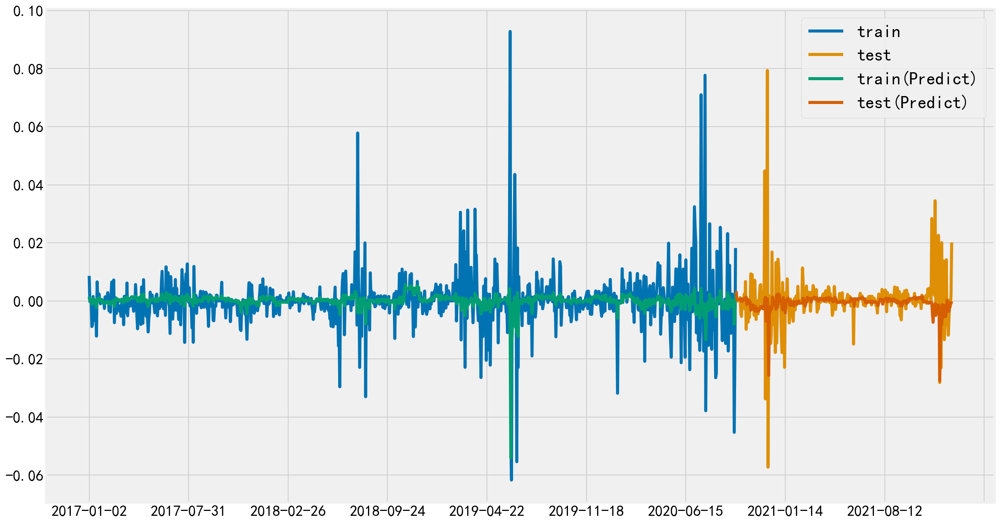

In [662]:
 bond2_pdt1 = my_bond_predict(bond2_pct,bond2,data_market,400)

   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
3   0.455110   0.012940   0.853396   0.521279    0.79661   0.251485   
4   0.397560   0.015538   0.853396   0.521279    0.79661   0.251485   
5   0.397785   0.003425   0.853396   0.521279    0.79661   0.251485   
6   0.401847   0.019050   0.853396   0.521279    0.79661   0.251485   
7   0.342170   0.009954   0.853396   0.521279    0.79661   0.251485   

   var7(t-1)   var1(t)  
3   0.134206  0.397560  
4   0.134206  0.397785  
5   0.134206  0.401847  
6   0.134206  0.342170  
7   0.134206  0.345302  
(976, 1, 7) (976,) (326, 1, 7) (326,)
Epoch 1/400
2/2 - 3s - loss: 0.1521 - val_loss: 0.1210 - 3s/epoch - 1s/step
Epoch 2/400
2/2 - 0s - loss: 0.1119 - val_loss: 0.0858 - 50ms/epoch - 25ms/step
Epoch 3/400
2/2 - 0s - loss: 0.0782 - val_loss: 0.0570 - 51ms/epoch - 26ms/step
Epoch 4/400
2/2 - 0s - loss: 0.0510 - val_loss: 0.0347 - 51ms/epoch - 26ms/step
Epoch 5/400
2/2 - 0s - loss: 0.0304 - val_loss: 0.0190 - 51ms/epoch -

Epoch 95/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0041 - 51ms/epoch - 26ms/step
Epoch 96/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0041 - 50ms/epoch - 25ms/step
Epoch 97/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0041 - 51ms/epoch - 26ms/step
Epoch 98/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0041 - 52ms/epoch - 26ms/step
Epoch 99/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0041 - 51ms/epoch - 26ms/step
Epoch 100/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0041 - 51ms/epoch - 26ms/step
Epoch 101/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0041 - 51ms/epoch - 26ms/step
Epoch 102/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0040 - 54ms/epoch - 27ms/step
Epoch 103/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0040 - 51ms/epoch - 26ms/step
Epoch 104/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0040 - 51ms/epoch - 26ms/step
Epoch 105/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0040 - 50ms/epoch - 25ms/step
Epoch 106/400
2/2 - 0s - loss: 0.0040 - val_loss: 0.0040 - 51ms/epoch - 26ms/step
Epoch 107/400
2/2 - 0

Epoch 195/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0037 - 58ms/epoch - 29ms/step
Epoch 196/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0037 - 60ms/epoch - 30ms/step
Epoch 197/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0037 - 56ms/epoch - 28ms/step
Epoch 198/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0037 - 57ms/epoch - 29ms/step
Epoch 199/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0037 - 55ms/epoch - 28ms/step
Epoch 200/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0037 - 57ms/epoch - 28ms/step
Epoch 201/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0037 - 57ms/epoch - 29ms/step
Epoch 202/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 56ms/epoch - 28ms/step
Epoch 203/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 60ms/epoch - 30ms/step
Epoch 204/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 54ms/epoch - 27ms/step
Epoch 205/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 55ms/epoch - 28ms/step
Epoch 206/400
2/2 - 0s - loss: 0.0036 - val_loss: 0.0036 - 53ms/epoch - 27ms/step
Epoch 207/400
2/

Epoch 295/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0034 - 52ms/epoch - 26ms/step
Epoch 296/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0034 - 54ms/epoch - 27ms/step
Epoch 297/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0034 - 52ms/epoch - 26ms/step
Epoch 298/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0034 - 52ms/epoch - 26ms/step
Epoch 299/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0034 - 52ms/epoch - 26ms/step
Epoch 300/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0034 - 52ms/epoch - 26ms/step
Epoch 301/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0034 - 54ms/epoch - 27ms/step
Epoch 302/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0034 - 56ms/epoch - 28ms/step
Epoch 303/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0034 - 55ms/epoch - 28ms/step
Epoch 304/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0034 - 54ms/epoch - 27ms/step
Epoch 305/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0034 - 53ms/epoch - 26ms/step
Epoch 306/400
2/2 - 0s - loss: 0.0035 - val_loss: 0.0034 - 53ms/epoch - 27ms/step
Epoch 307/400
2/

Epoch 395/400
2/2 - 0s - loss: 0.0034 - val_loss: 0.0032 - 52ms/epoch - 26ms/step
Epoch 396/400
2/2 - 0s - loss: 0.0034 - val_loss: 0.0032 - 51ms/epoch - 26ms/step
Epoch 397/400
2/2 - 0s - loss: 0.0034 - val_loss: 0.0032 - 52ms/epoch - 26ms/step
Epoch 398/400
2/2 - 0s - loss: 0.0034 - val_loss: 0.0032 - 53ms/epoch - 27ms/step
Epoch 399/400
2/2 - 0s - loss: 0.0034 - val_loss: 0.0032 - 57ms/epoch - 29ms/step
Epoch 400/400
2/2 - 0s - loss: 0.0034 - val_loss: 0.0032 - 54ms/epoch - 27ms/step


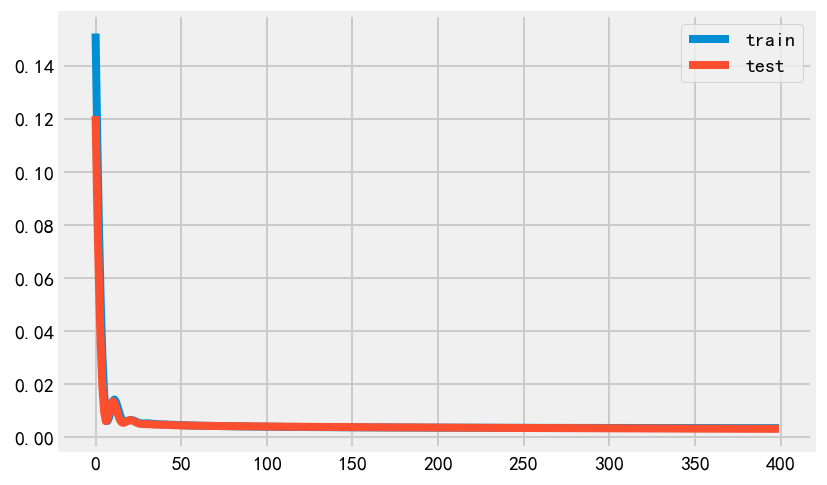

mean_squared_error: 7.600755e-05
mean_absolute_error: 0.0041660233
r2_score: -0.024220439762523638
Test RMSE: 0.009


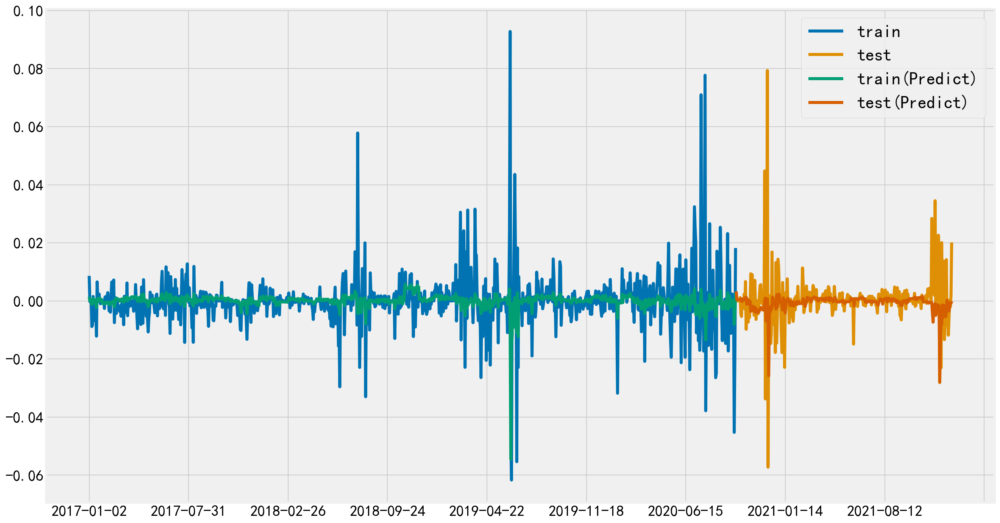

In [663]:
 bond2_pdt2 = my_bond_predict(bond2_pct,bond2,data_market,400)

In [671]:
stock1_pdt1 = stock1_pdt1.loc[~stock1_pdt1.index.duplicated(keep='first')]
stock2_pdt1 = stock2_pdt1.loc[~stock2_pdt1.index.duplicated(keep='first')]
stock3_pdt1 = stock3_pdt1.loc[~stock3_pdt1.index.duplicated(keep='first')]
stock4_pdt1 = stock4_pdt1.loc[~stock4_pdt1.index.duplicated(keep='first')]
stock5_pdt1 = stock5_pdt1.loc[~stock5_pdt1.index.duplicated(keep='first')]
bond1_pdt1 = bond1_pdt1.loc[~bond1_pdt1.index.duplicated(keep='first')]
bond2_pdt1 = bond2_pdt1.loc[~bond2_pdt1.index.duplicated(keep='first')]

table = pd.concat([stock1_pdt1,stock2_pdt1,stock3_pdt1,stock4_pdt1,stock5_pdt1,bond1_pdt1,bond2_pdt1], axis=1)

mean_returns = table.mean()
cov_matrix = returns.cov()
num_portfolios = 5000000
risk_free_rate = 0.022238

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.61
Annualised Volatility: 0.26
Sharpe Ratio: 2.29


               0     1      2     3      4      5     6
allocation  1.27  1.33  26.95  0.31  46.65  22.93  0.56
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.02
Annualised Volatility: 0.06
Sharpe Ratio: -0.06


              0     1     2      3     4      5      6
allocation  0.4  1.56  1.39  12.36  5.79  65.16  13.34


C:\Users\DaryLLS\AppData\Local\Temp\ipykernel_20504\3480854941.py:51: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


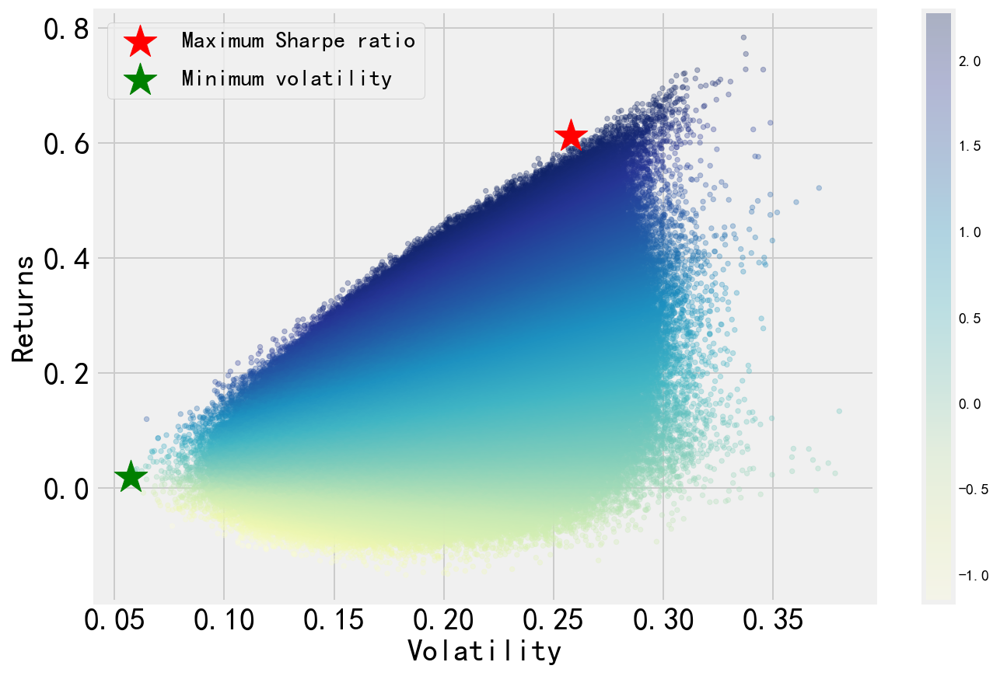

In [672]:
display_simulated_ef_with_random(mean_returns, cov_matrix, num_portfolios, risk_free_rate)

In [16]:
table = pd.DataFrame({'stock1':stock1['收盘'],'stock2':stock2['收盘'],'stock3':stock3['收盘'],
                      'stock4':stock4['收盘'],'stock5':stock5['收盘'],'bond1':bond1['close'],
                      'bond2':bond2['close']})
returns = table.pct_change()
mean_returns = returns.mean()
cov_matrix = returns.cov()
num_portfolios = 5000000
risk_free_rate = 0.022238

def portfolio_annualised_performance(weights, mean_returns, cov_matrix):
    returns = np.sum(mean_returns*weights )*252
    std = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights))) * np.sqrt(252)
    return std, returns

def random_portfolios(num_portfolios, mean_returns, cov_matrix, risk_free_rate):
    results = np.zeros((3,num_portfolios))
    weights_record = []
    for i in range(num_portfolios):
        weights = np.random.random(7)
        weights /= np.sum(weights)
        weights_record.append(weights)
        portfolio_std_dev, portfolio_return = portfolio_annualised_performance(weights, mean_returns, cov_matrix)
        results[0,i] = portfolio_std_dev
        results[1,i] = portfolio_return
        results[2,i] = (portfolio_return - risk_free_rate) / portfolio_std_dev
    return results, weights_record


weights = np.array([0.0127, 0.0133, 0.2695, 0.0031, 0.4665, 0.2293, 0.0056])
portfolio_annualised_performance(weights, mean_returns, cov_matrix)

(0.25763259746510286, 0.3315074628787316)